In [3]:
import os
from datetime import date
import pandas as pd
import empyrical as empy
import matplotlib.pyplot as plt

from sklearn.metrics import (
    precision_score, accuracy_score, confusion_matrix, 
    mean_squared_error, recall_score, f1_score
)

import warnings
warnings.filterwarnings("ignore")

In [4]:
def read_kpi2ret(result_excel_name, start=None, end=None):
    hist = pd.read_excel(result_excel_name, index_col=0, sheet_name='History')
    hist.index = pd.to_datetime(hist.index)
    balance = hist['Balance']
    balance_ = pd.concat([pd.Series(1e9),balance])
    ret = balance_.pct_change().ffill().dropna()
    ret.index = pd.to_datetime(ret.index)
    if start is not None:
        ret = ret[start:]
    if end is not None:
        ret = ret[:end]
    return ret


def cal_metric(y_true, y_pred):

    if isinstance(y_pred, pd.DataFrame):
        prec_ser = pd.Series(index=y_pred.columns, name='precision')
        acccc_ser = pd.Series(index=y_pred.columns, name='accuracy')
        recall_ser = pd.Series(index=y_pred.columns, name='recall')
        recall0_ser = pd.Series(index=y_pred.columns, name='recall0')
        f1_score_ser = pd.Series(index=y_pred.columns, name='f1_score')
        f0_score_ser = pd.Series(index=y_pred.columns, name='f0_score')
        for col in y_pred.columns:
            # print("   *********************************  ", col)
            if isinstance(y_true, pd.DataFrame):
                tmp_y_true = y_true[col]
            else:
                tmp_y_true = y_true.copy()
            prec_ser[col], acccc_ser[col], recall_ser[col], recall0_ser[col], f1_score_ser[col], f0_score_ser[col] = cal_metric(
                tmp_y_true, y_pred[col])
        return prec_ser, acccc_ser, recall_ser, recall0_ser, f1_score_ser, f0_score_ser

    y_true = y_true.reindex(y_pred.index)
    tmp = pd.concat([y_true, y_pred], axis=1).dropna()
    y_true = tmp.iloc[:, 0]
    y_pred = tmp.iloc[:, -1]
    # print("y_pred\n", y_pred)
    # print("y_true\n", y_true)
    # pd.concat([y_proba, y_pred, y_pctch, y_true, ydelta_true], axis=1).to_csv("./tmp/{}.csv".format(y_pctch.name))

    try:
        prec = precision_score(y_true=y_true, y_pred=y_pred)
        acccc = accuracy_score(y_true=y_true, y_pred=y_pred)
    except Exception as e:
        print(e)
        prec = 0
        acccc = 0

    try:
        recall = recall_score(y_true=y_true, y_pred=y_pred)
        recall0 = recall_score(y_true=y_true, y_pred=y_pred, pos_label=0)
    except Exception as e:
        print(e)
        recall = 0
        recall0 = 0

    try:
        f1score = f1_score(y_true=y_true, y_pred=y_pred)
        f0score = f1_score(y_true=y_true, y_pred=y_pred, pos_label=0)
    except Exception as e:
        print(e)
        f1score = 0
        f0score = 0
    # print("mse, mse_proba, msefullscore, msefullscore_ret, prec, acccc, recall, recall0")
    # print(mse, mse_proba, msefullscore, msefullscore_ret, prec, acccc, recall, recall0)
    return prec, acccc, recall, recall0, f1score, f0score

In [5]:
assets = ['DBC', 'EEM', 'IYR', 'TLT', 'VTI', 'SPY', 'QQQ', 'VGK', 'EWJ', 'GLD', 'LQD', 'VYM', 'TIP']
base_no3vote = './result/2022/MPT_kpi/1.5.1b/'
mpt_v = '151b'
start = '2008'
end = '2022-07'
client_ret = {}
for result_excel_name in os.listdir(base_no3vote):
    if result_excel_name.endswith('.xlsx'):
        client = result_excel_name.replace('.xlsx', '').split('_')[-1]
        ret = read_kpi2ret(os.path.join(base_no3vote, result_excel_name), start, end)
        ret.name = client
        client_ret[client] = ret

In [6]:
preds_csv = [
    ('./data/data_price/data_price_xxz.csv', [0], ['xxz'], [1, 5, 10, 21]),
    ('./data/data_price/data_price_xzz.csv', [0], ['xzz'], [1, 5, 10, 21]),
    ('./data/data_price/data_price(13ETFs).csv', None, None, [1, 5, 10, 21])
]


preds = pd.DataFrame()
rets = pd.DataFrame()
for f, col, col_name, pps in preds_csv:
    print(f, col, col_name, pps)
    df = pd.read_csv(f, index_col=0)
    df.index = pd.to_datetime(df.index)
    if col is not None:
        df = df.iloc[:, col]
        df.columns = col_name

    for pp in pps:
        df_pct = df.pct_change(pp)
        df_pct.columns = ["{}_pp{}".format(c, pp) for c in df_pct.columns]
        rets = pd.concat([rets, df_pct], axis=1)
        df_pct = (df_pct>=0).astype(int)
        preds = pd.concat([preds, df_pct], axis=1)

preds = preds.dropna()
rets = rets.dropna()
display(preds.columns)
preds

./data/data_price/data_price_xxz.csv [0] ['xxz'] [1, 5, 10, 21]
./data/data_price/data_price_xzz.csv [0] ['xzz'] [1, 5, 10, 21]
./data/data_price/data_price(13ETFs).csv None None [1, 5, 10, 21]


Index(['xxz_pp1', 'xxz_pp5', 'xxz_pp10', 'xxz_pp21', 'xzz_pp1', 'xzz_pp5',
       'xzz_pp10', 'xzz_pp21', 'DBC_pp1', 'EEM_pp1', 'EWJ_pp1', 'GLD_pp1',
       'IYR_pp1', 'LQD_pp1', 'QQQ_pp1', 'SPY_pp1', 'TIP_pp1', 'TLT_pp1',
       'VGK_pp1', 'VTI_pp1', 'VYM_pp1', 'DBC_pp5', 'EEM_pp5', 'EWJ_pp5',
       'GLD_pp5', 'IYR_pp5', 'LQD_pp5', 'QQQ_pp5', 'SPY_pp5', 'TIP_pp5',
       'TLT_pp5', 'VGK_pp5', 'VTI_pp5', 'VYM_pp5', 'DBC_pp10', 'EEM_pp10',
       'EWJ_pp10', 'GLD_pp10', 'IYR_pp10', 'LQD_pp10', 'QQQ_pp10', 'SPY_pp10',
       'TIP_pp10', 'TLT_pp10', 'VGK_pp10', 'VTI_pp10', 'VYM_pp10', 'DBC_pp21',
       'EEM_pp21', 'EWJ_pp21', 'GLD_pp21', 'IYR_pp21', 'LQD_pp21', 'QQQ_pp21',
       'SPY_pp21', 'TIP_pp21', 'TLT_pp21', 'VGK_pp21', 'VTI_pp21', 'VYM_pp21'],
      dtype='object')

,xxz_pp1,xxz_pp5,xxz_pp10,xxz_pp21,xzz_pp1,xzz_pp5,xzz_pp10,xzz_pp21,DBC_pp1,EEM_pp1,...,GLD_pp21,IYR_pp21,LQD_pp21,QQQ_pp21,SPY_pp21,TIP_pp21,TLT_pp21,VGK_pp21,VTI_pp21,VYM_pp21
1999-12-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,...,0,0,0,1,1,0,0,0,0,0
2000-01-03,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0,...,0,0,0,1,1,0,0,0,0,0
2000-01-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,...,0,0,0,1,0,0,0,0,0,0
2000-01-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,...,0,0,0,1,0,0,0,0,0,0
2000-01-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-24,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1,0,...,1,1,0,1,1,0,0,1,1,1
2022-08-25,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0,1,...,1,1,0,1,1,0,0,0,1,1
2022-08-26,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1,0,...,0,0,0,0,0,0,0,0,1,1
2022-08-29,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [7]:
rets

,xxz_pp1,xxz_pp5,xxz_pp10,xxz_pp21,xzz_pp1,xzz_pp5,xzz_pp10,xzz_pp21,DBC_pp1,EEM_pp1,...,GLD_pp21,IYR_pp21,LQD_pp21,QQQ_pp21,SPY_pp21,TIP_pp21,TLT_pp21,VGK_pp21,VTI_pp21,VYM_pp21
2006-12-18,-0.002984,-0.004104,-0.008846,0.013865,-0.002979,-0.002659,-0.006702,0.024808,-0.041144,-0.006954,...,-0.004404,0.036285,0.004387,-0.006998,0.011184,0.000803,0.003578,0.037004,0.015472,0.025565
2006-12-19,0.001087,-0.002230,-0.009359,0.011560,0.001219,-0.000538,-0.007573,0.022828,0.011851,-0.006294,...,0.000324,0.029557,0.000930,-0.010158,0.012819,-0.001904,-0.003446,0.044076,0.017424,0.027305
2006-12-20,0.000575,0.000142,-0.004273,0.011705,0.000682,0.001582,-0.002380,0.017630,0.002019,-0.003122,...,-0.002428,-0.006804,0.000930,-0.015769,0.011673,-0.002805,-0.005106,0.039791,0.016406,0.026305
2006-12-21,-0.001041,-0.004313,-0.003685,0.007742,-0.001327,-0.003846,-0.002131,0.010694,-0.010077,-0.001790,...,-0.014293,-0.032864,0.002135,-0.024072,0.006968,-0.002200,-0.002547,0.030762,0.009833,0.024356
2006-12-22,-0.003157,-0.005516,-0.003209,0.002080,-0.003191,-0.005592,-0.001672,0.005028,0.007736,0.003586,...,-0.013600,-0.043071,-0.002133,-0.040241,-0.001206,-0.007592,-0.011828,-0.004138,-0.003722,0.017026
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-24,0.001080,-0.003210,-0.009581,0.007713,-0.000088,-0.004353,-0.014598,-0.003396,0.010518,-0.000251,...,0.020058,0.023862,-0.017843,0.070116,0.058277,-0.002766,-0.053286,0.003208,0.061414,0.040657
2022-08-25,0.004122,-0.003699,-0.000874,0.004370,0.004580,-0.004432,-0.003203,-0.004376,-0.014126,0.021635,...,0.012866,0.031033,-0.014286,0.044881,0.046055,-0.006011,-0.034669,-0.011056,0.049238,0.040943
2022-08-26,-0.004737,-0.001152,-0.011992,-0.008796,-0.000598,0.003428,-0.009892,-0.012429,0.004148,-0.014775,...,-0.011489,-0.026620,-0.028249,-0.007650,-0.001872,-0.017511,-0.035074,-0.045813,0.001425,0.005965
2022-08-29,-0.001792,0.001033,-0.011619,-0.013894,-0.001837,0.004012,-0.008354,-0.015991,0.014645,-0.006248,...,-0.013650,-0.040847,-0.037693,-0.035028,-0.022719,-0.026220,-0.040450,-0.060043,-0.019248,-0.005358


In [8]:
client_ret_df = pd.concat(client_ret.values(), keys=client_ret.keys(), axis=1)
client_ret_df

,agg,con,ficon,mod
2008-01-02,0.021396,0.005236,0.009580,0.014142
2008-01-03,0.004646,0.001777,0.002535,0.003119
2008-01-04,-0.008659,-0.004346,-0.006457,-0.005822
2008-01-07,-0.003819,-0.000517,-0.002890,-0.002562
2008-01-08,0.002096,0.000090,0.001173,0.001404
...,...,...,...,...
2022-07-25,-0.000750,-0.000930,0.000184,0.002283
2022-07-26,-0.002205,-0.001096,-0.000631,-0.001233
2022-07-27,0.009416,0.004479,0.005019,0.011265
2022-07-28,0.009641,0.004763,0.005366,0.007475


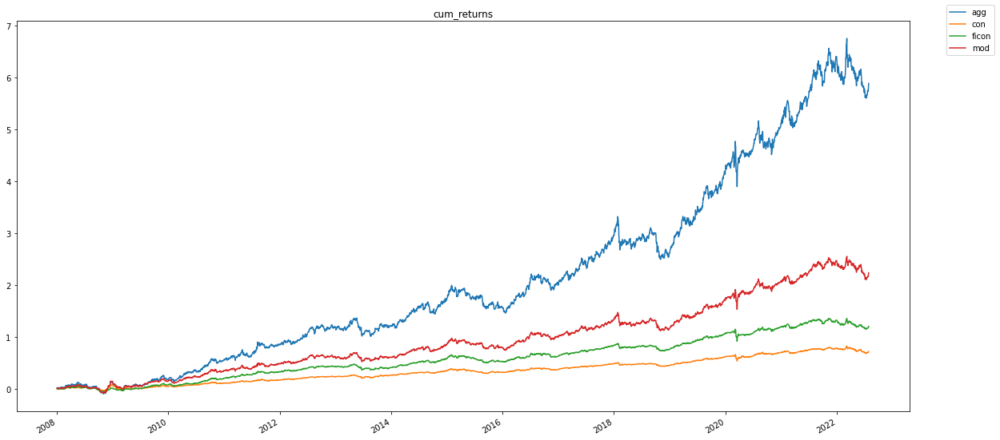

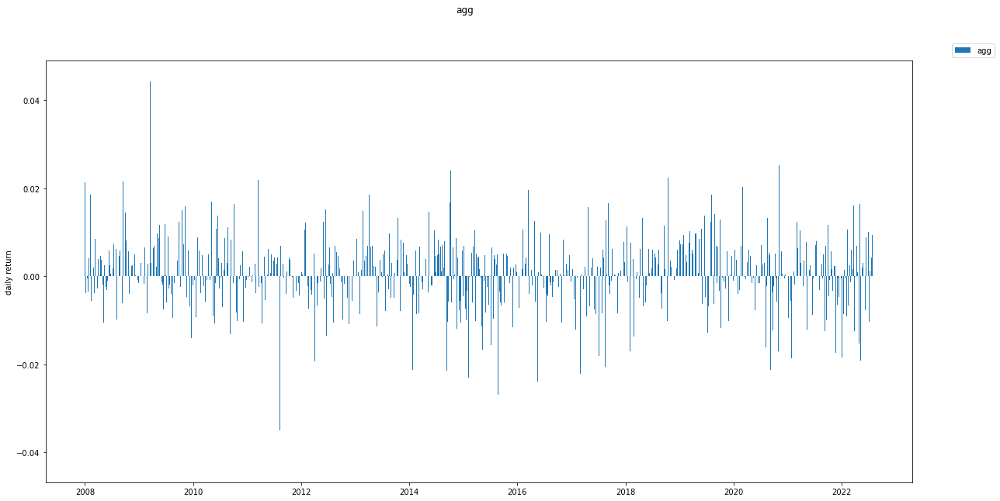

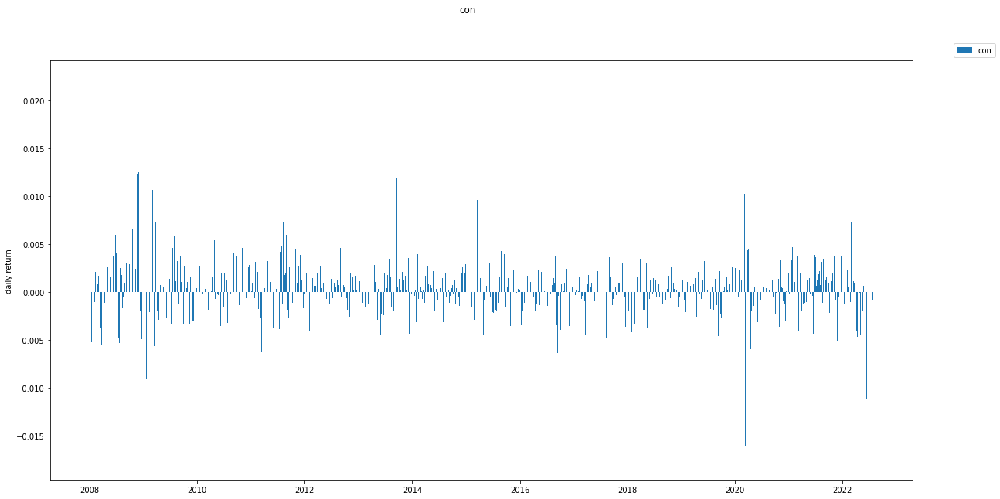

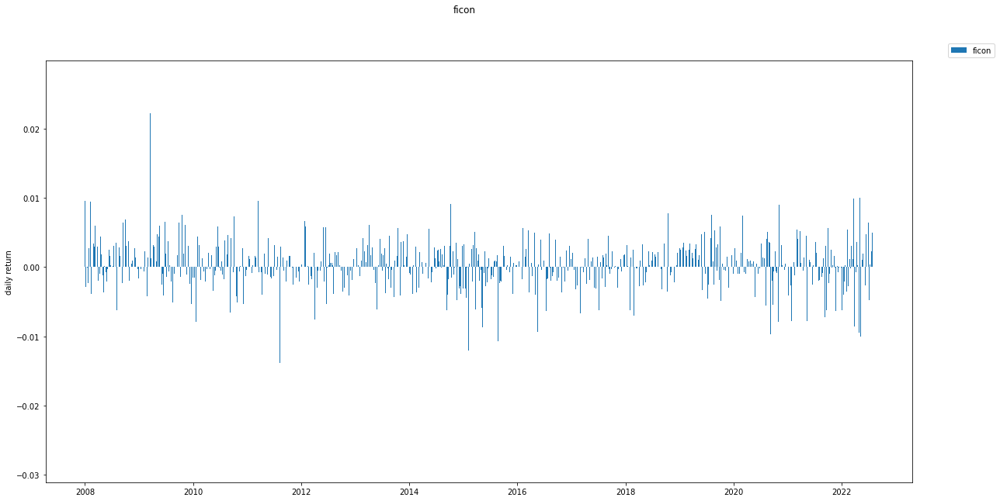

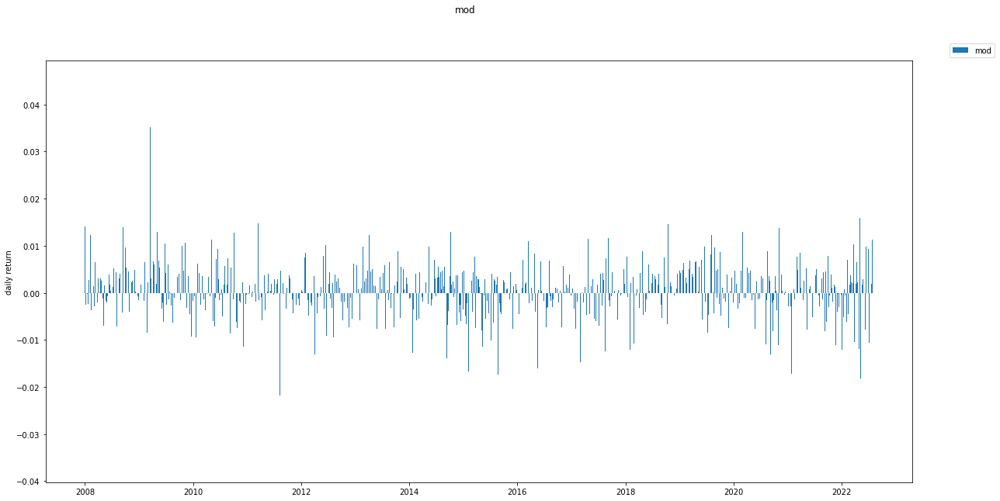

In [9]:
cum_returns = empy.cum_returns(client_ret_df)
cum_returns.plot(figsize=(20, 10), title='cum_returns').legend(bbox_to_anchor=(1.1, 1.05))
client_ret_df.index = pd.to_datetime(client_ret_df.index)

for client in client_ret_df.columns:
    # ax = client_ret_df[client].plot.bar(figsize=(20, 10), title='daily return')
    # for i, t in enumerate(ax.get_xticklabels()):
    #     if (i % 252*3) != 0:
    #         t.set_visible(False)
    # ax.legend(bbox_to_anchor=(1.1, 1.05))


    fig, ax = plt.subplots(1, 1, figsize=(20, 10))
    fig.suptitle(client)

    ax.bar(client_ret_df[client].index, client_ret_df[client].values, label=client)
    ax.set_ylabel('daily return')
    ax.legend(bbox_to_anchor=(1.1, 1.05))


In [10]:
asset_daily_ret = rets.loc[:, (rets.columns.str.endswith('_pp1')) & ~((rets.columns.str.startswith('xxz_')) | (rets.columns.str.startswith('xzz_')))]
asset_daily_ret

,DBC_pp1,EEM_pp1,EWJ_pp1,GLD_pp1,IYR_pp1,LQD_pp1,QQQ_pp1,SPY_pp1,TIP_pp1,TLT_pp1,VGK_pp1,VTI_pp1,VYM_pp1
2006-12-18,-0.041144,-0.006954,-0.006360,0.000656,-0.002959,0.000093,-0.009903,-0.002740,-0.001803,0.000334,0.001585,-0.004093,-0.001929
2006-12-19,0.011851,-0.006294,-0.004267,0.012451,-0.007715,-0.000186,-0.003183,0.001902,-0.000702,-0.001337,0.005468,0.001417,0.003285
2006-12-20,0.002019,-0.003122,0.000000,-0.002913,-0.004785,0.000744,-0.003649,-0.000563,-0.000602,-0.000112,-0.005295,-0.000425,-0.000578
2006-12-21,-0.010077,-0.001790,0.005714,-0.003895,-0.009615,0.002601,-0.007095,-0.003658,0.002210,0.005021,-0.002158,-0.003894,-0.003083
2006-12-22,0.007736,0.003586,0.003551,0.004399,-0.007767,-0.003150,-0.010373,-0.006143,-0.004110,-0.007660,-0.028547,-0.010661,-0.006959
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-24,0.010518,-0.000251,-0.000362,0.002949,0.005964,-0.002974,0.002897,0.003201,-0.000173,-0.007319,0.002074,0.004206,0.001487
2022-08-25,-0.014126,0.021635,0.011419,0.003063,0.015435,0.010304,0.017682,0.014118,0.003120,0.013936,0.009594,0.014489,0.012157
2022-08-26,0.004148,-0.014775,-0.024373,-0.012153,-0.024562,-0.005994,-0.040988,-0.033849,-0.001469,0.007538,-0.029812,-0.033120,-0.025947
2022-08-29,0.014645,-0.006248,-0.010103,0.000618,-0.008875,-0.007380,-0.009856,-0.006612,-0.003893,-0.008273,0.001152,-0.007312,-0.004047


In [15]:
## sliding correlation 13 assets
lookback = [10, 15, 20, 50] 

corr_dict = {}
corr_avg = pd.DataFrame()
corr_avg_abs = pd.DataFrame()
corr_std = pd.DataFrame()
corr_std_abs = pd.DataFrame()
for lb in lookback:
    asset_daily_corr = asset_daily_ret.rolling(lb).corr().dropna()
    corr_dict[lb] = asset_daily_corr

    asset_daily_corr_avg = asset_daily_corr.groupby(level=0).apply(lambda x: x.values.mean())
    # display(asset_daily_corr_avg)
    corr_avg[lb] = asset_daily_corr_avg

    asset_daily_corr_avg_abs = asset_daily_corr.groupby(level=0).apply(lambda x: x.abs().values.mean())
    # display(asset_daily_corr_avg_abs)
    corr_avg_abs[lb] = asset_daily_corr_avg_abs

    asset_daily_corr_std = asset_daily_corr.groupby(level=0).apply(lambda x: x.values.std())
    # display(asset_daily_corr_std)
    corr_std[lb] = asset_daily_corr_std

    asset_daily_corr_std_abs = asset_daily_corr.groupby(level=0).apply(lambda x: x.abs().values.std())
    # display(asset_daily_corr_std_abs)
    corr_std_abs[lb] = asset_daily_corr_std_abs


In [ ]:
for lb in lookback:
    asset_daily_corr_avg = corr_avg[lb]
    asset_daily_corr_std = corr_std[lb]
    asset_daily_corr_avg.plot(figsize=(20, 10), title='{} corr_avg'.format(lb)).legend(bbox_to_anchor=(1.1, 1.05))
    plt.show()
    plt.clf()
    asset_daily_corr_avg.pct_change().plot(figsize=(20, 10), title='{} corr_avg pct_change'.format(lb)).legend(bbox_to_anchor=(1.1, 1.05))
    plt.show()
    plt.clf()
    asset_daily_corr_std.plot(figsize=(20, 10), title='{} corr_std'.format(lb)).legend(bbox_to_anchor=(1.1, 1.05))
    plt.show()
    plt.clf()
    asset_daily_corr_std.pct_change().plot(figsize=(20, 10), title='{} corr_std pct_change'.format(lb)).legend(bbox_to_anchor=(1.1, 1.05))
    plt.show()
    plt.clf()


Text(0.5, 0.98, '2022 corr_avg histogram')

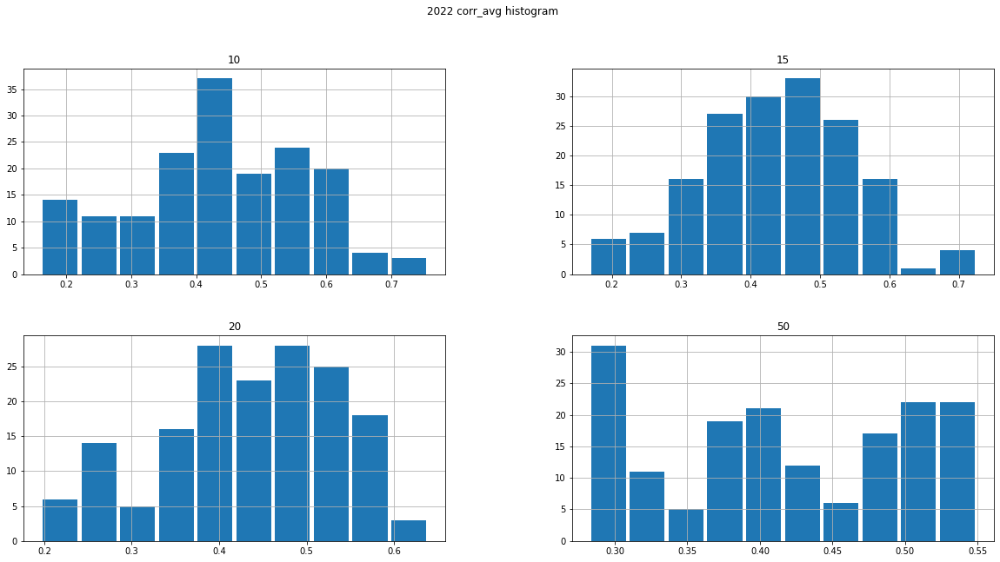

In [38]:

    # fig, ax = plt.subplots(figsize=(20, 10))
    # plt.suptitle('{} corr_avg histogram'.format(y))
    corr_avg[str(y)].hist(grid=True, bins=10, rwidth=0.9, figsize=(20, 10))#, density=True
    plt.suptitle('{} corr_avg histogram'.format(y))


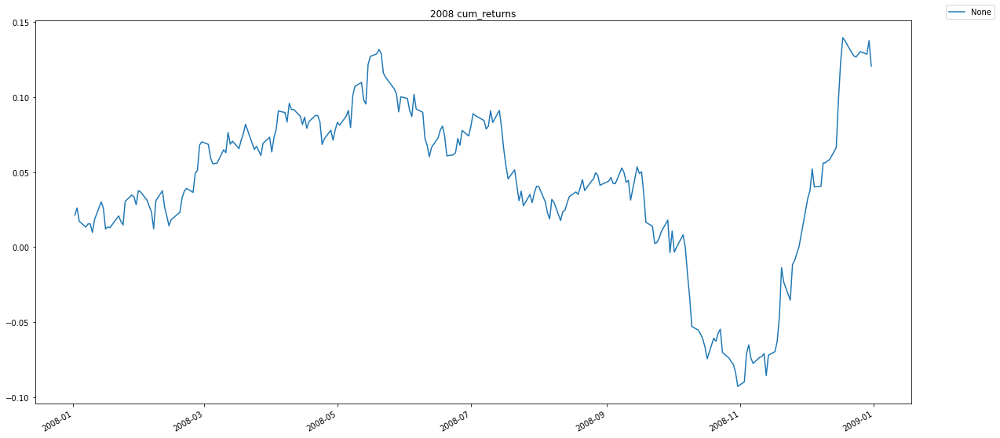

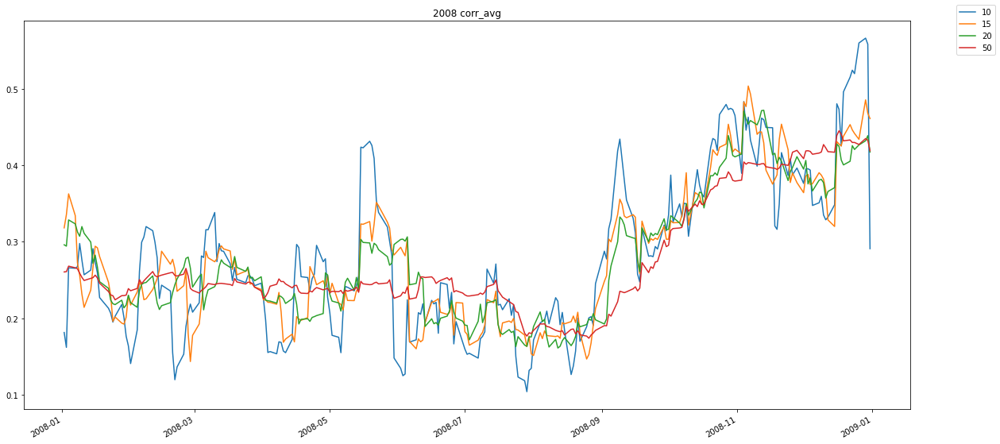

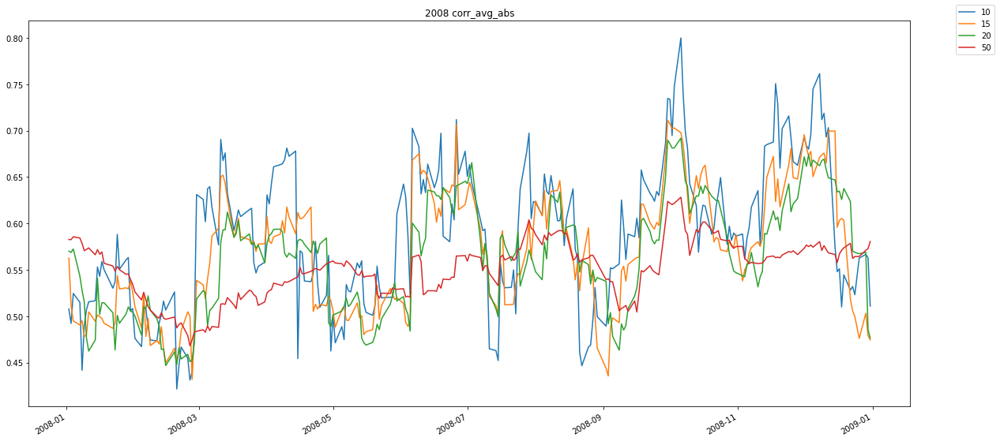

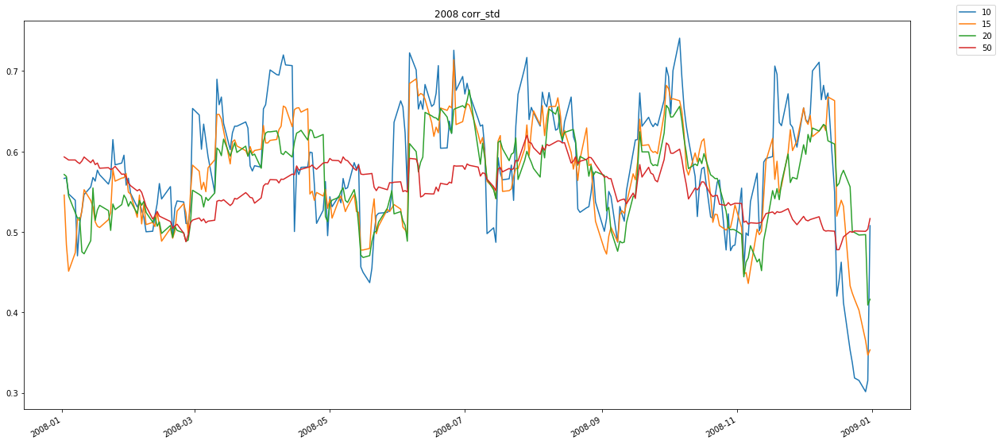

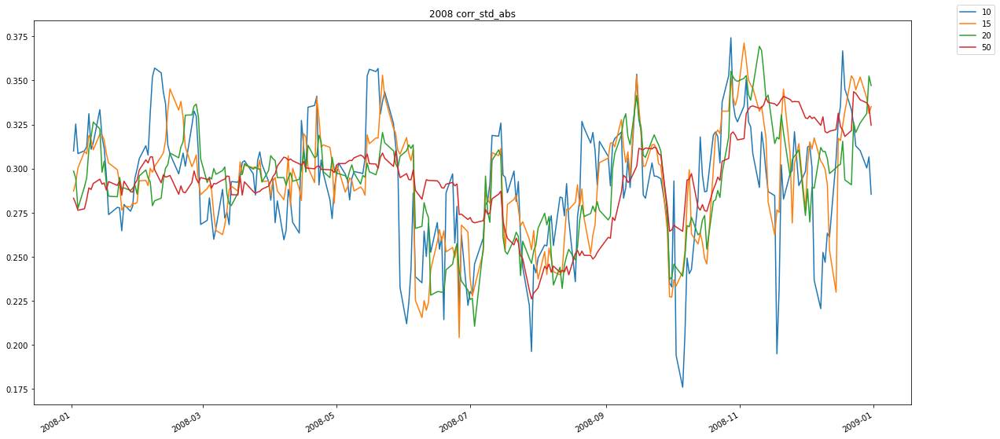

<Figure size 432x288 with 0 Axes>

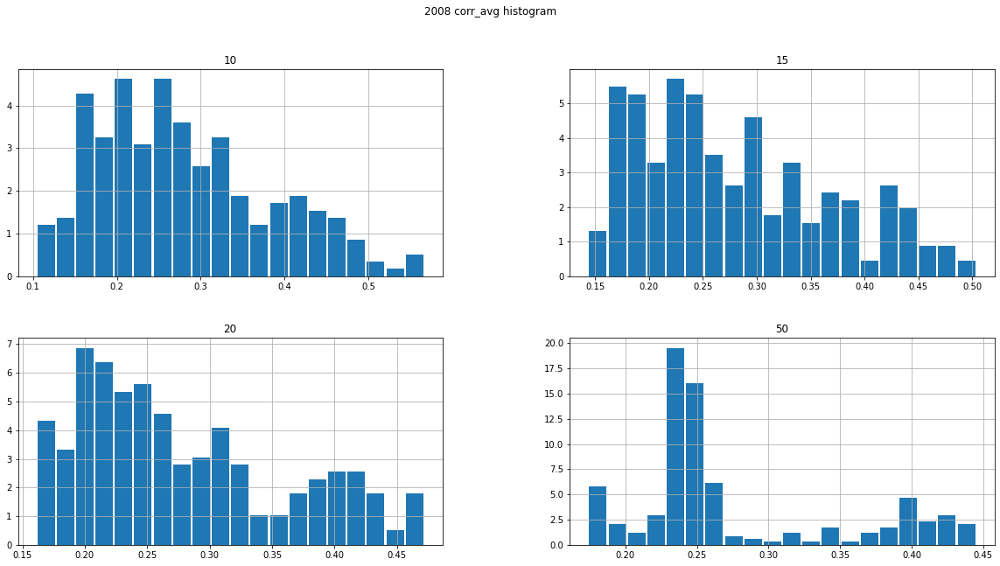

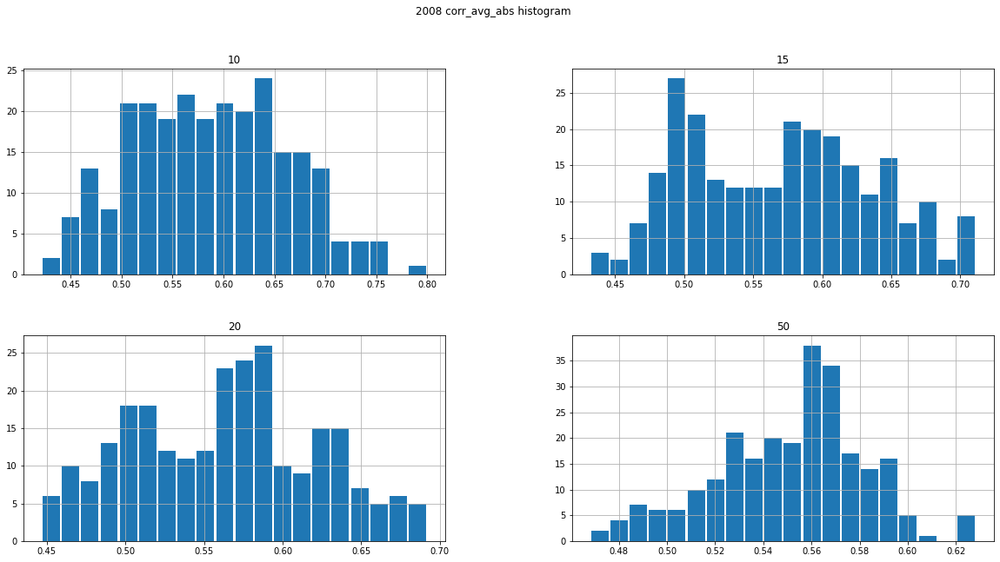

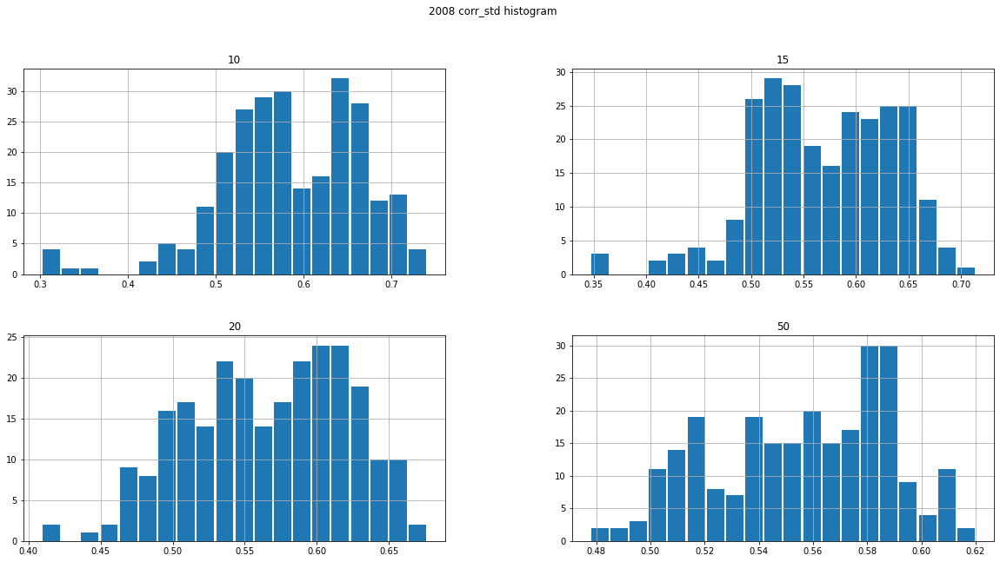

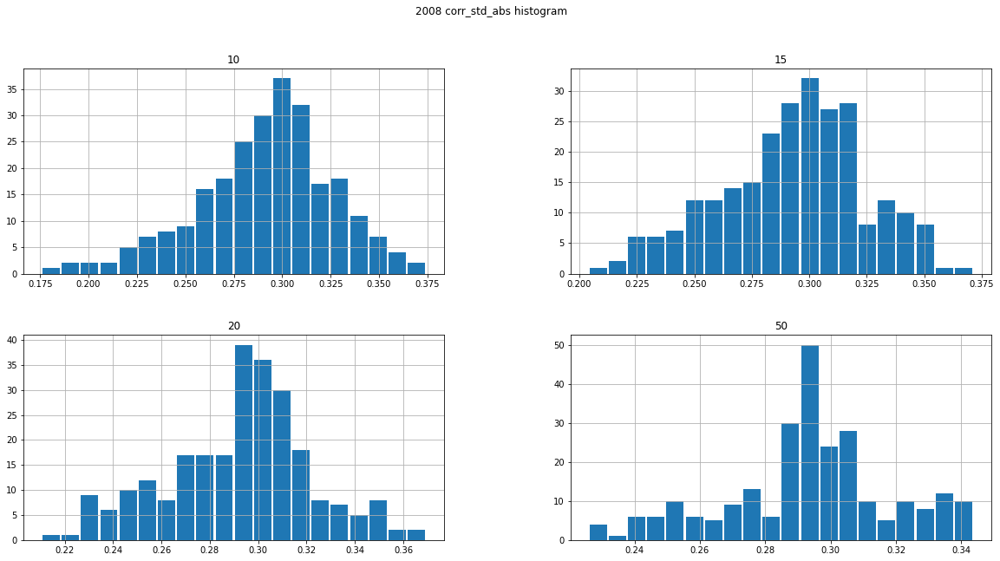

<Figure size 432x288 with 0 Axes>

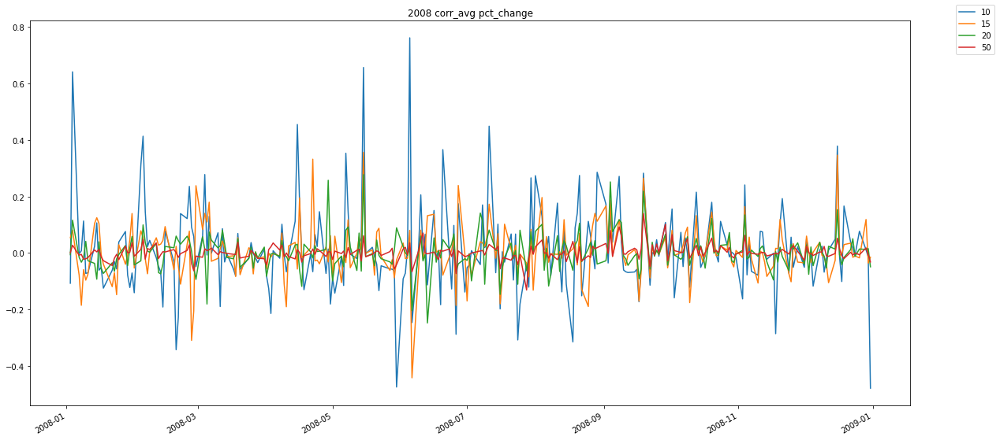

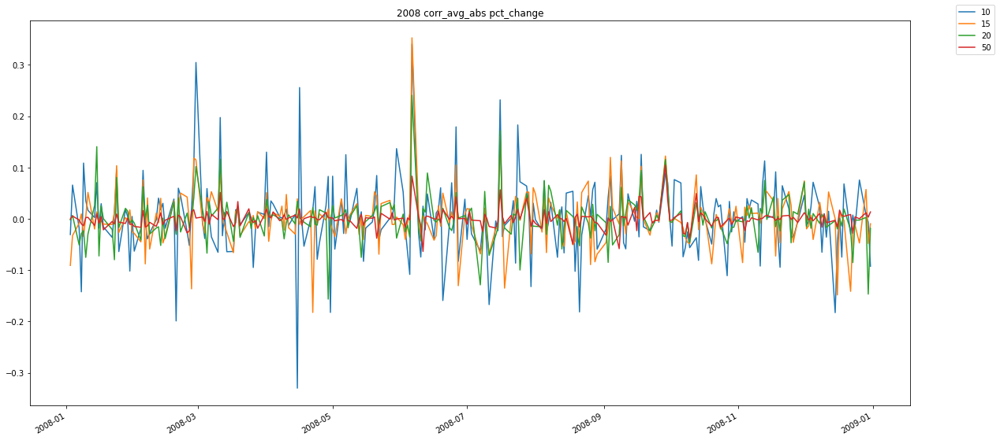

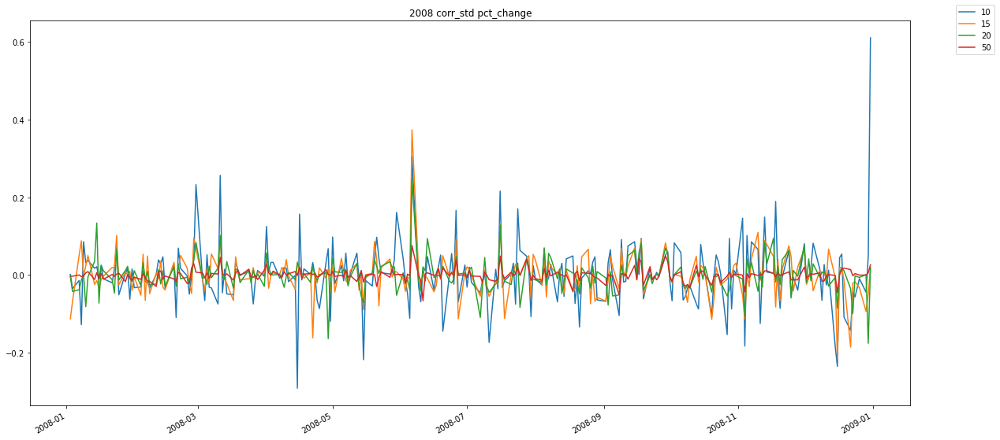

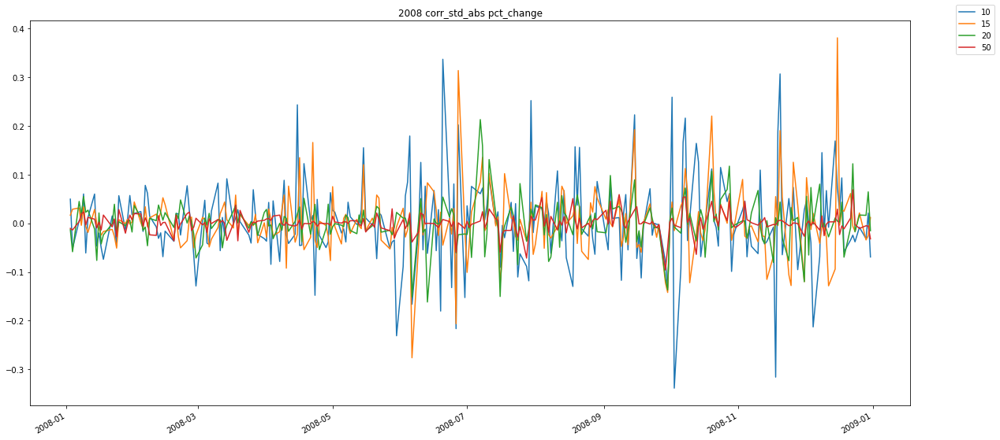

<Figure size 432x288 with 0 Axes>

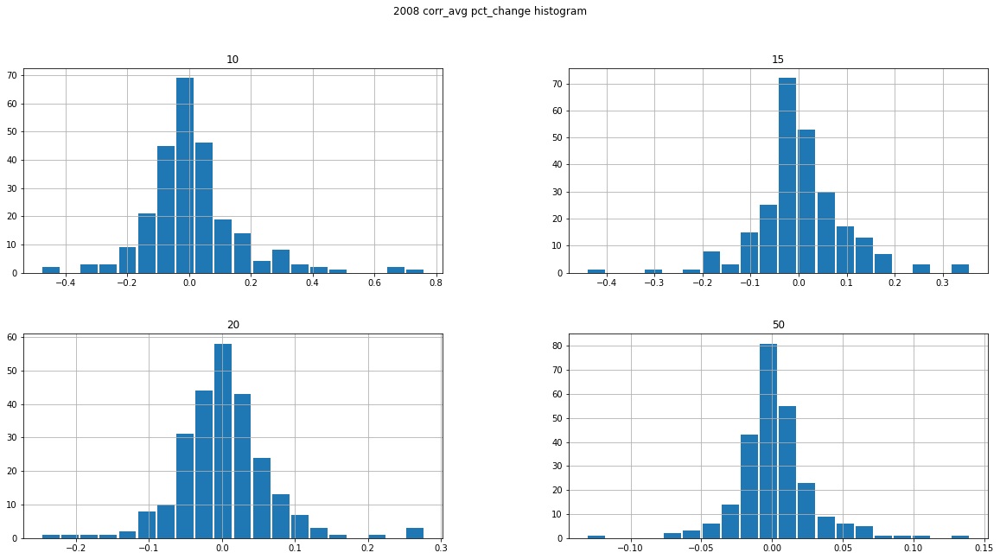

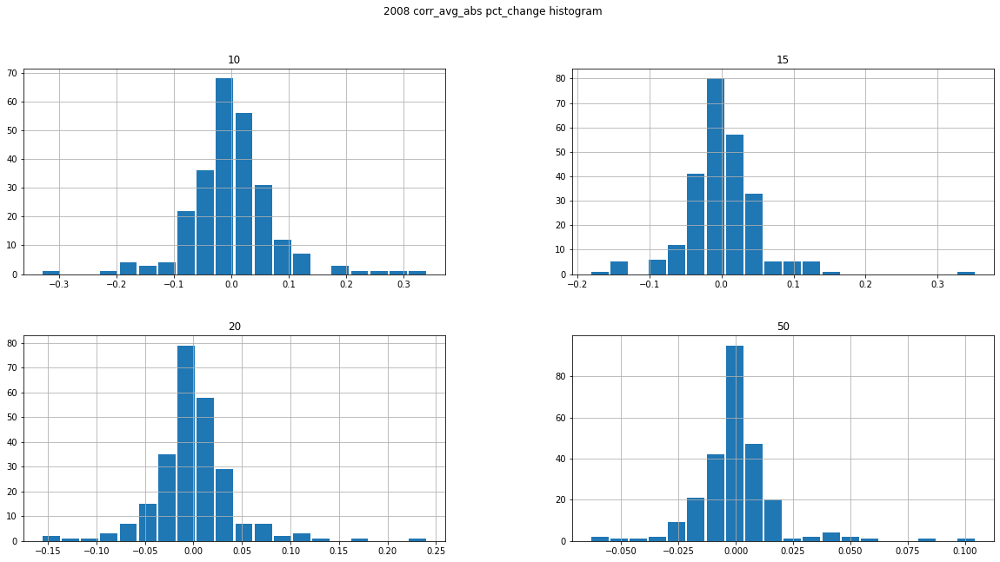

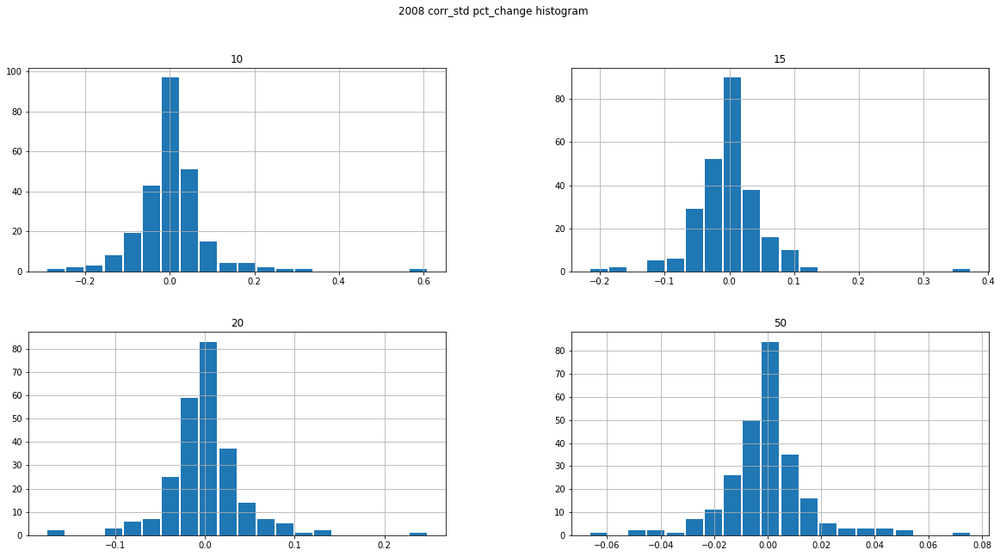

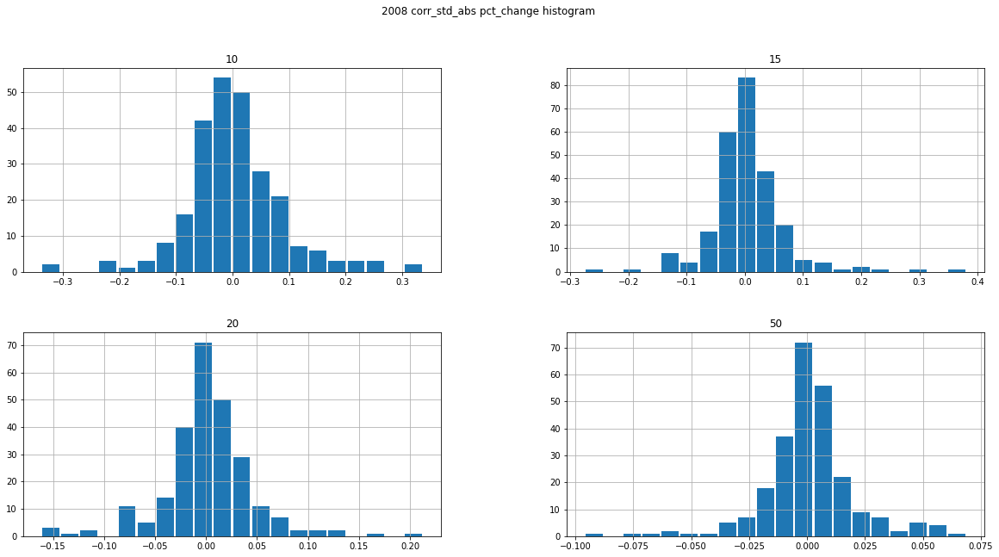

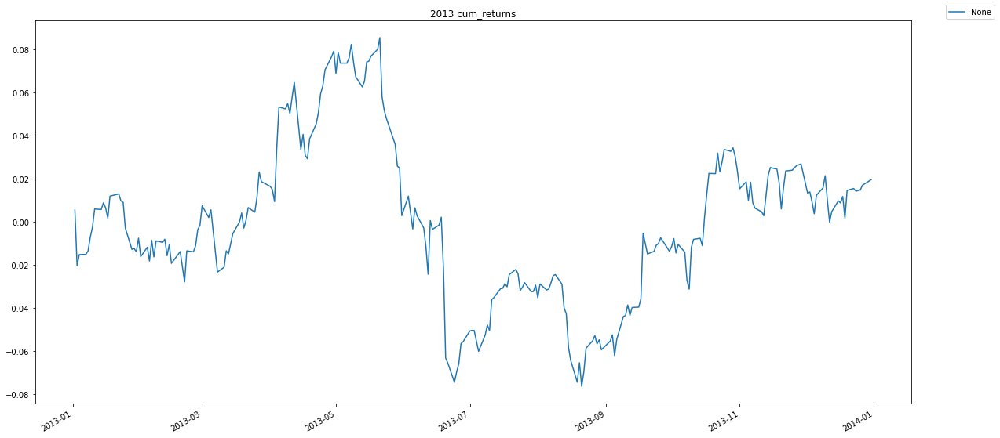

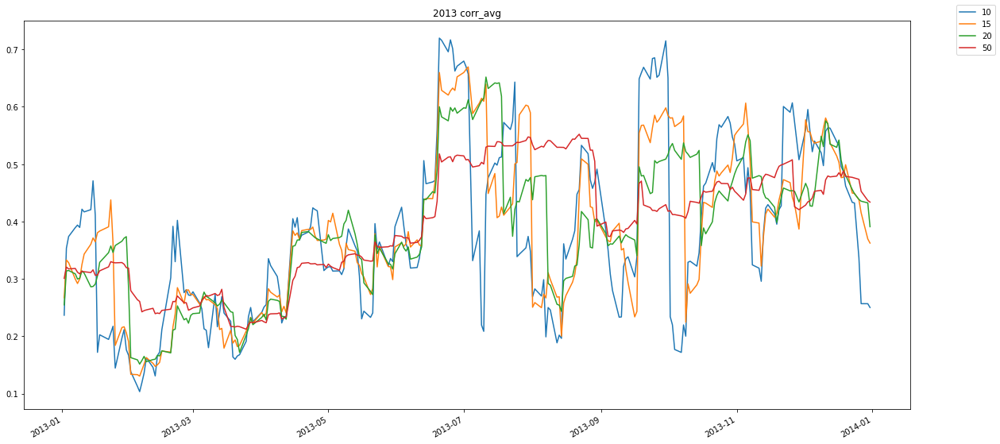

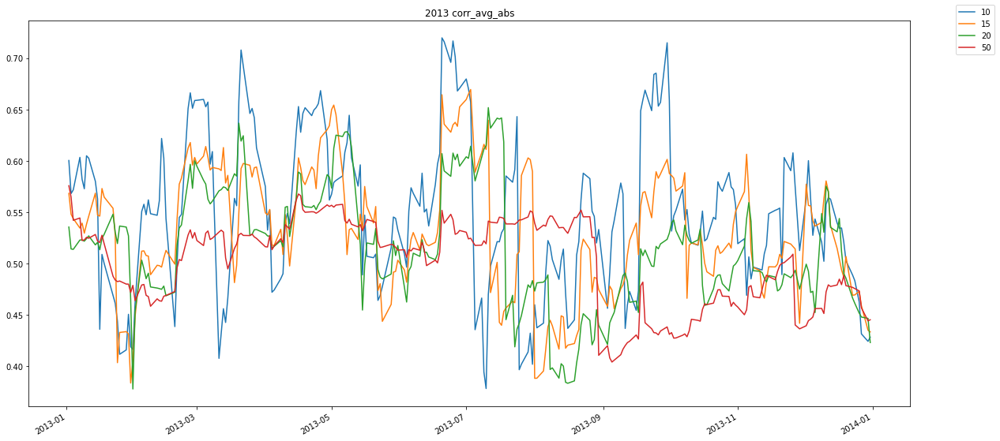

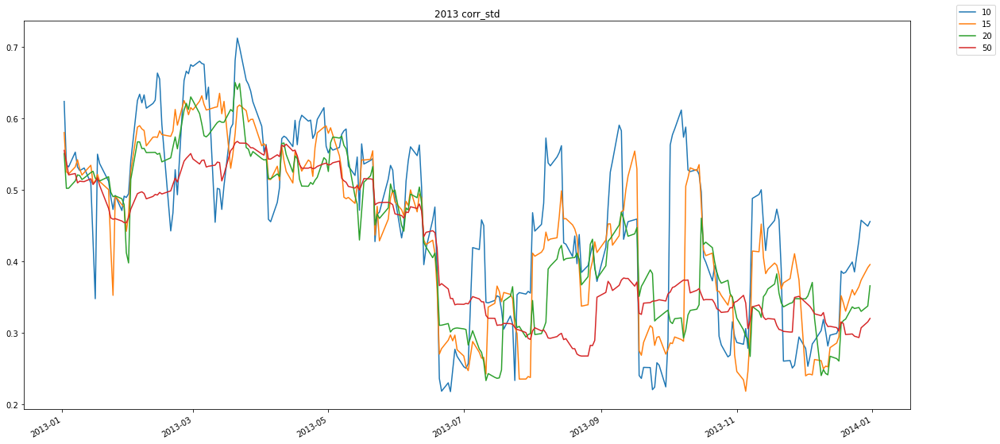

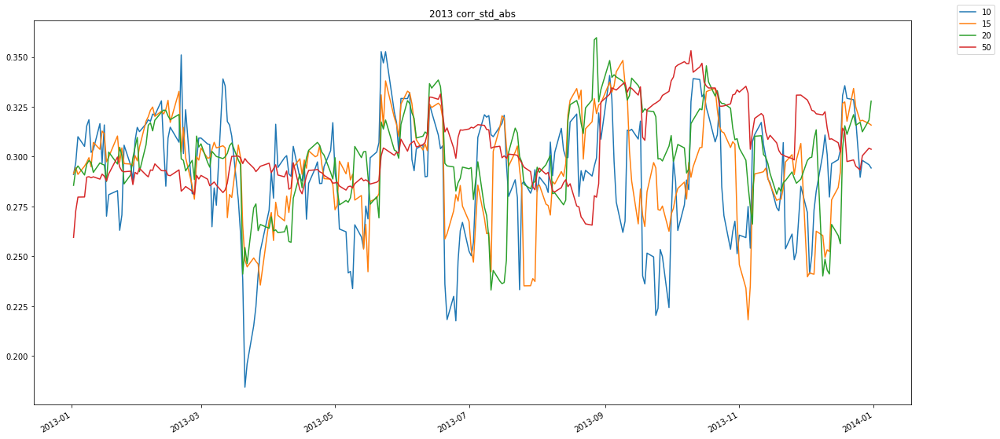

<Figure size 432x288 with 0 Axes>

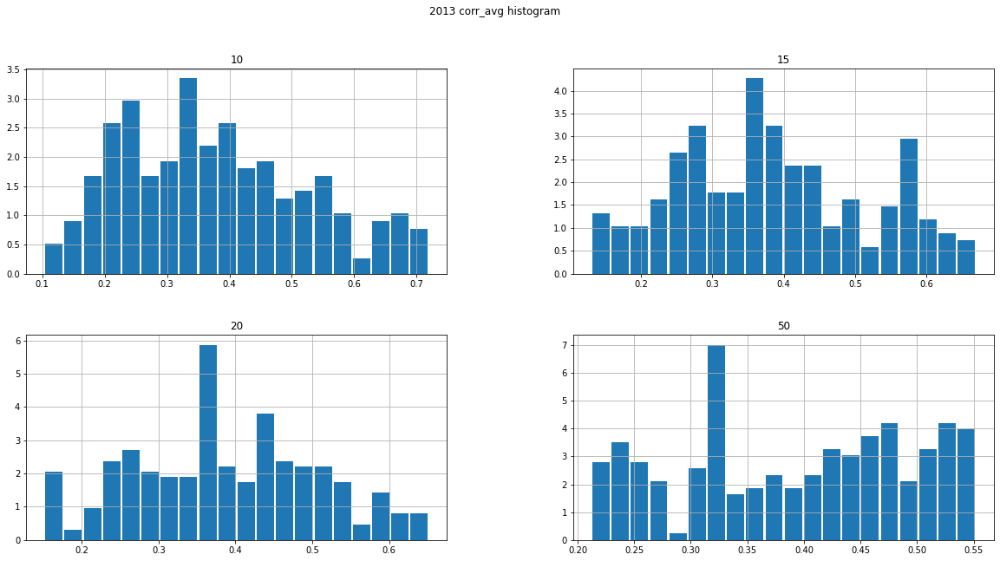

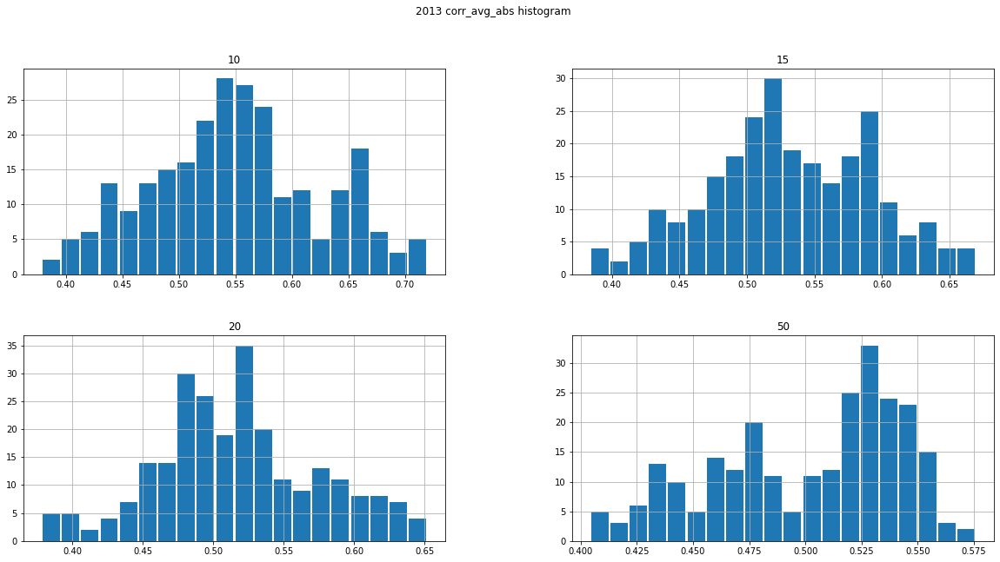

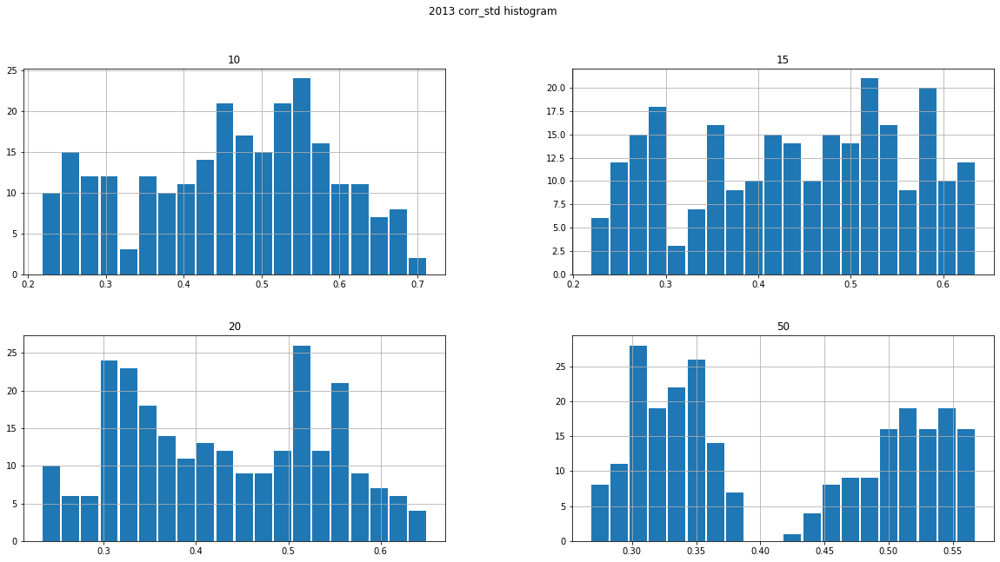

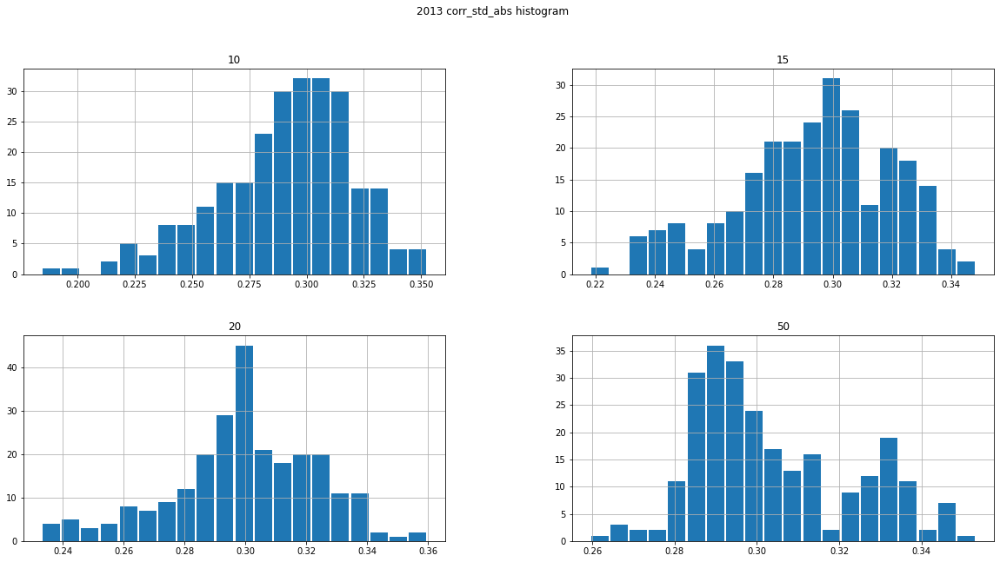

<Figure size 432x288 with 0 Axes>

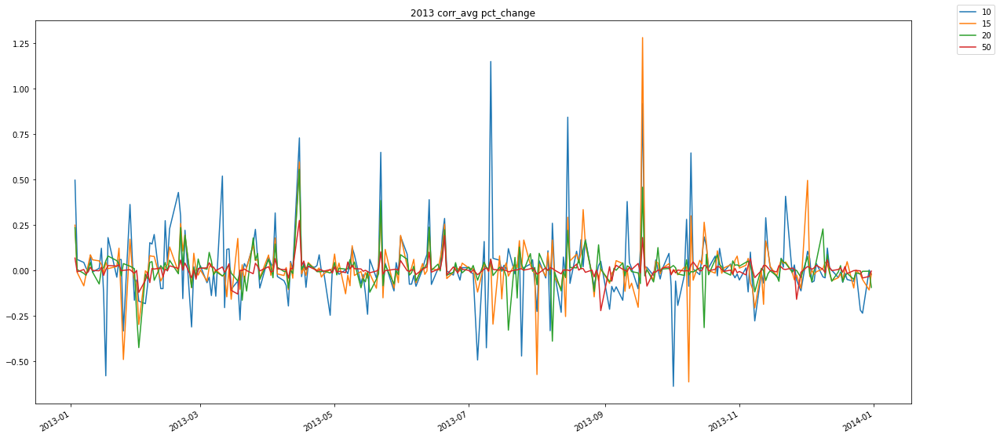

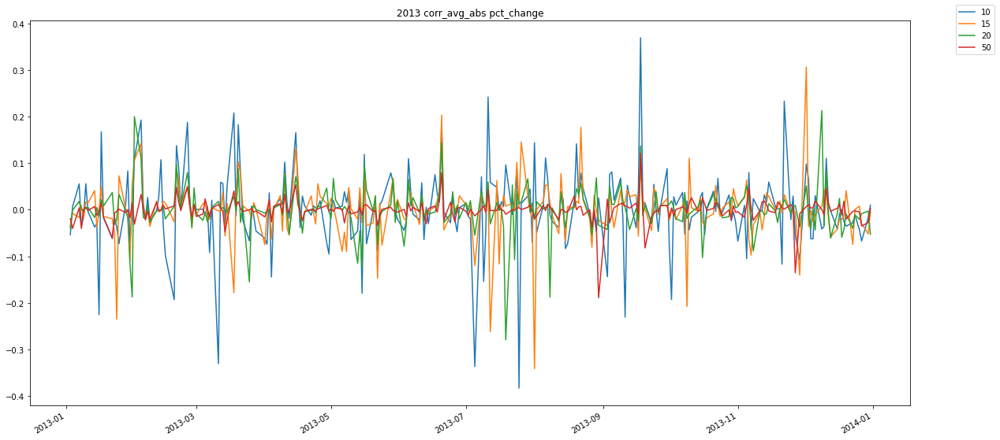

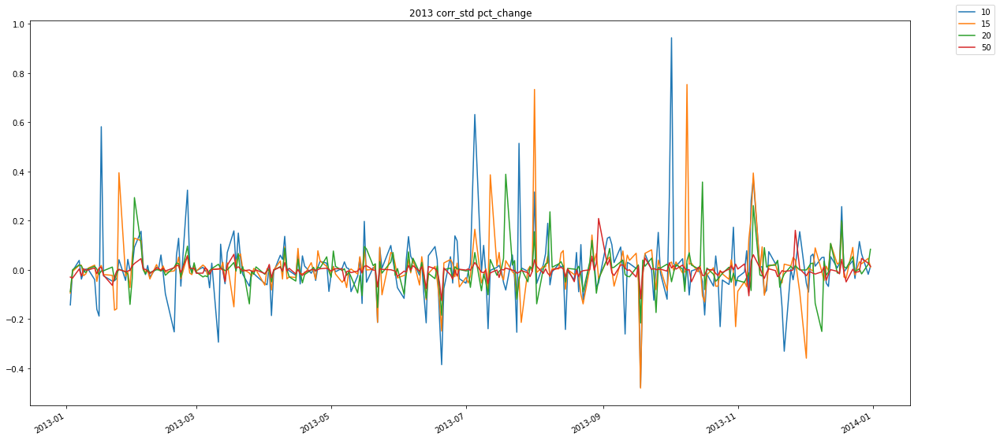

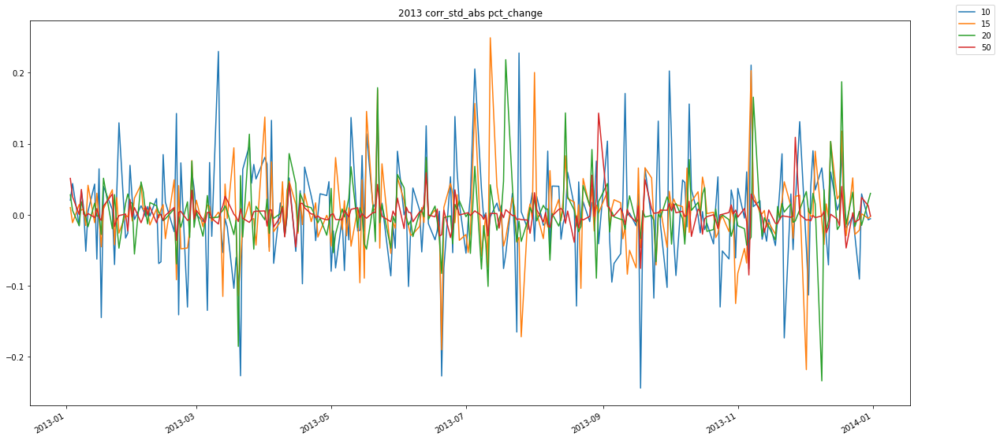

<Figure size 432x288 with 0 Axes>

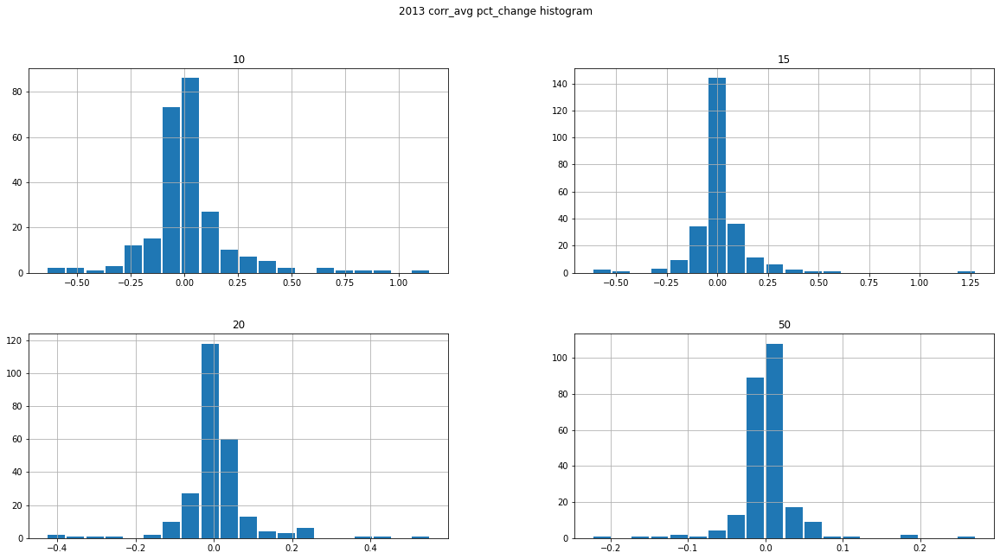

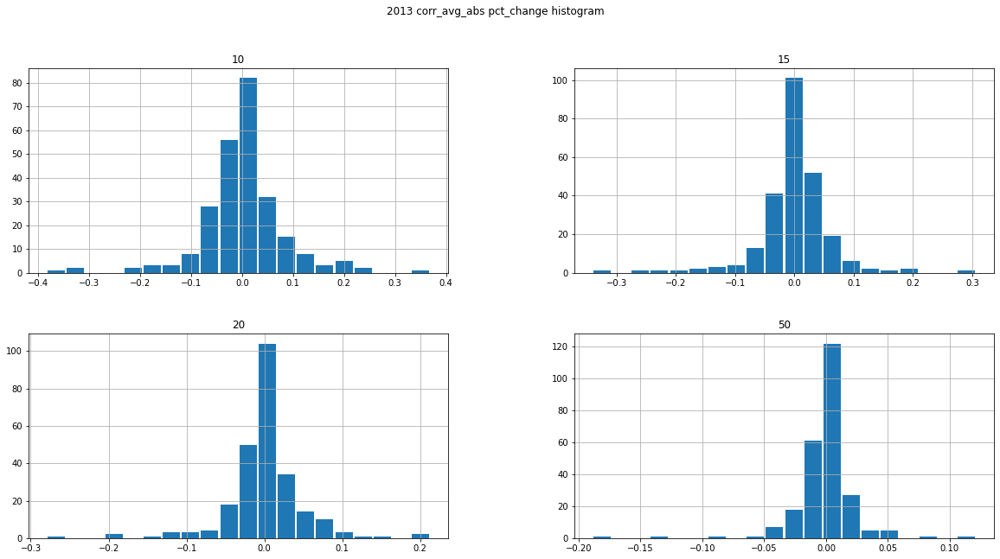

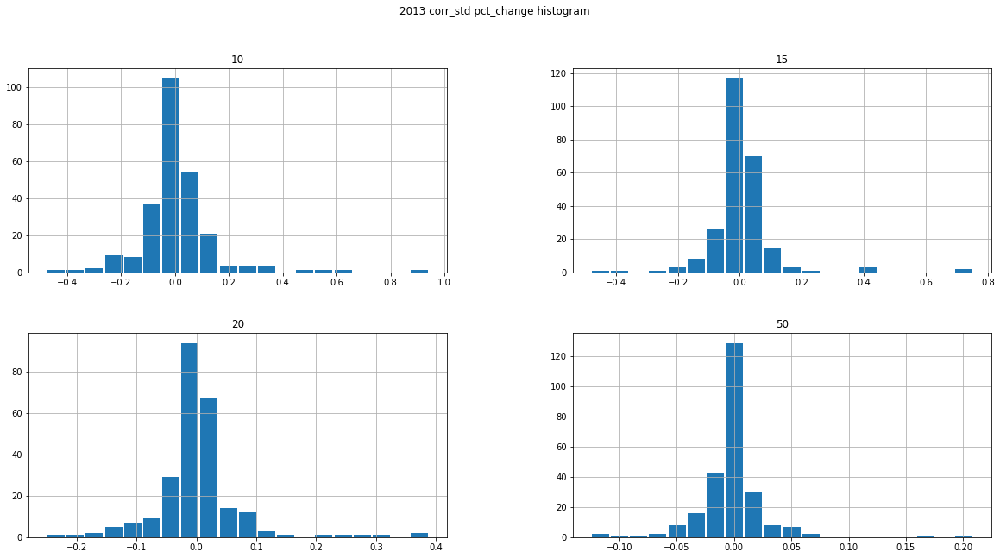

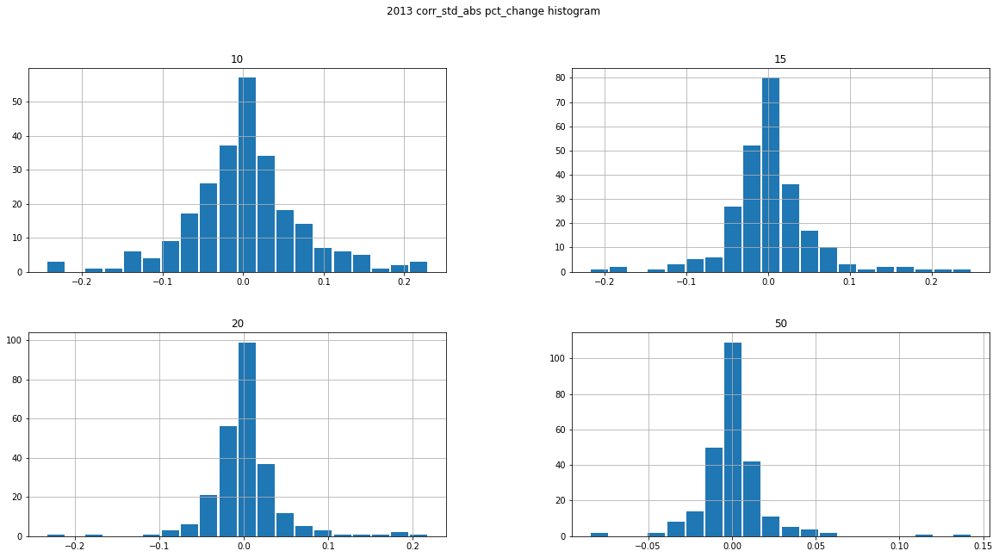

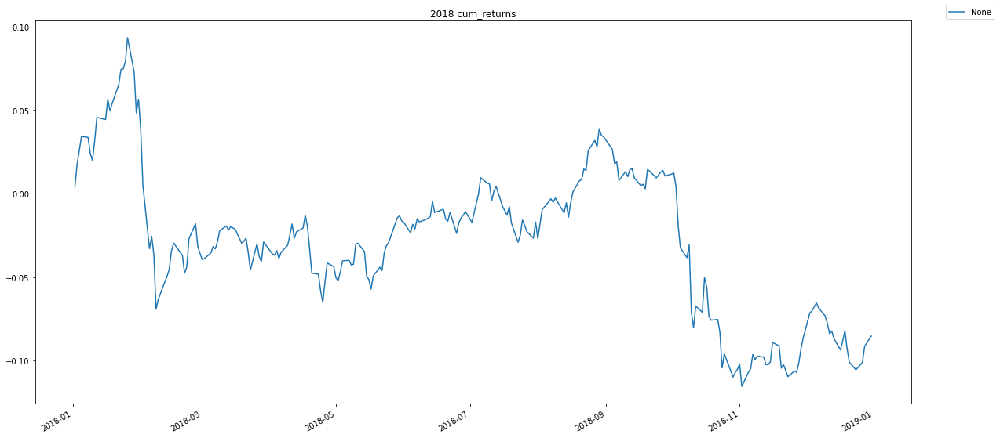

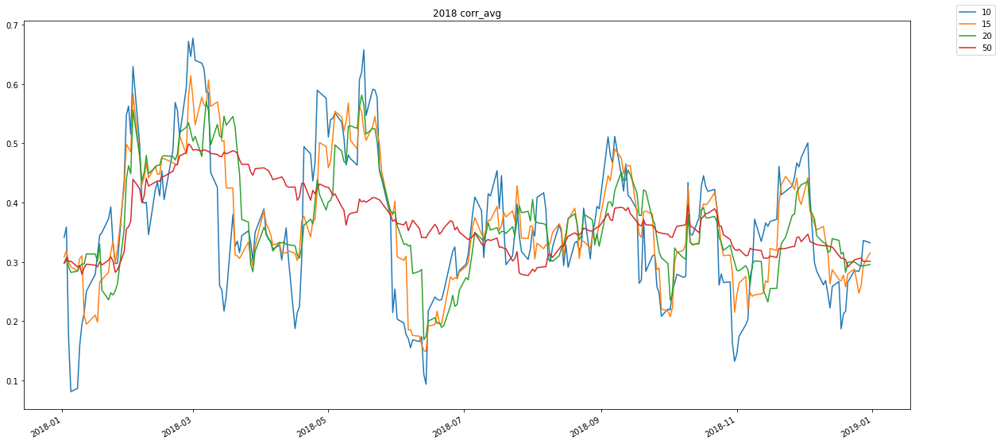

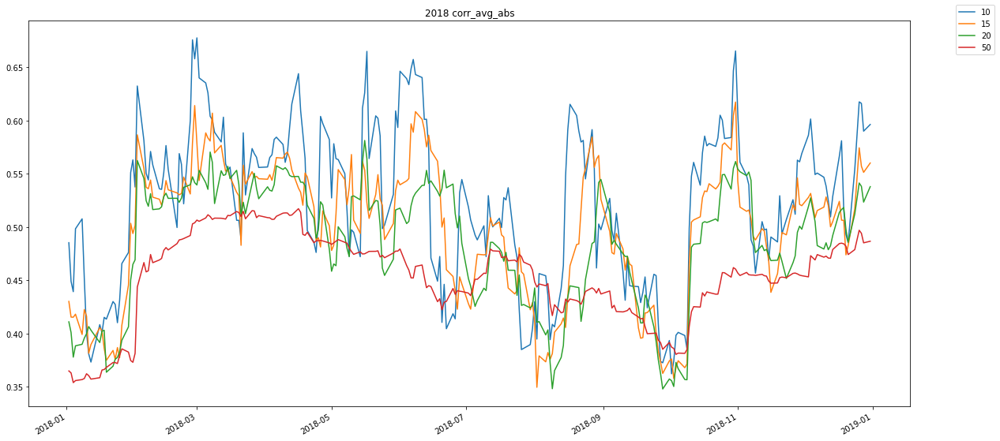

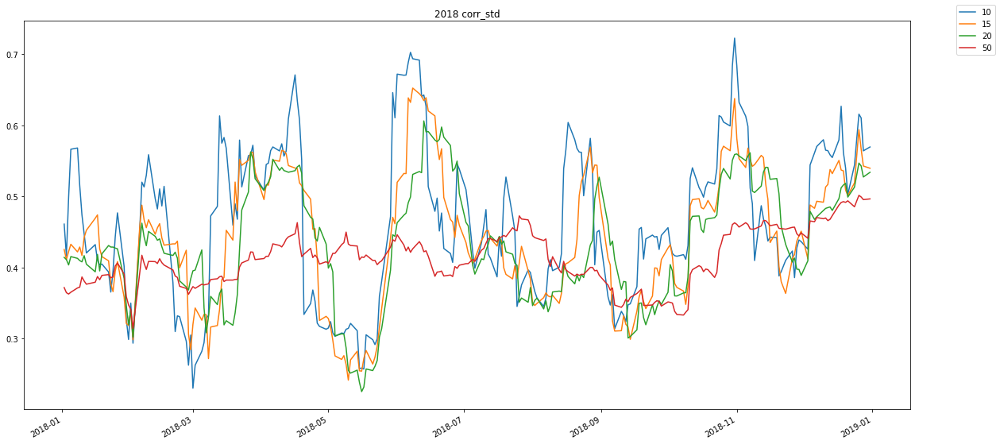

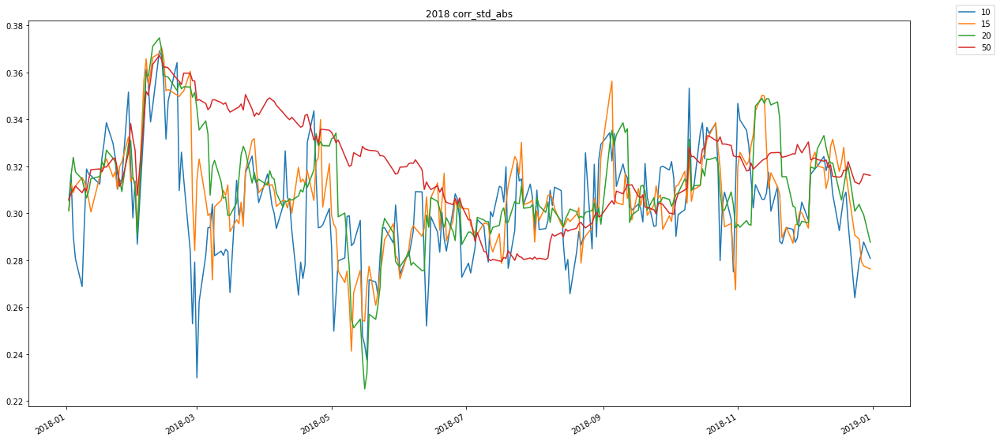

<Figure size 432x288 with 0 Axes>

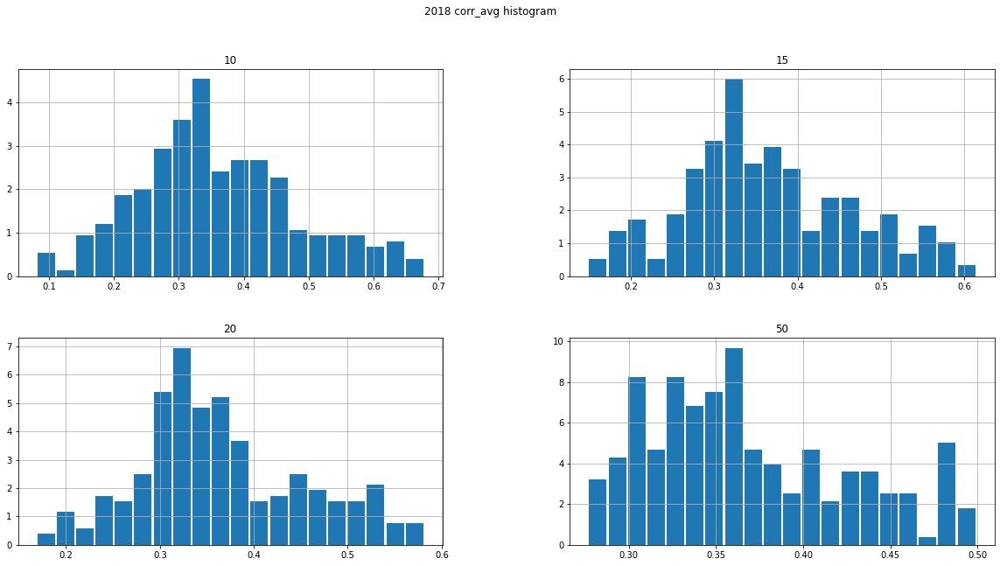

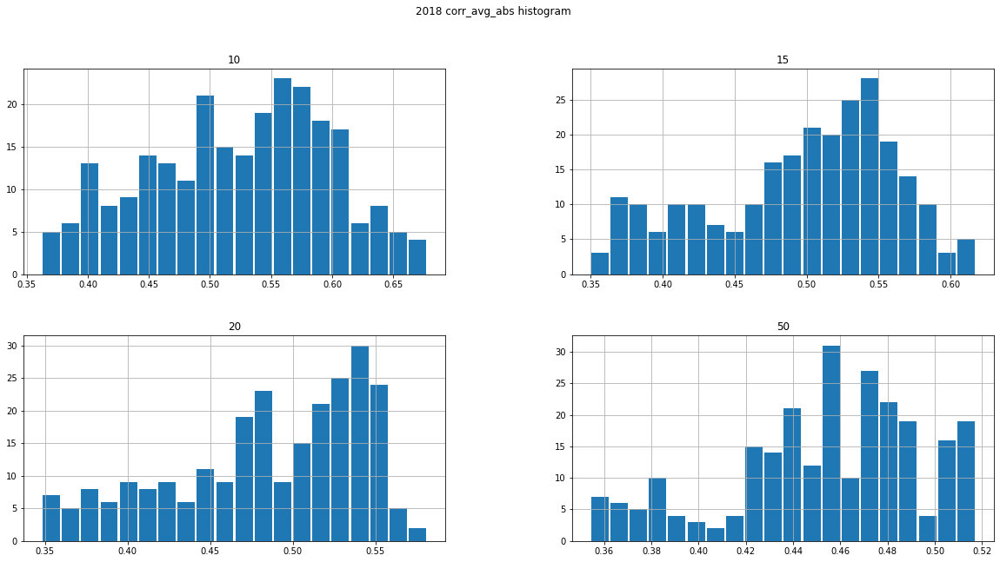

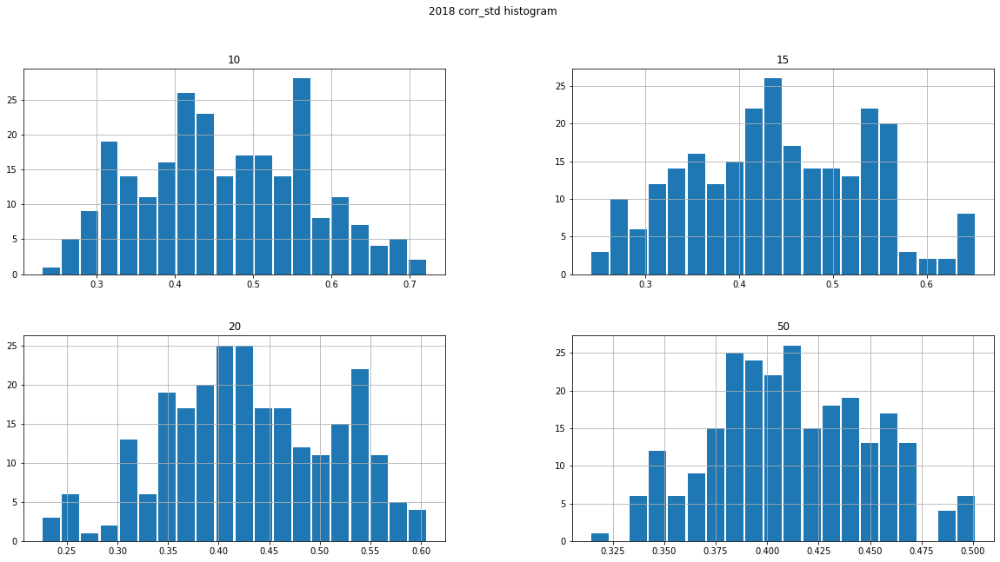

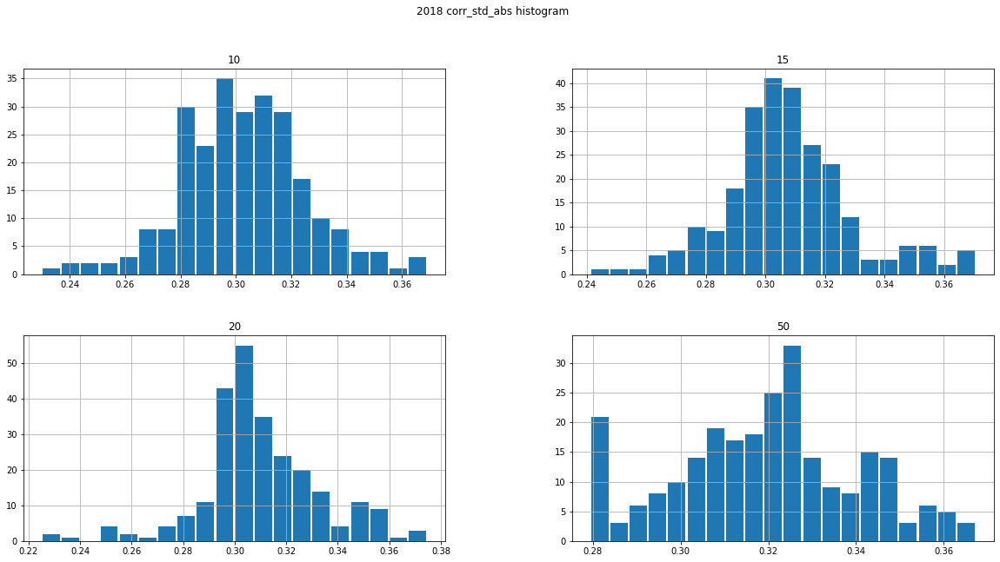

<Figure size 432x288 with 0 Axes>

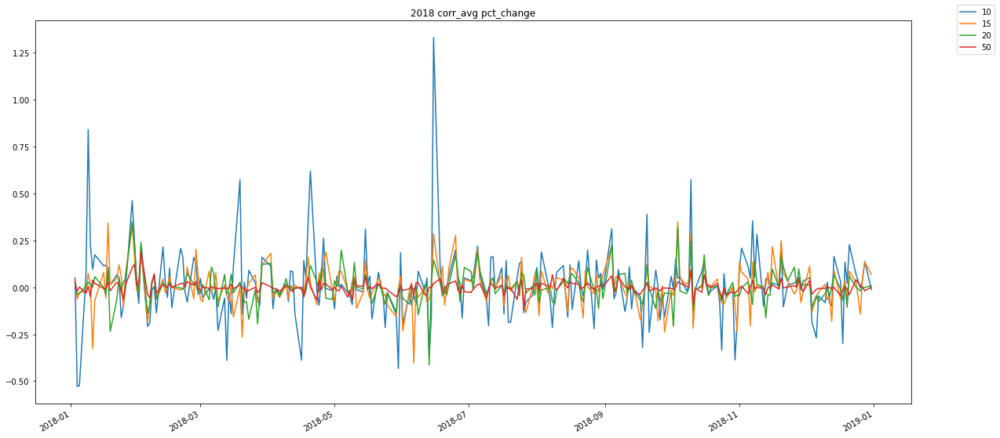

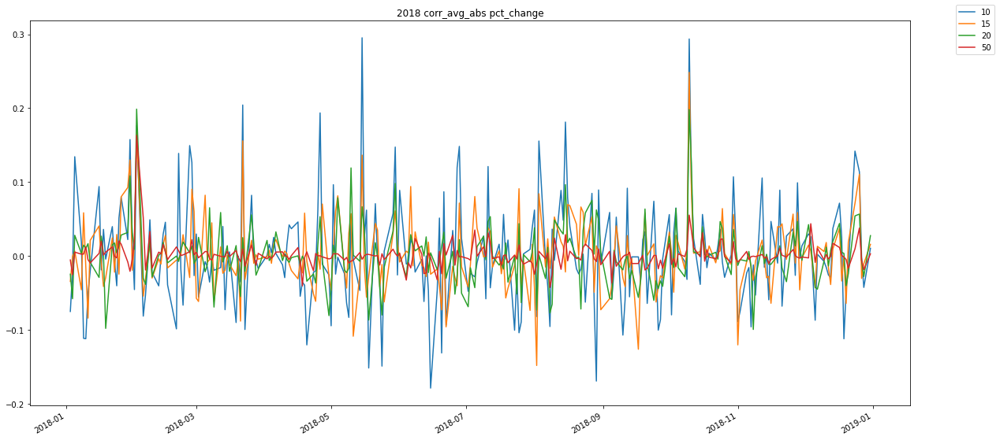

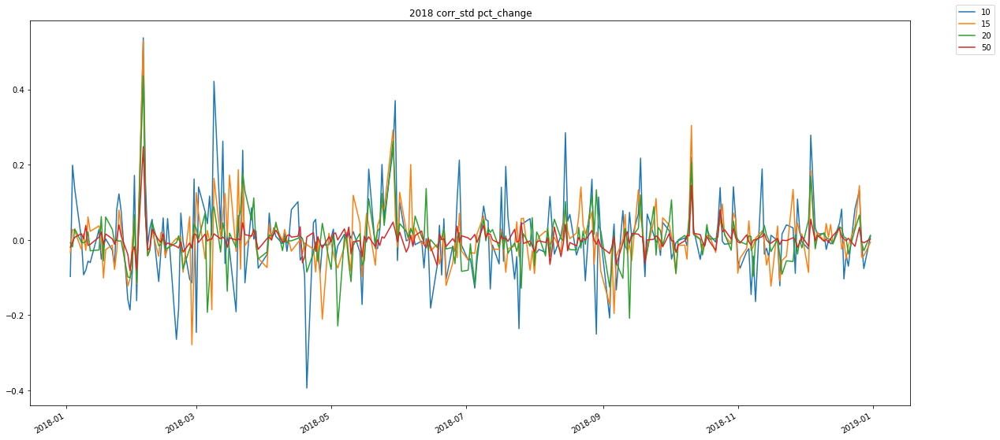

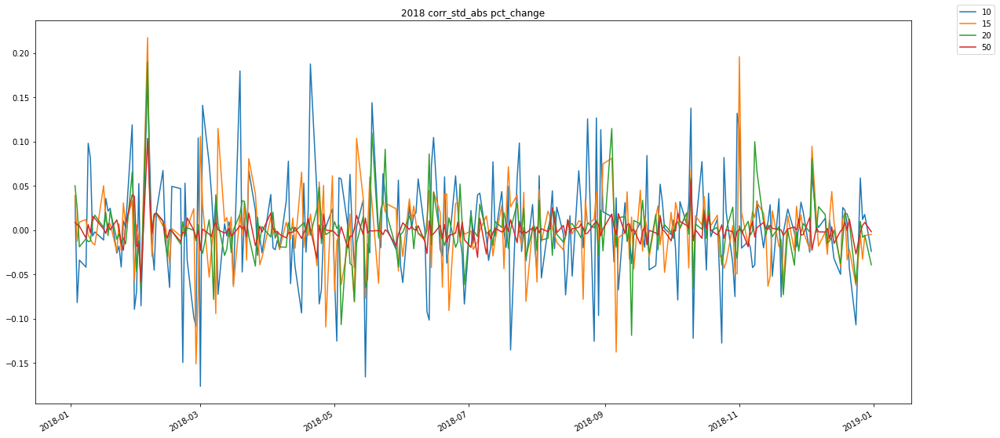

<Figure size 432x288 with 0 Axes>

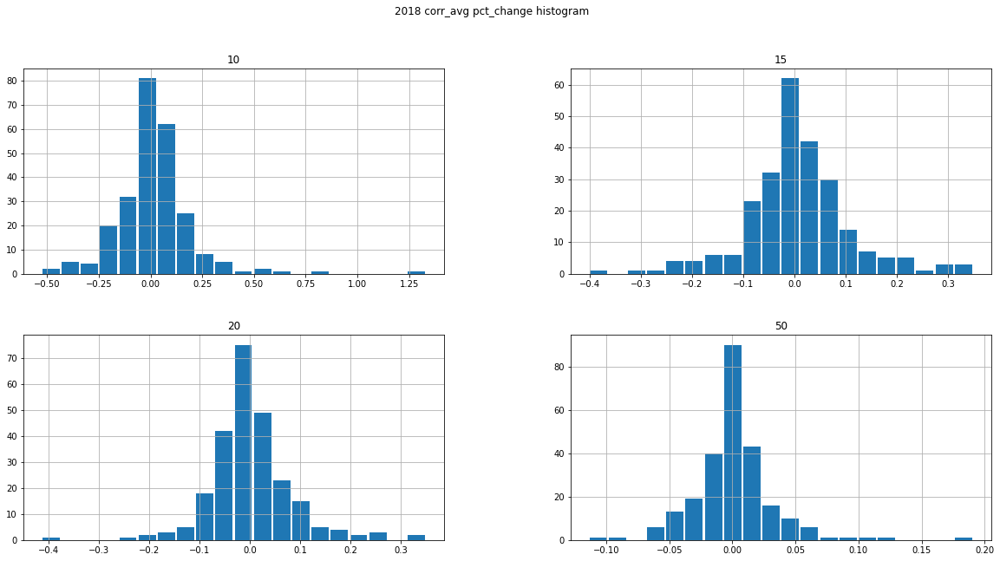

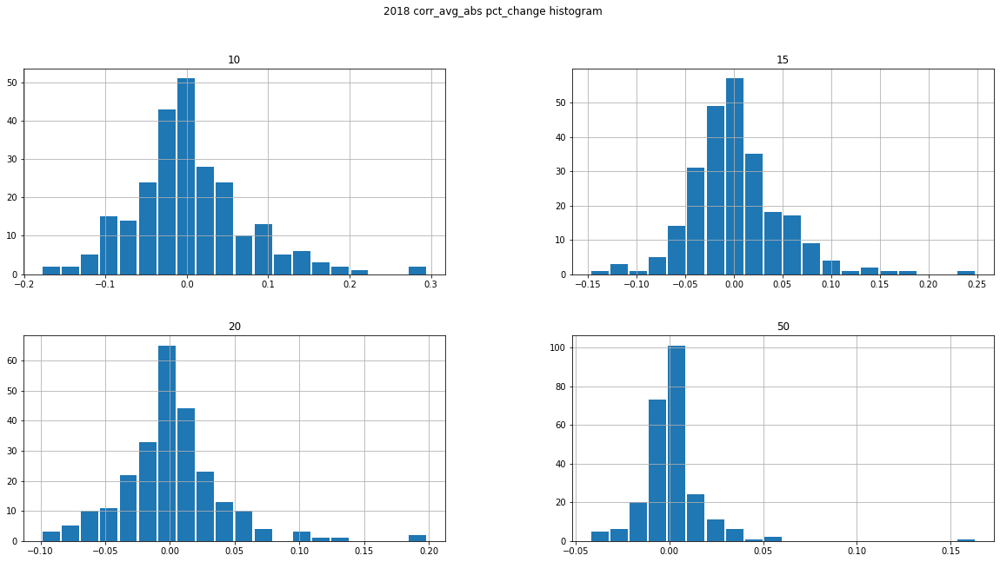

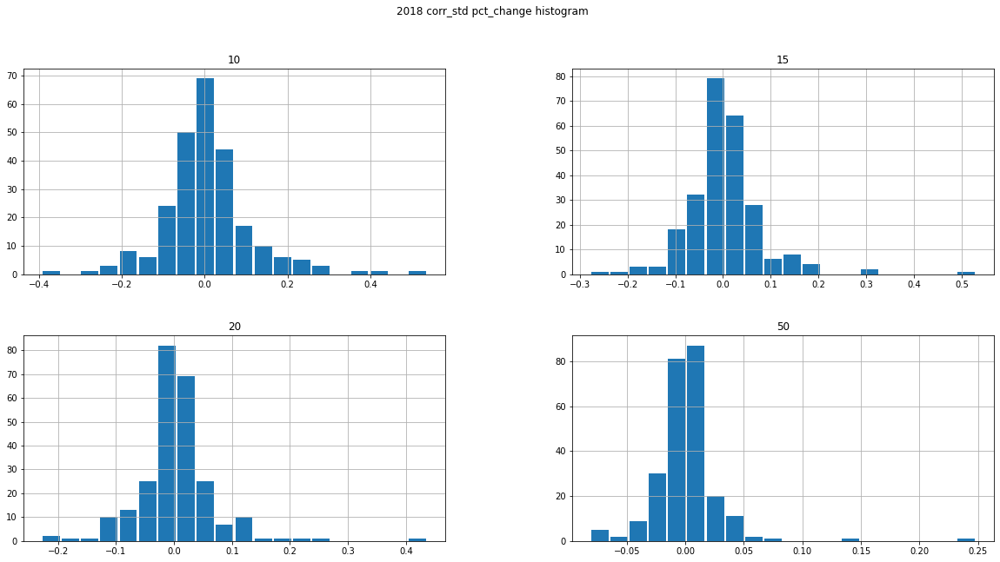

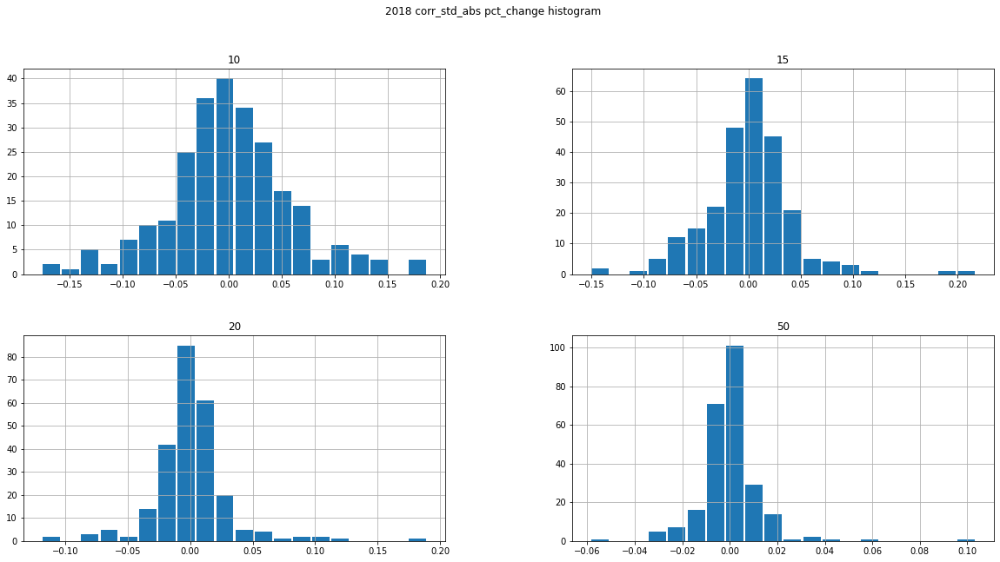

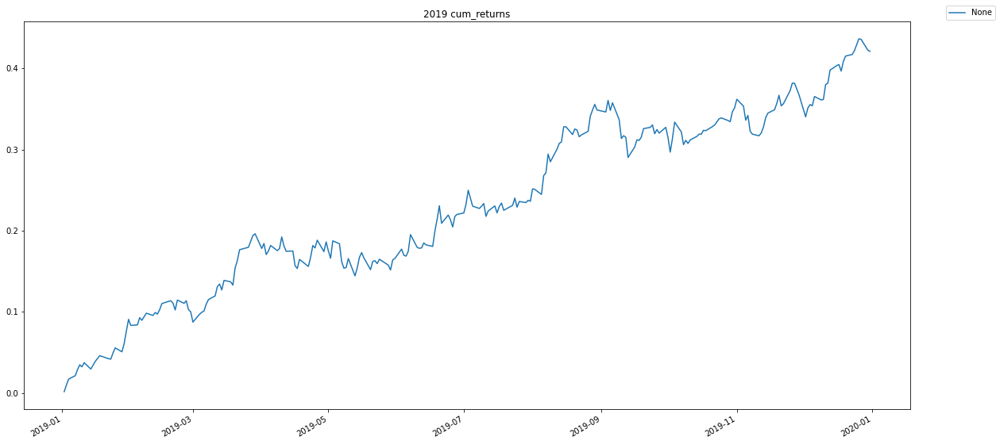

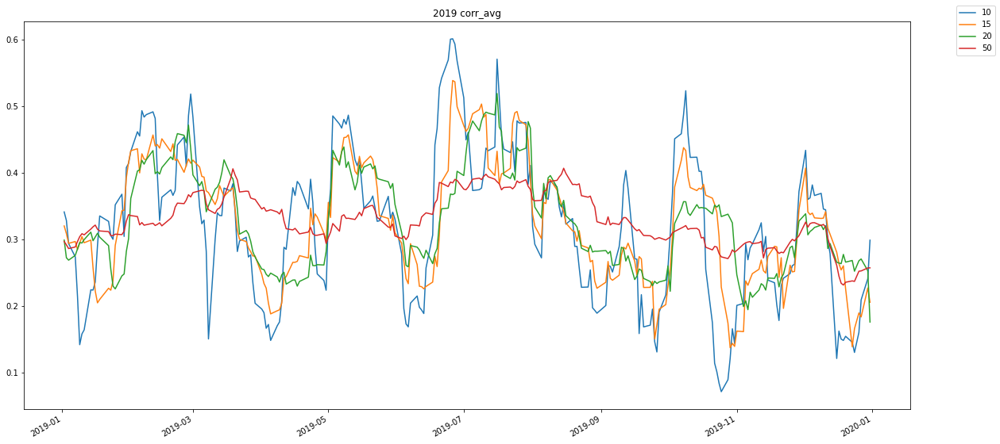

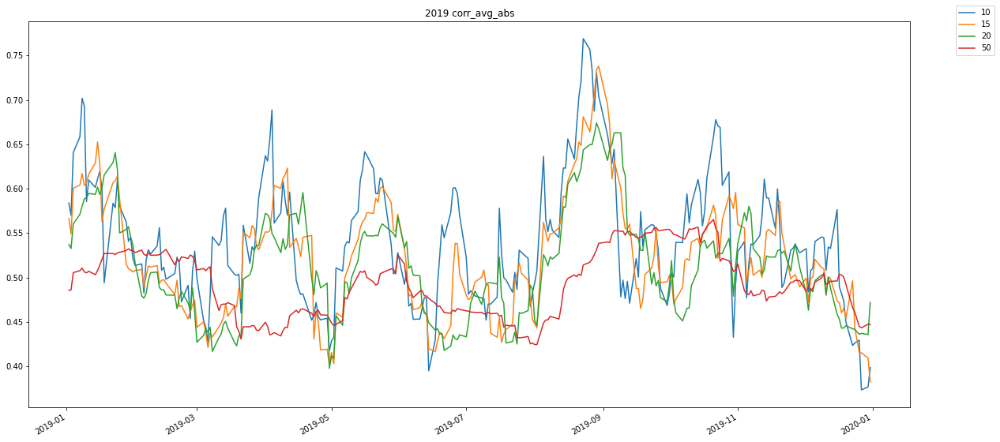

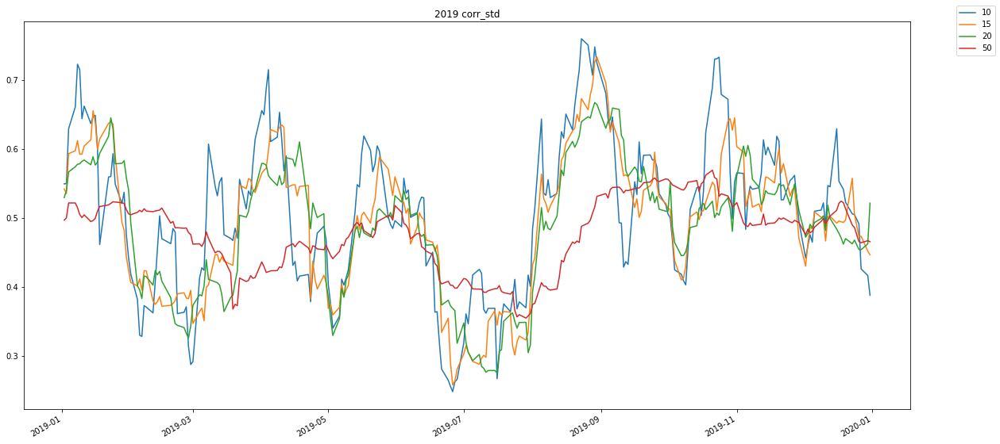

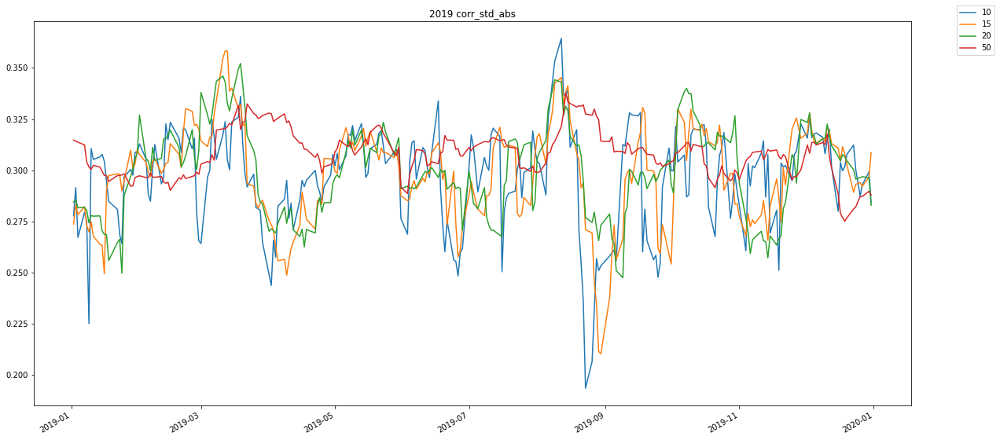

<Figure size 432x288 with 0 Axes>

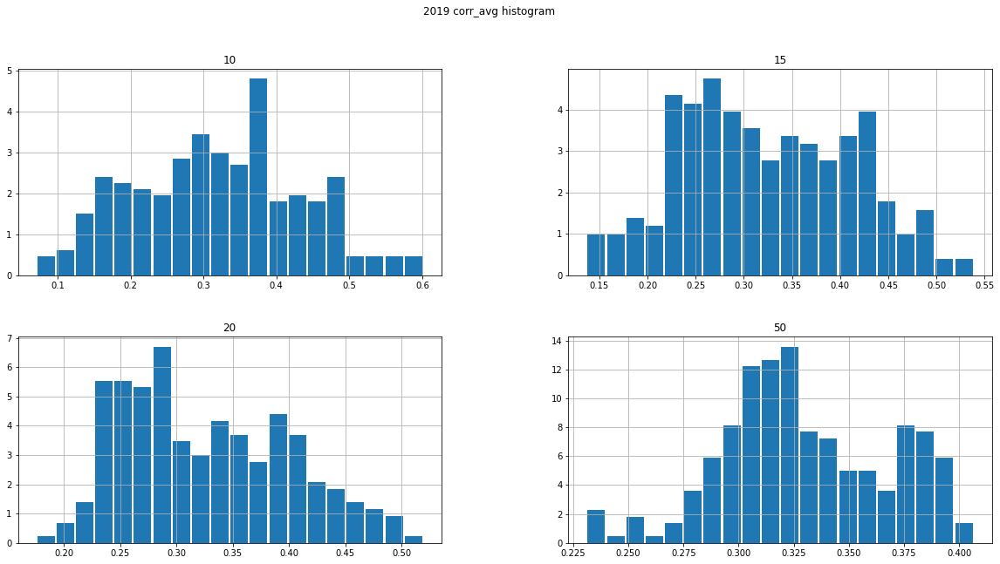

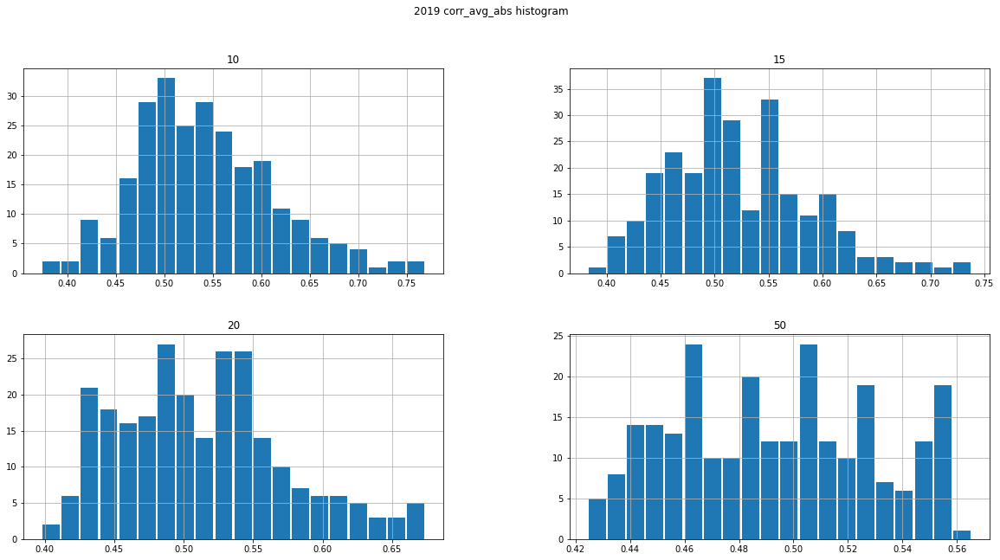

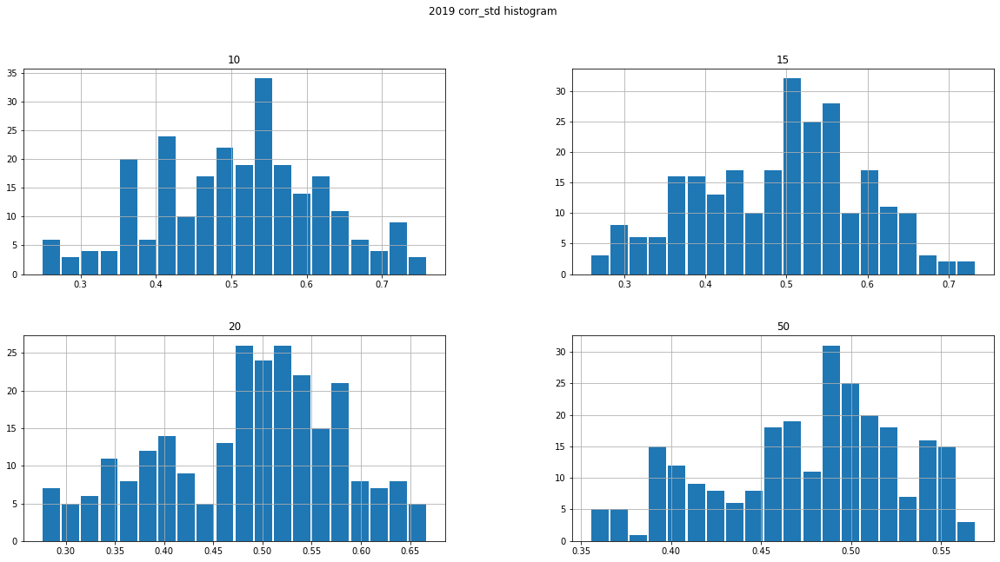

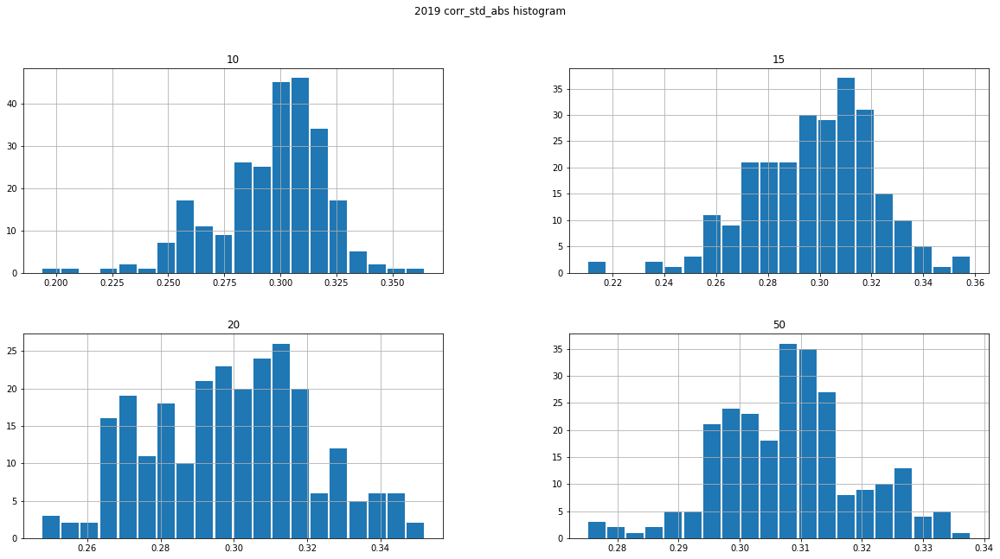

<Figure size 432x288 with 0 Axes>

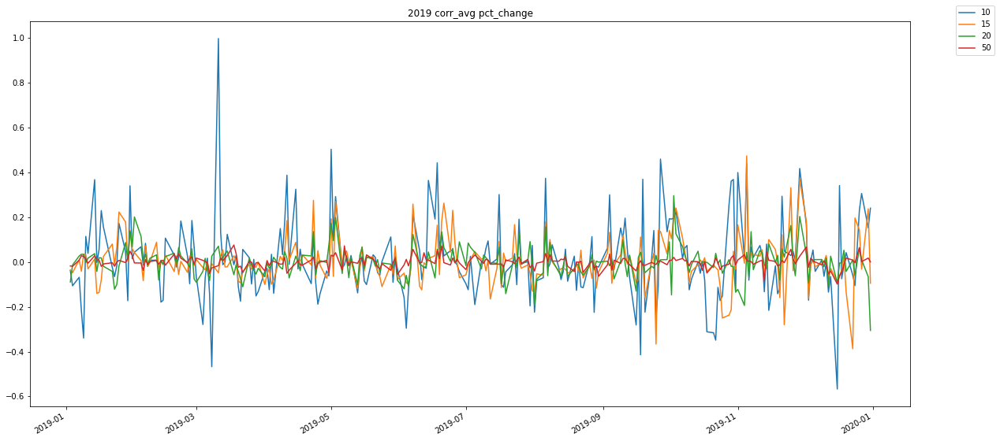

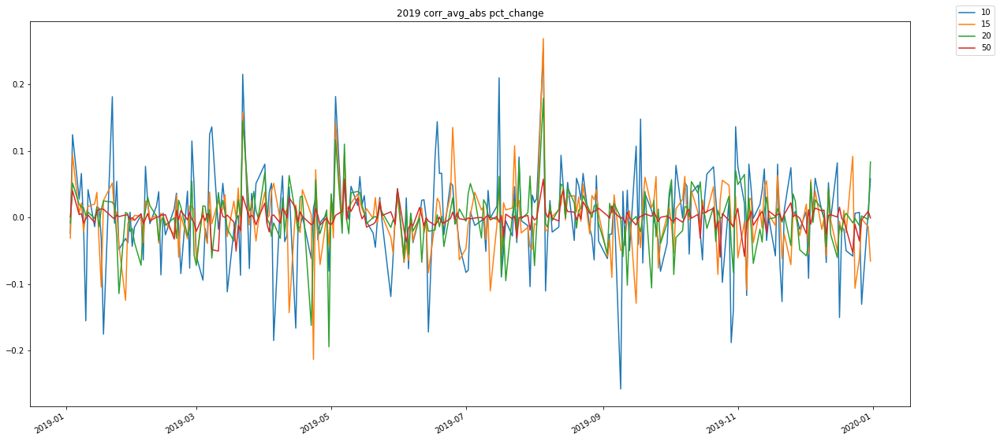

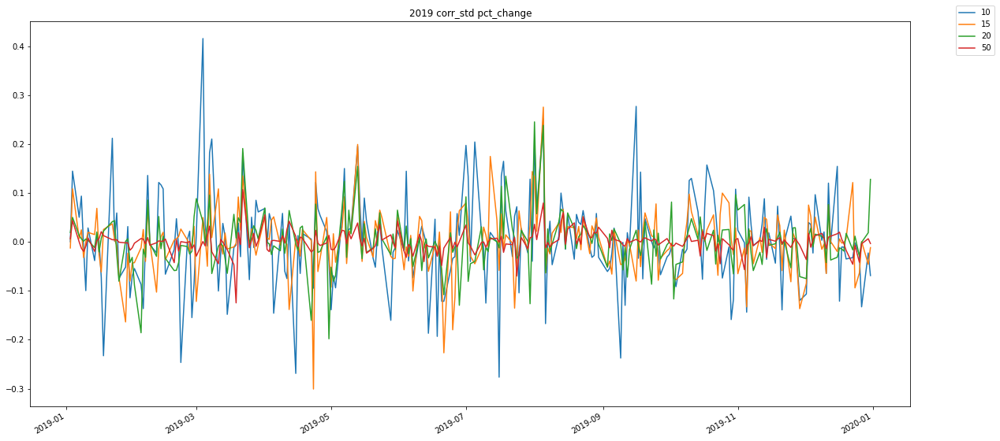

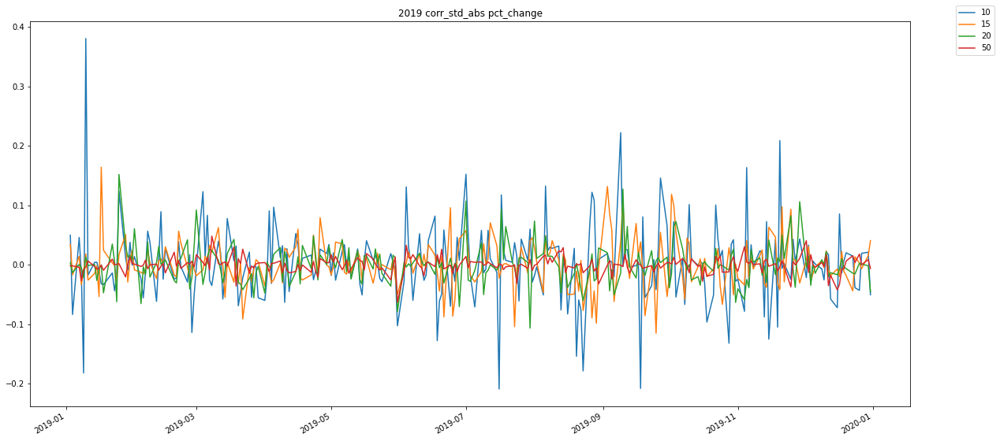

<Figure size 432x288 with 0 Axes>

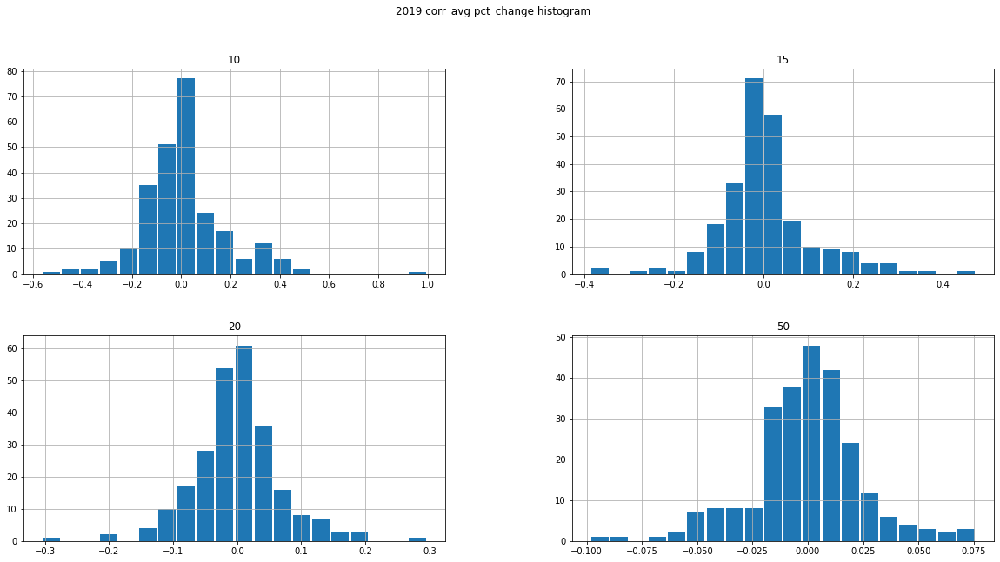

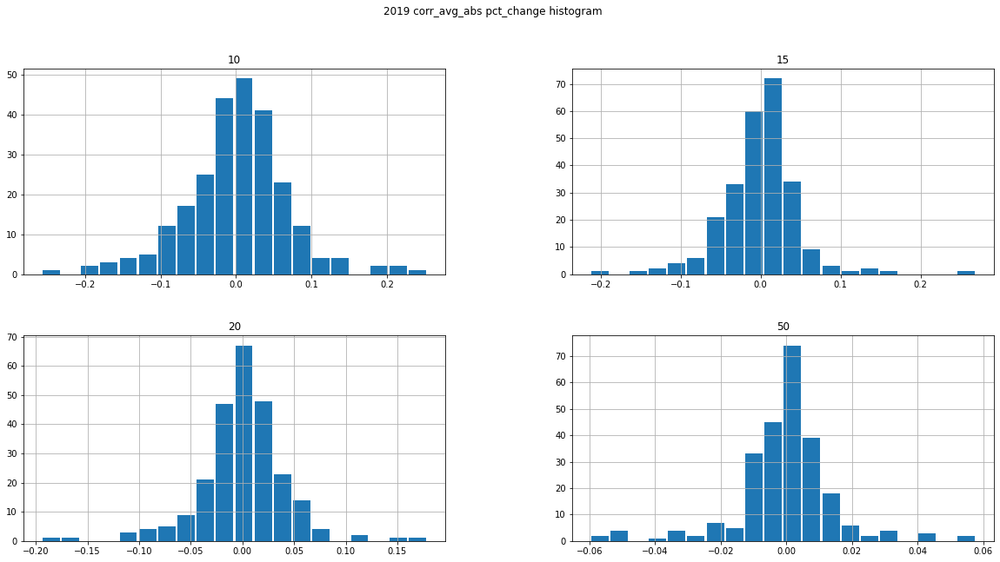

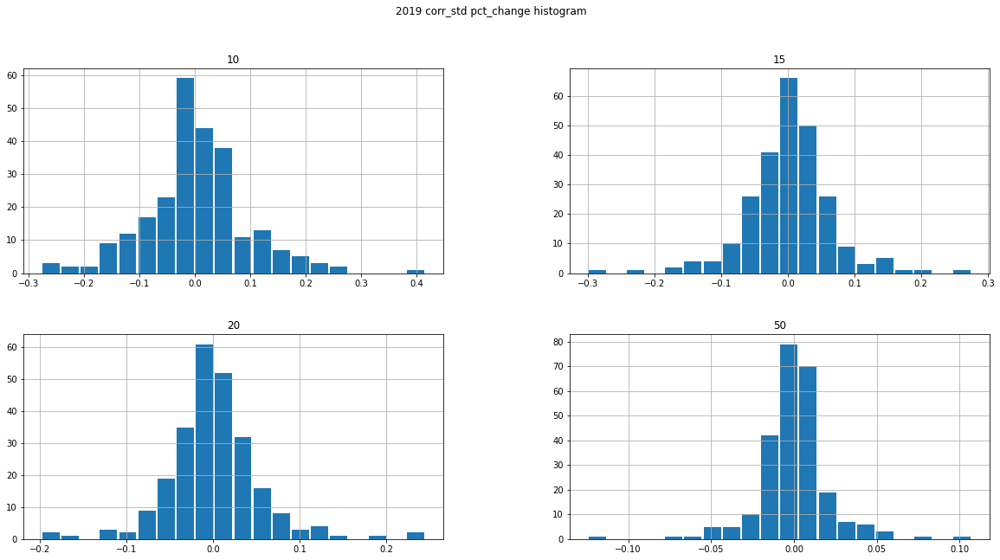

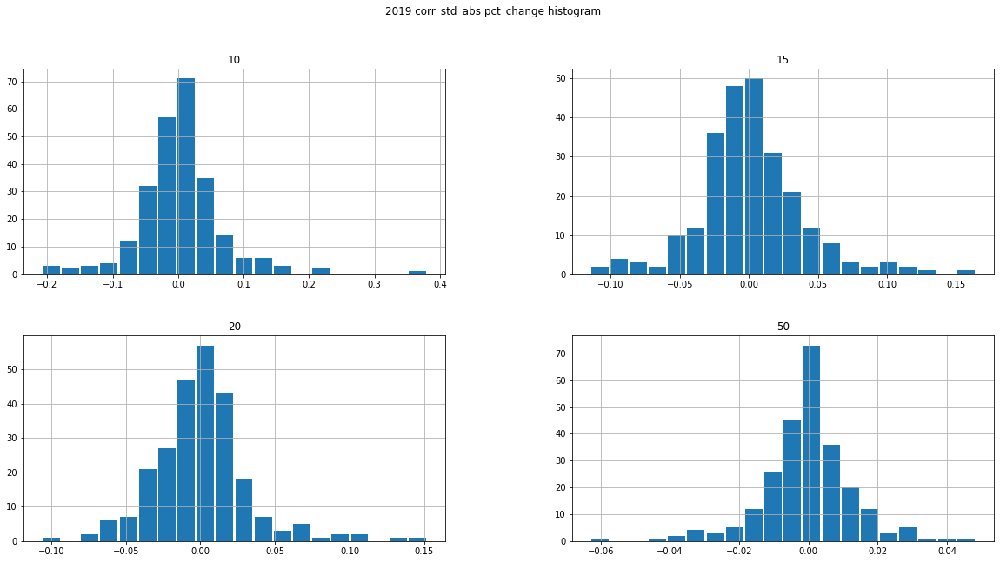

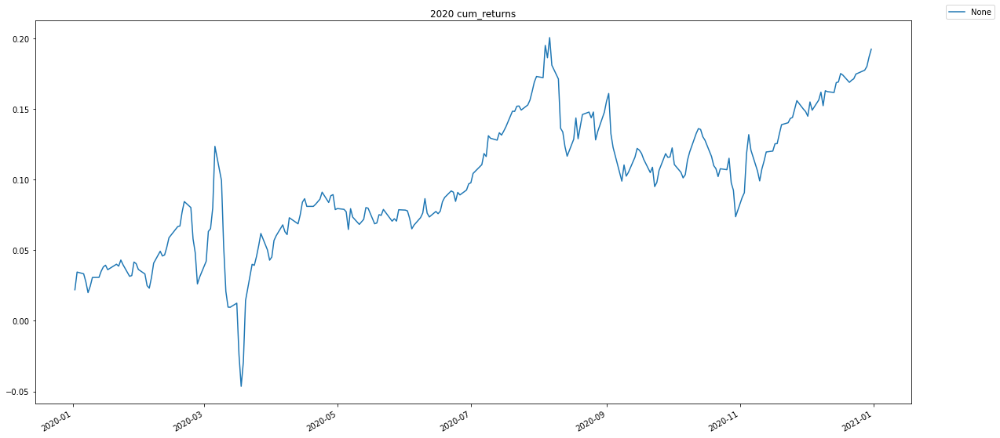

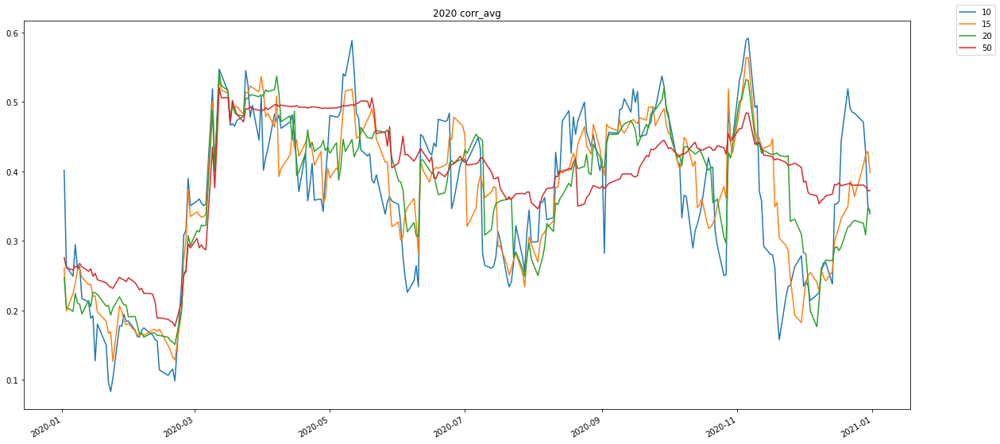

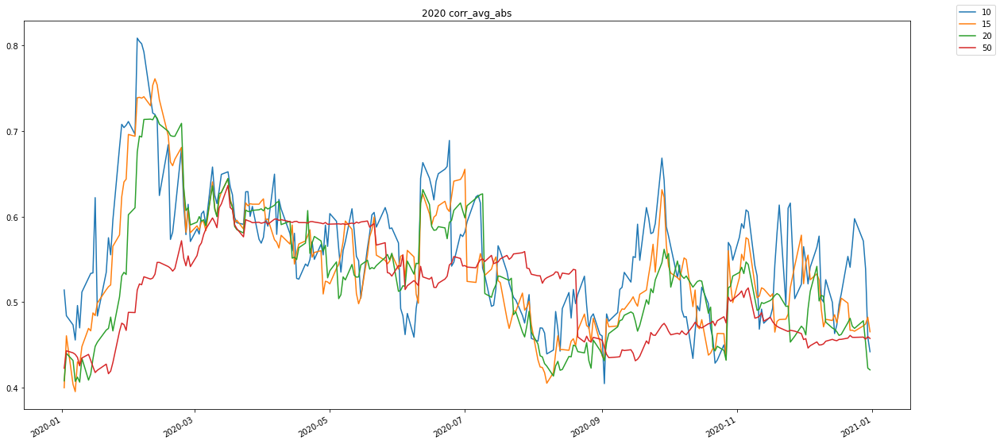

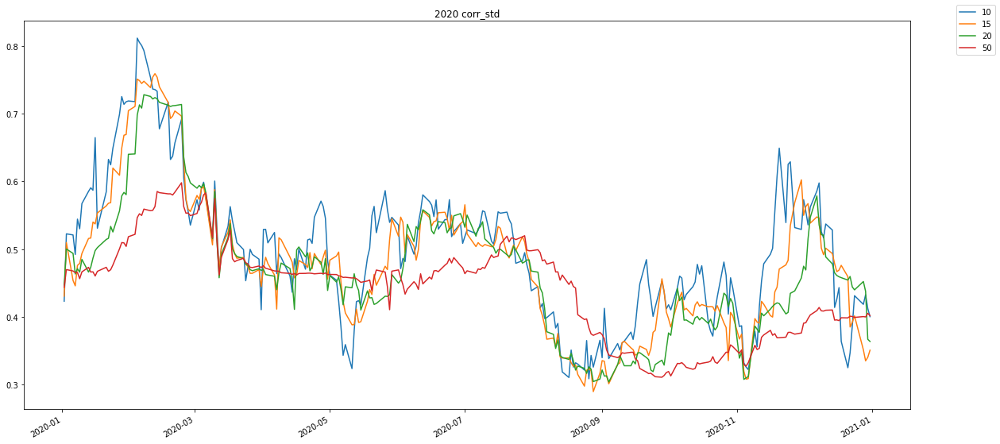

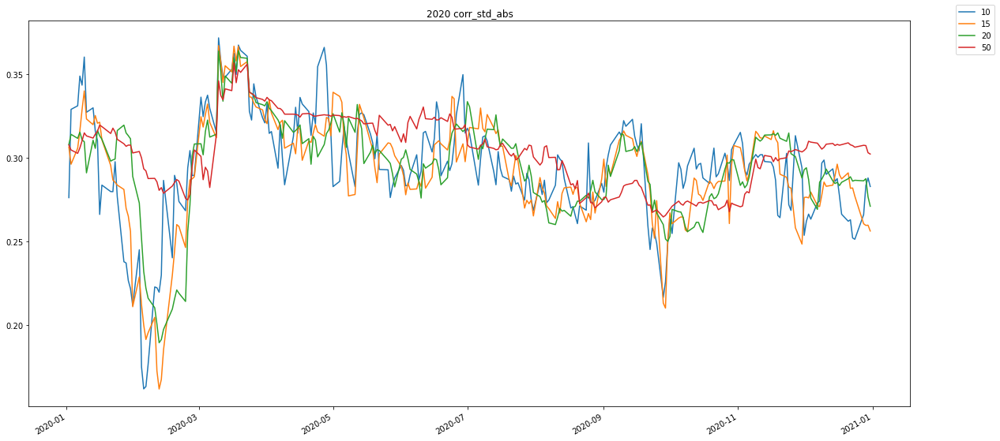

<Figure size 432x288 with 0 Axes>

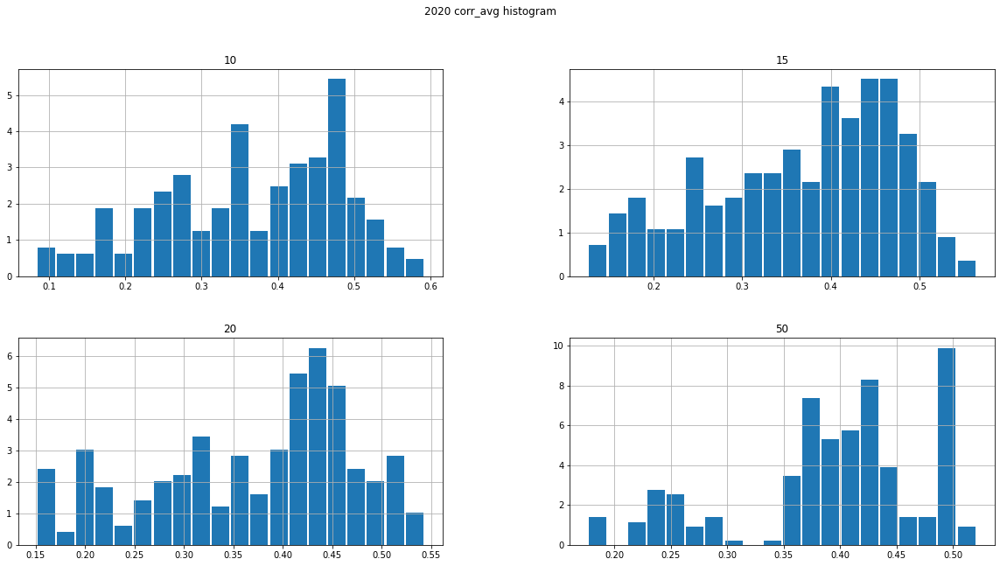

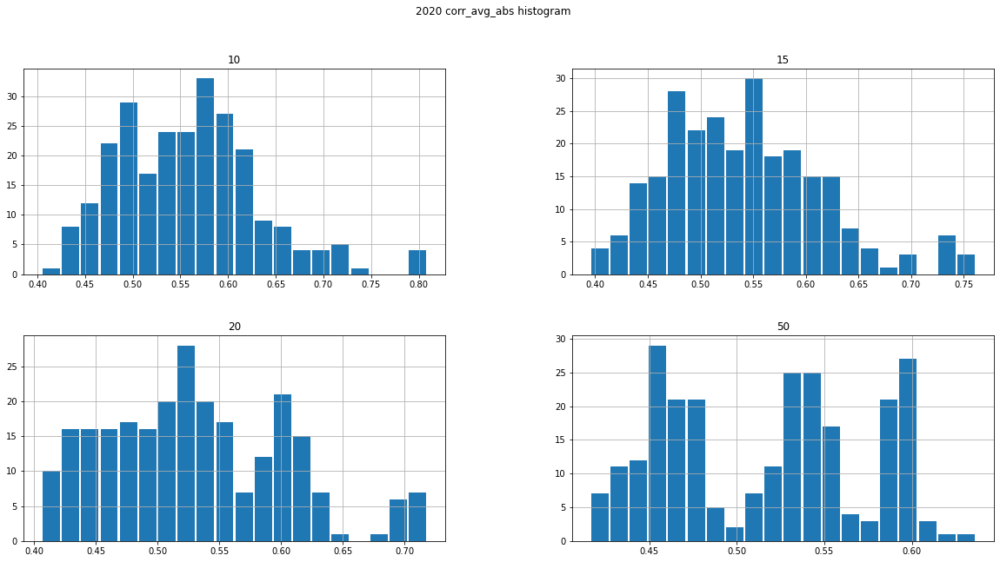

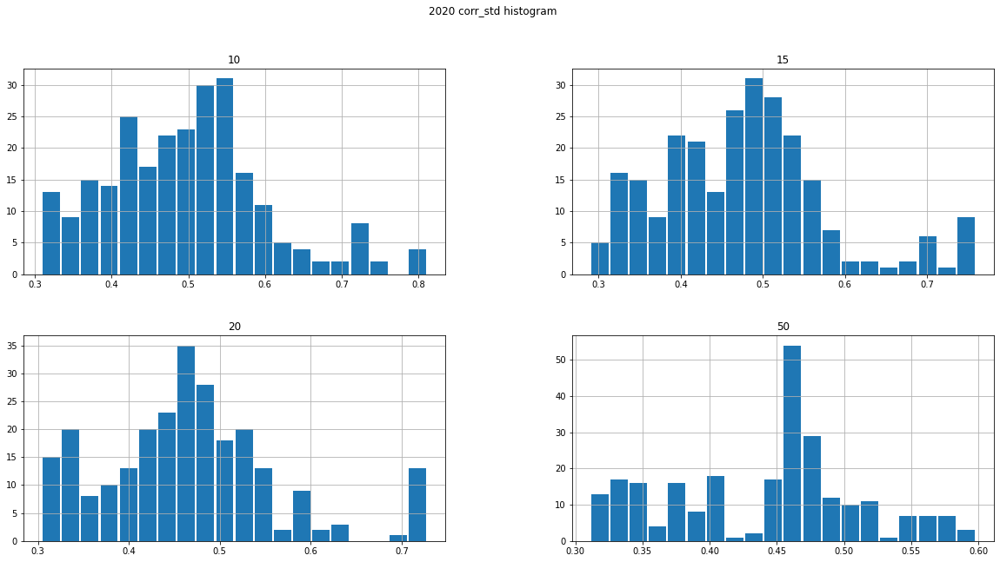

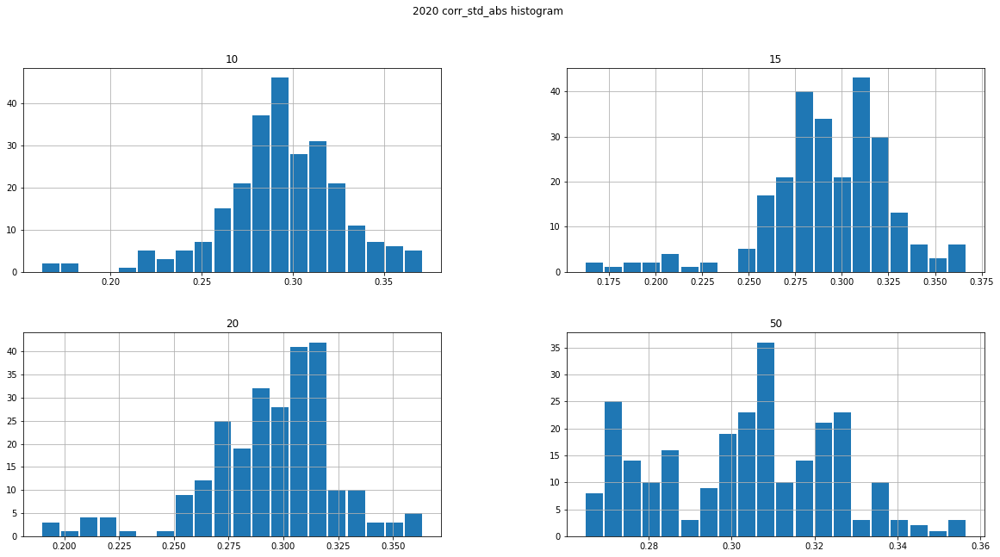

<Figure size 432x288 with 0 Axes>

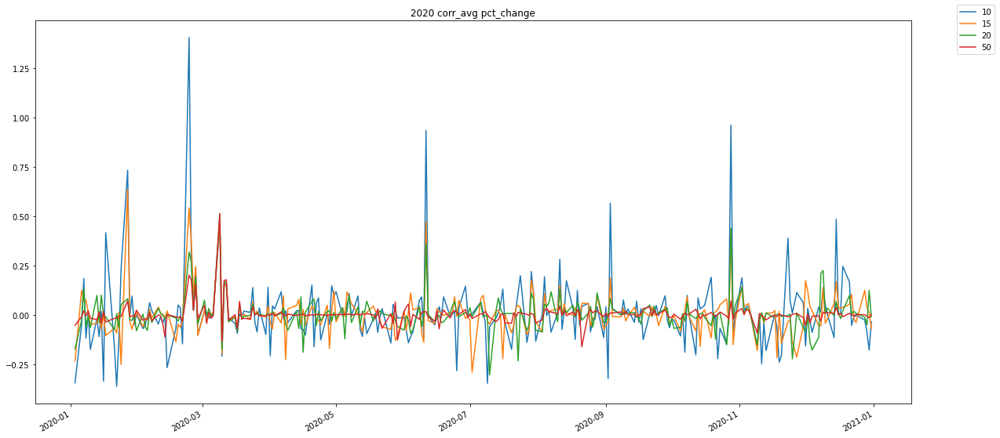

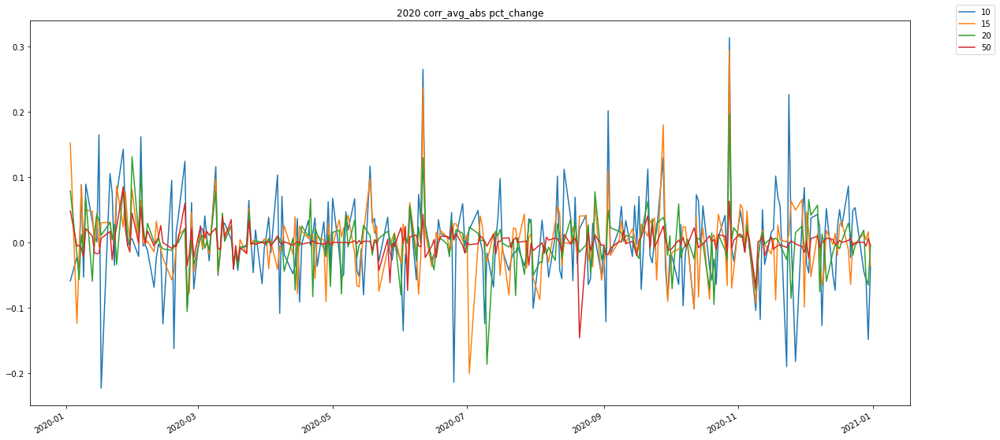

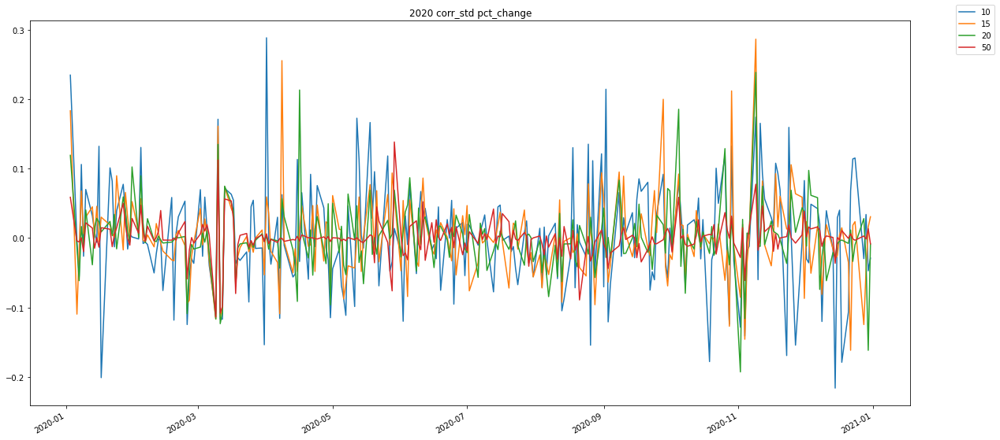

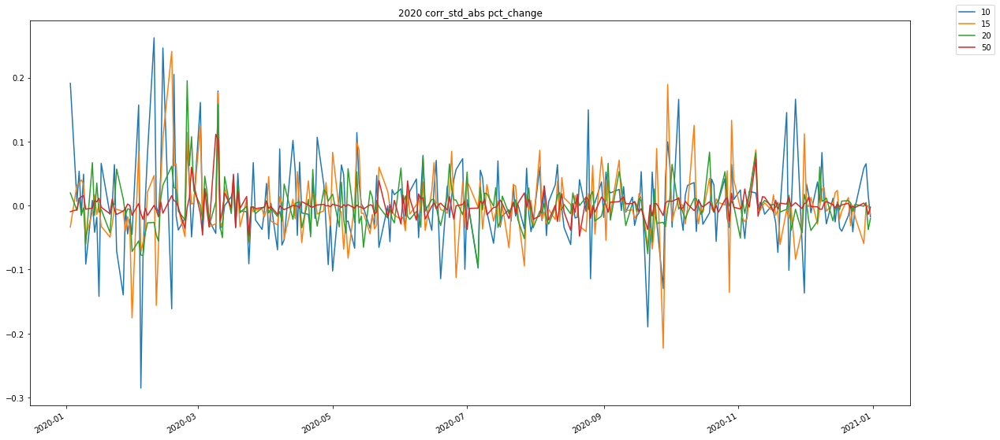

<Figure size 432x288 with 0 Axes>

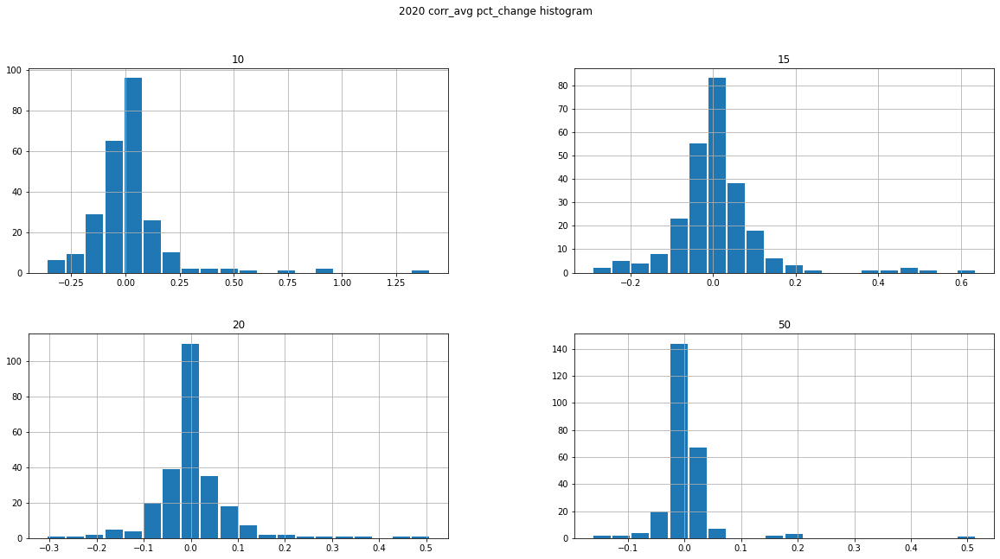

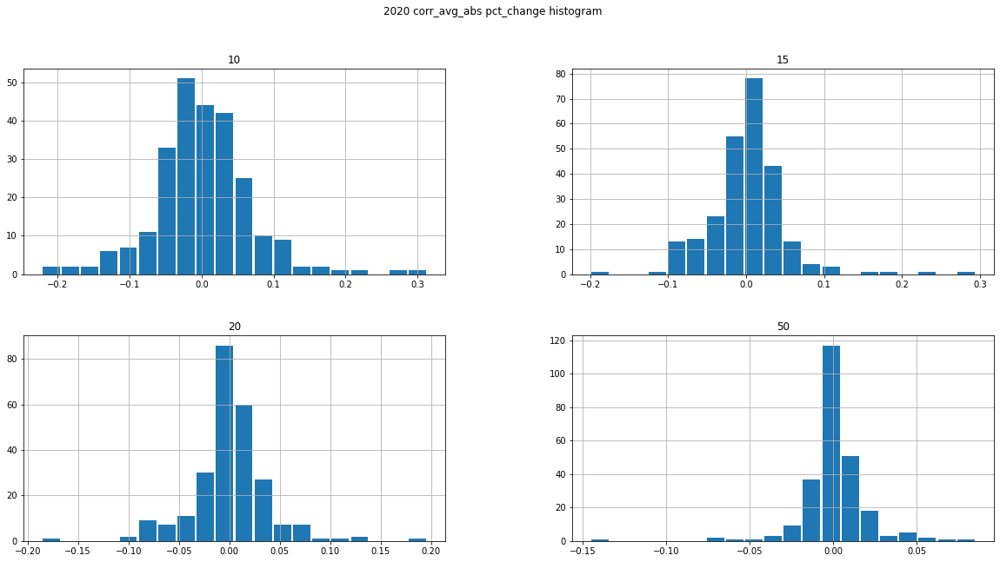

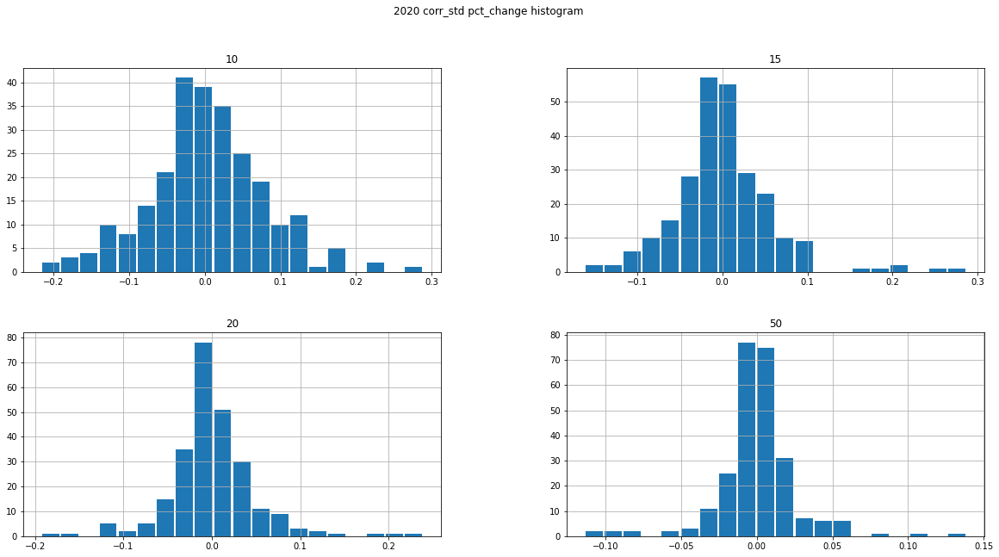

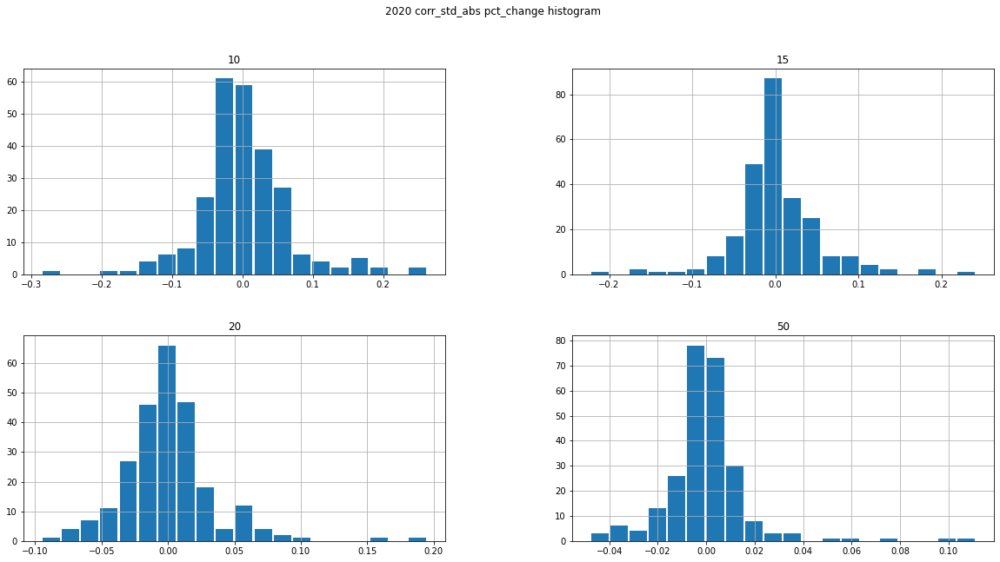

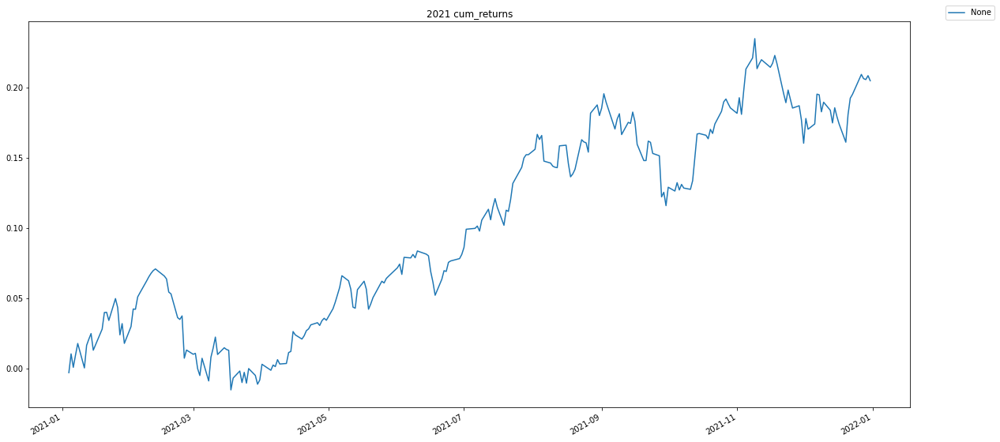

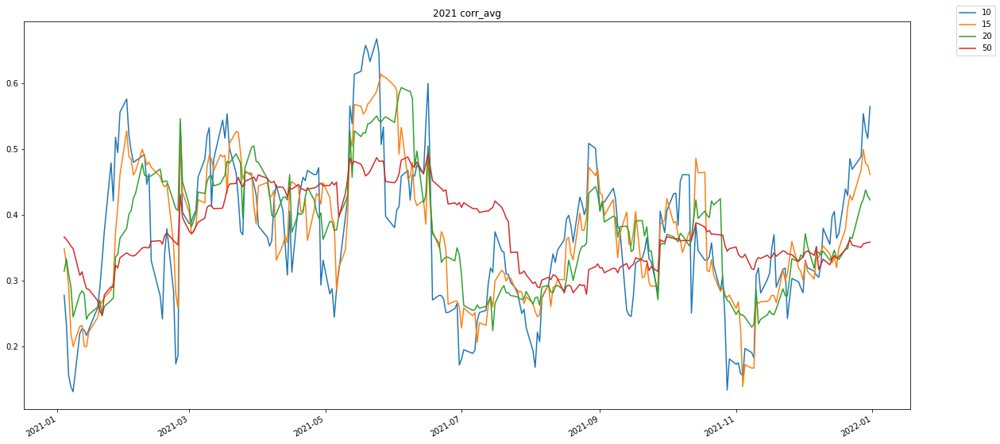

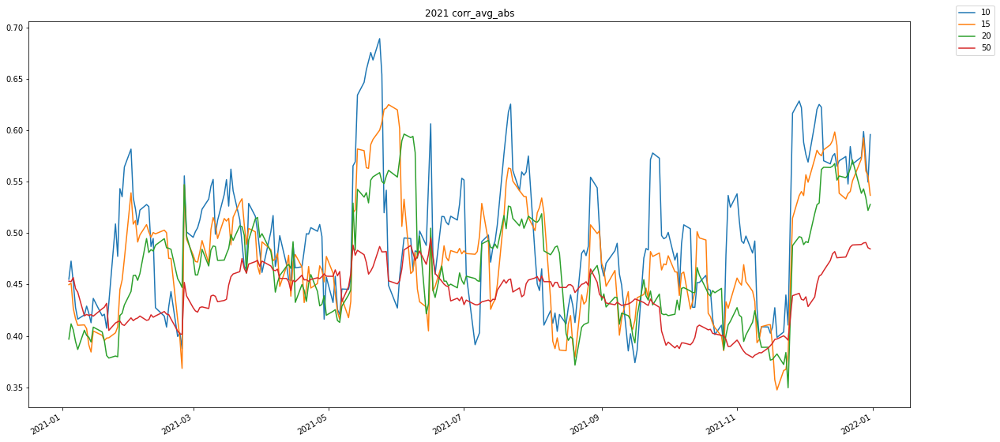

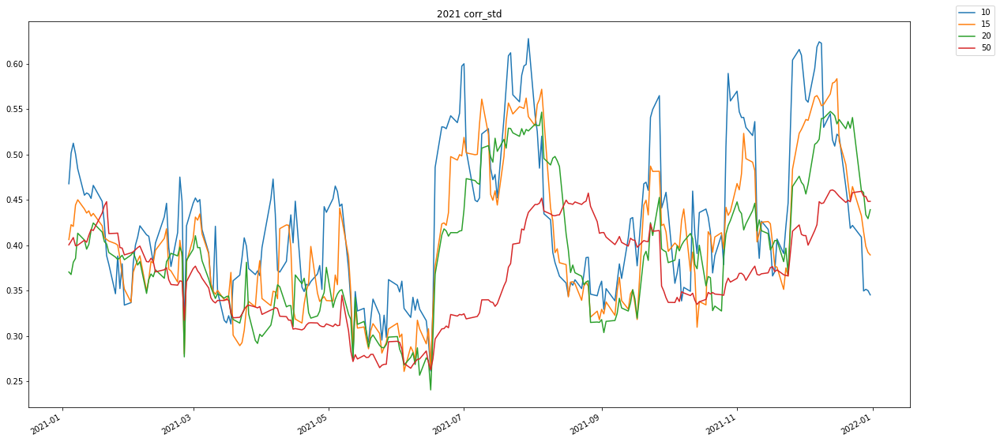

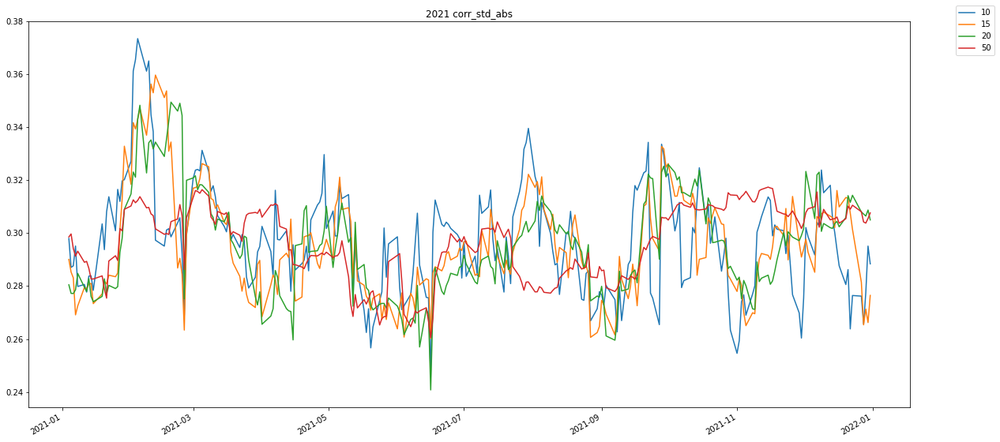

<Figure size 432x288 with 0 Axes>

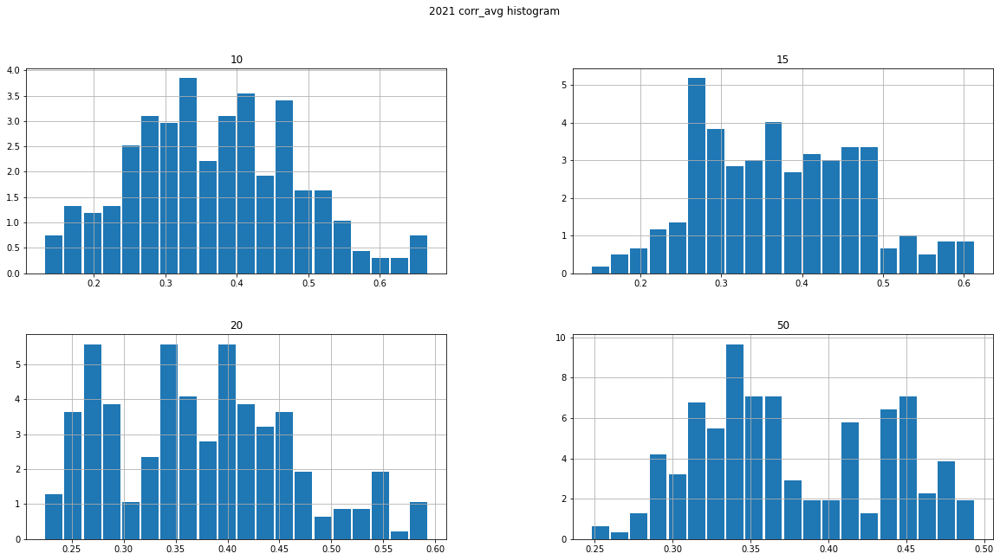

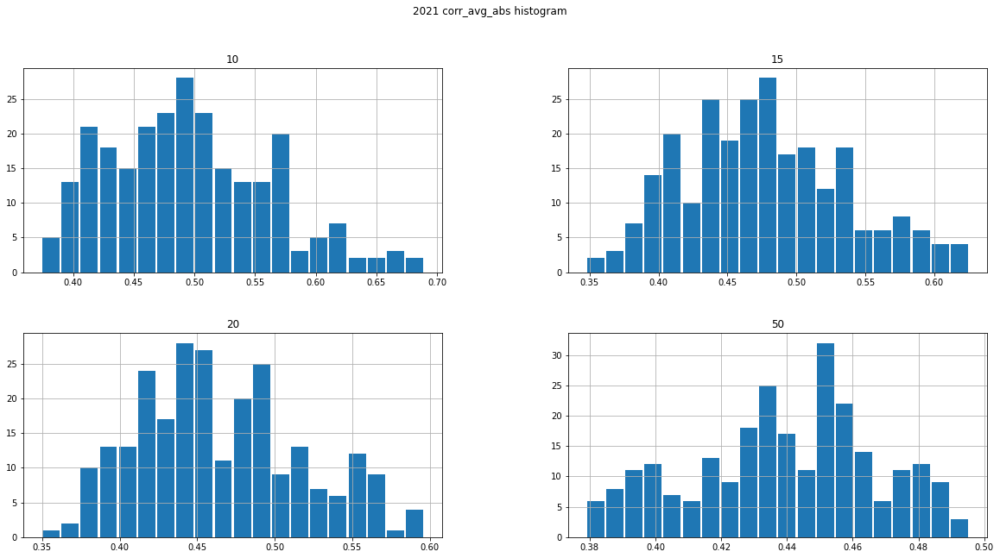

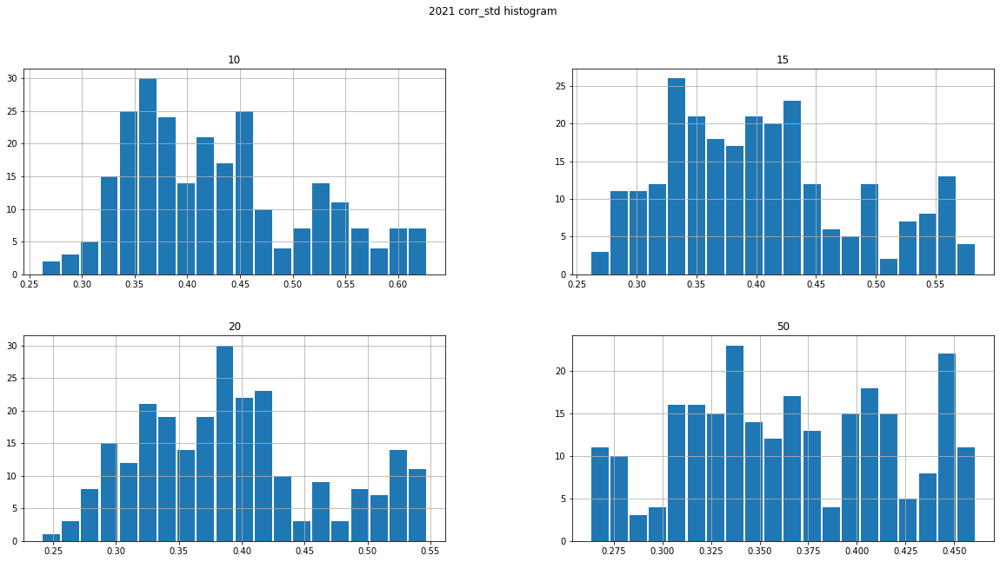

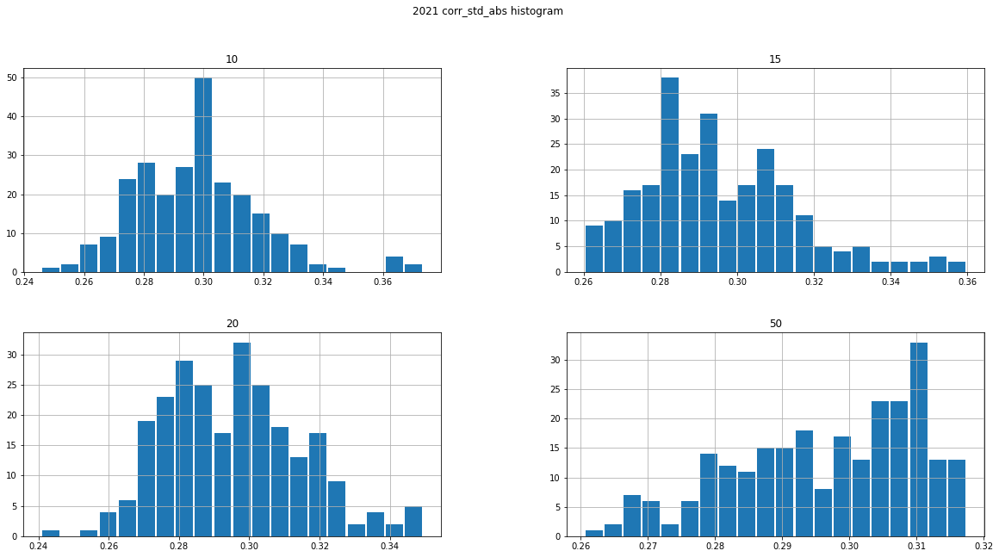

<Figure size 432x288 with 0 Axes>

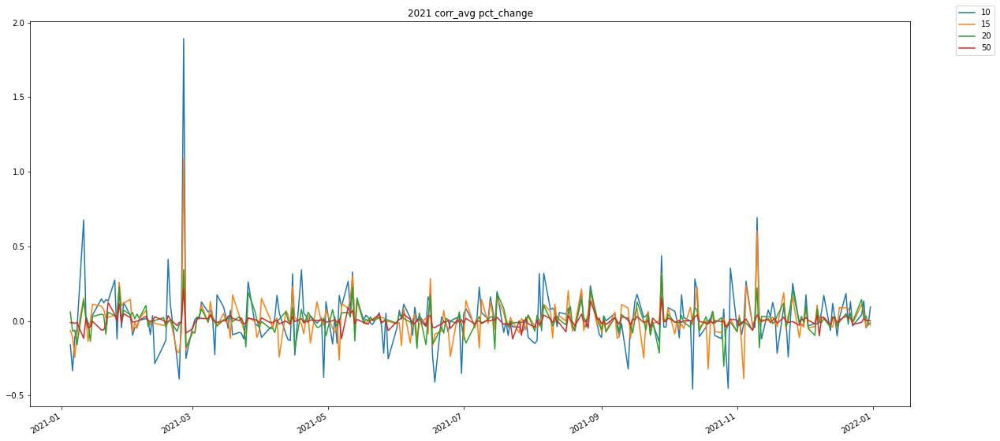

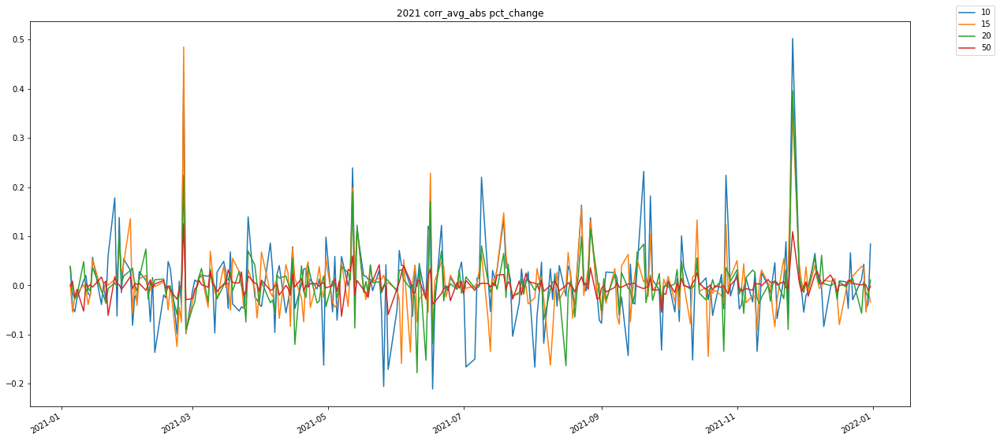

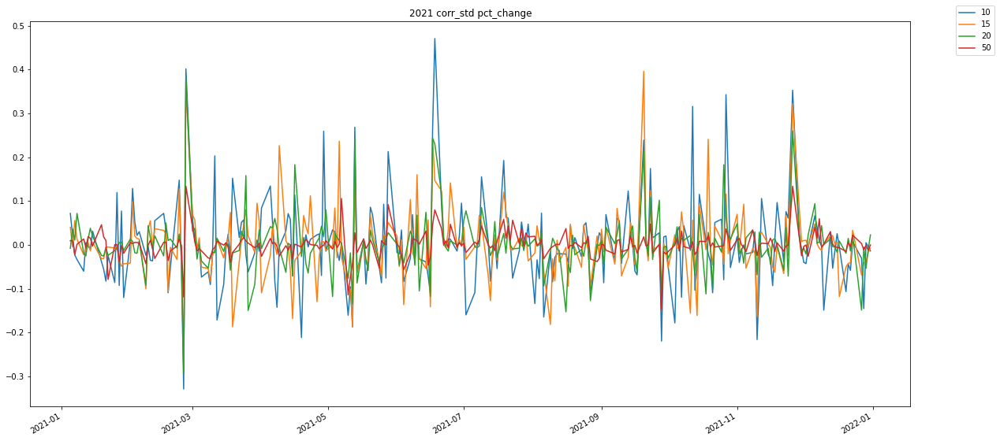

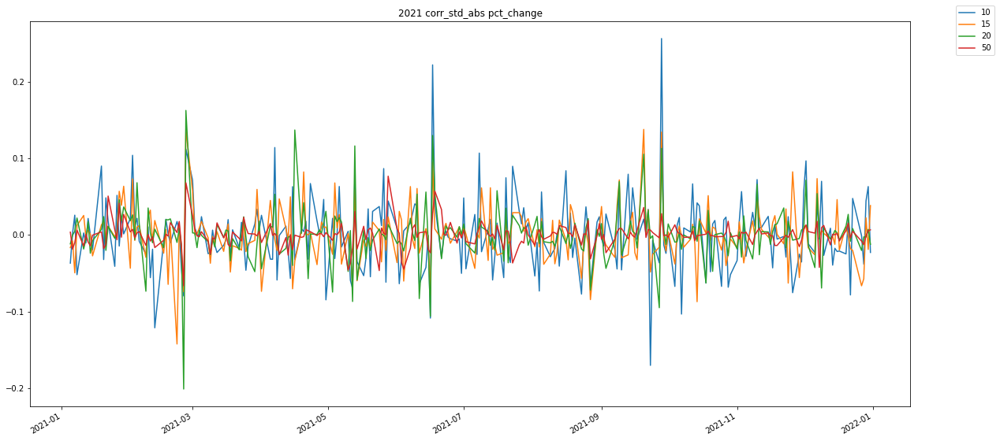

<Figure size 432x288 with 0 Axes>

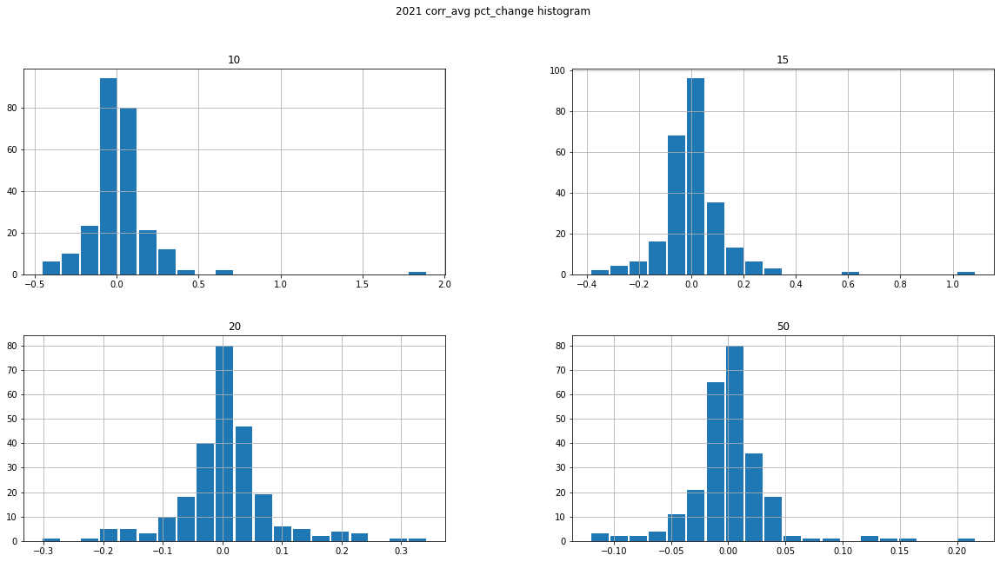

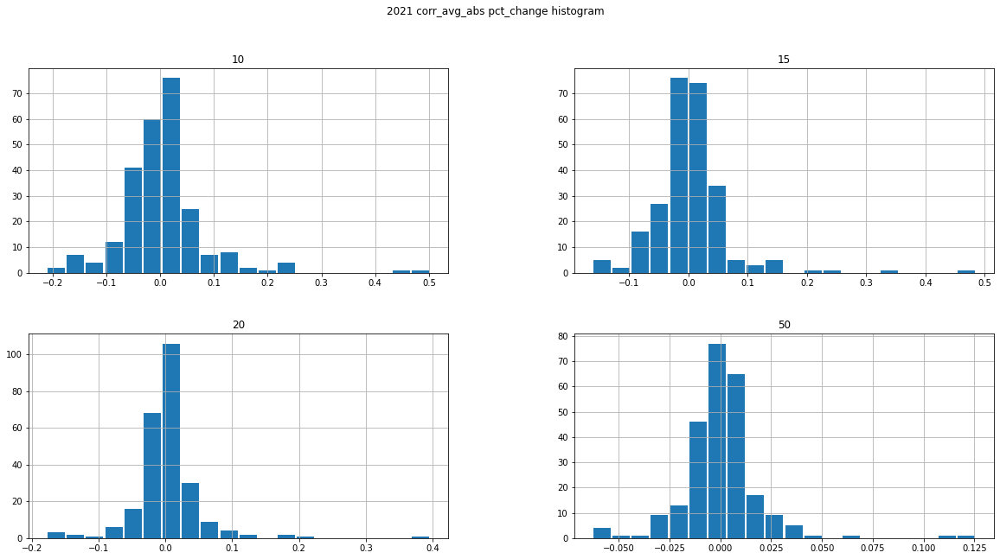

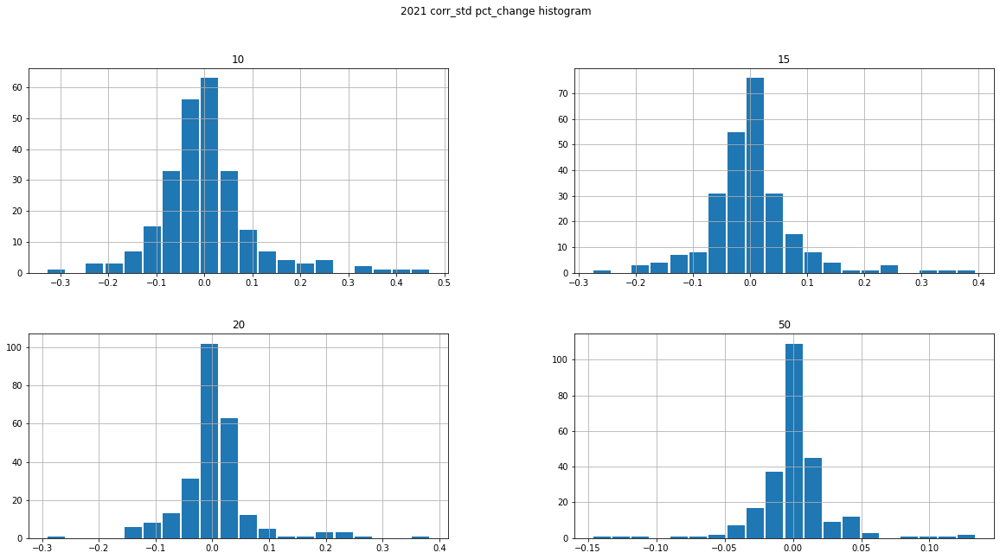

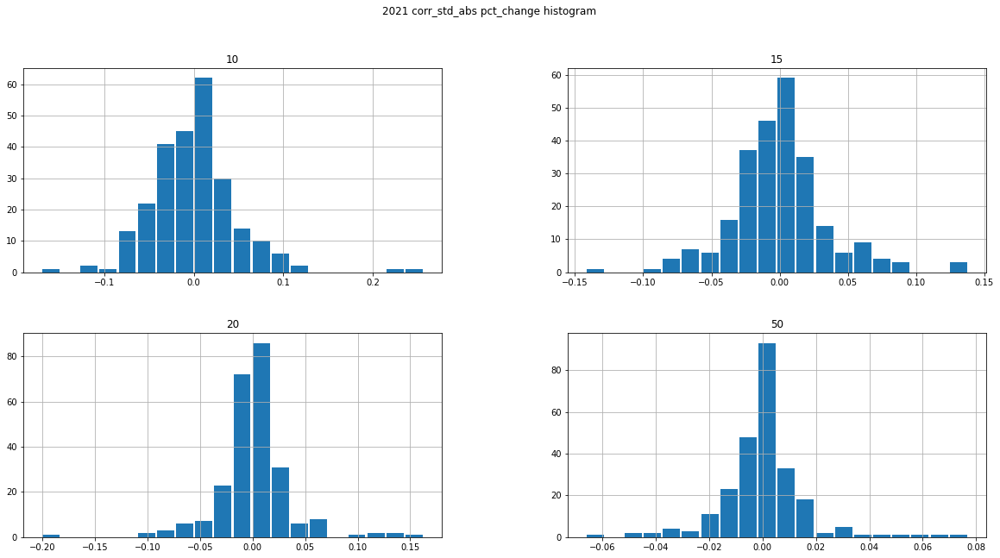

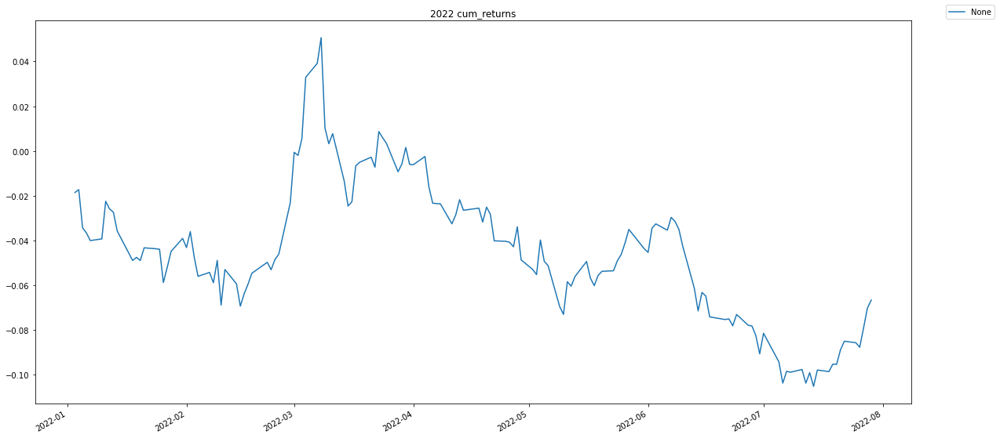

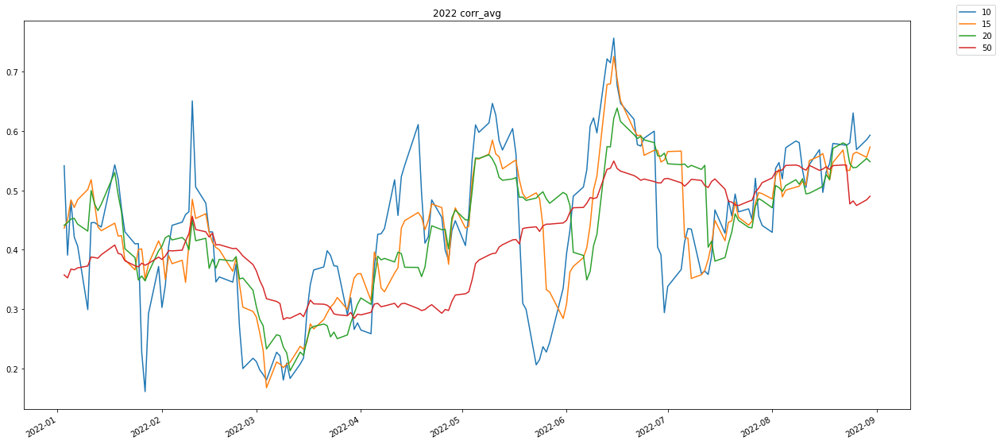

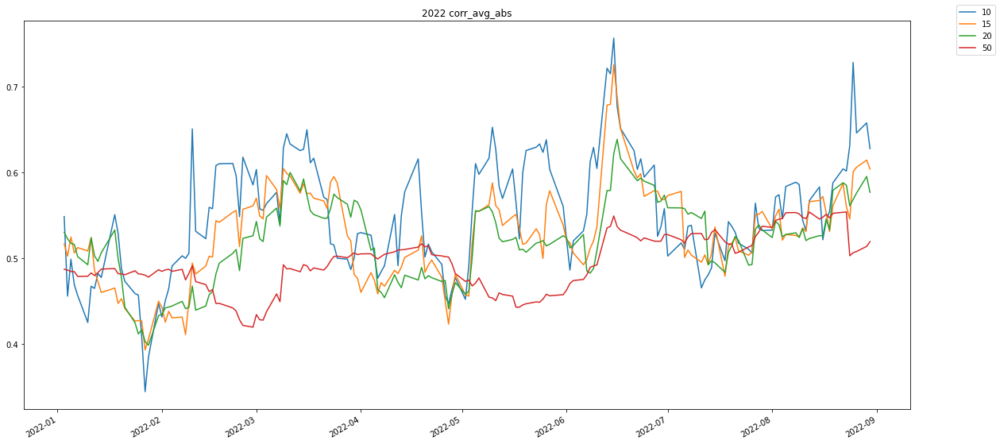

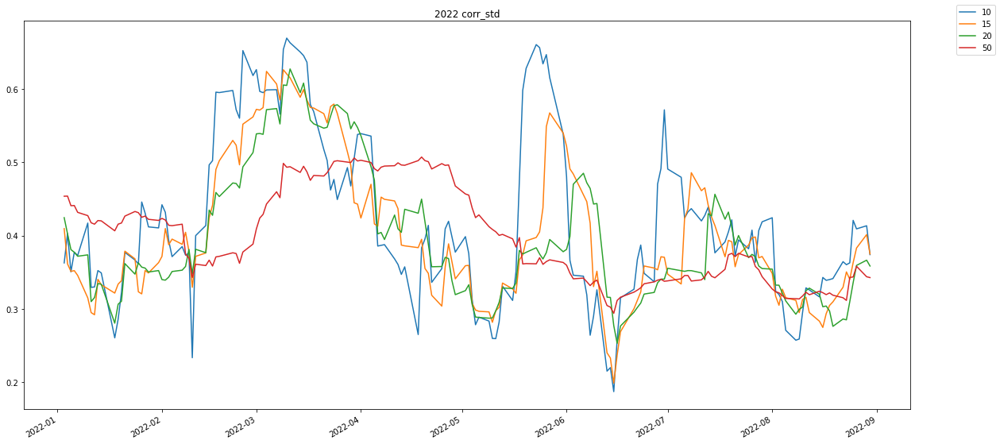

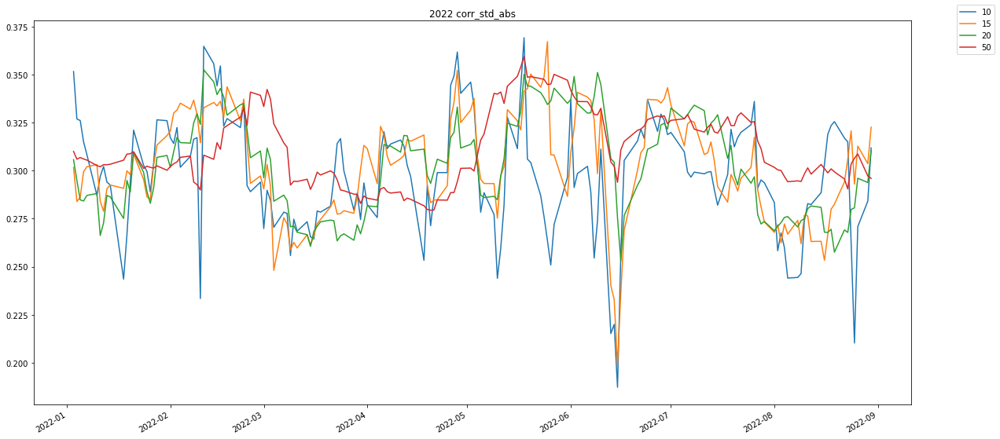

<Figure size 432x288 with 0 Axes>

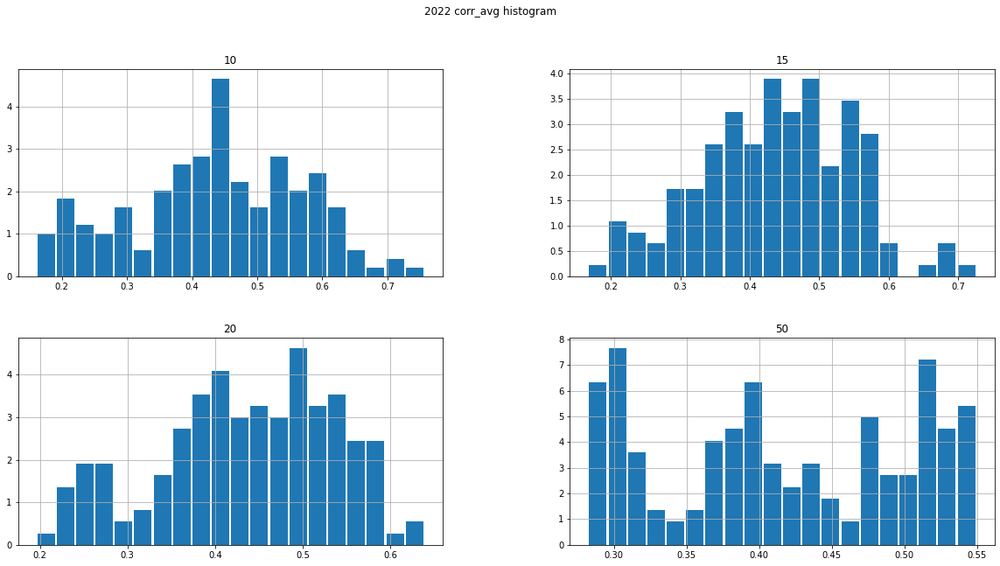

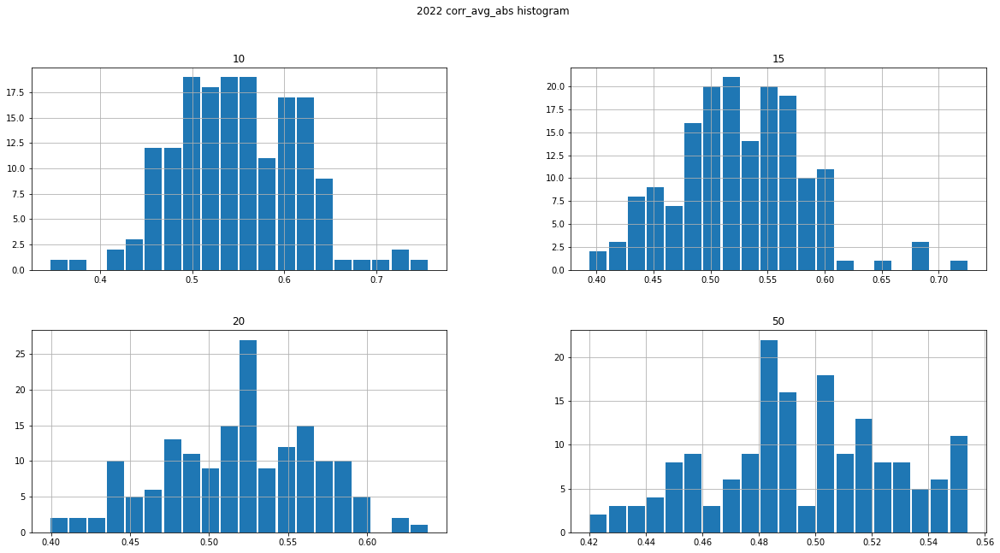

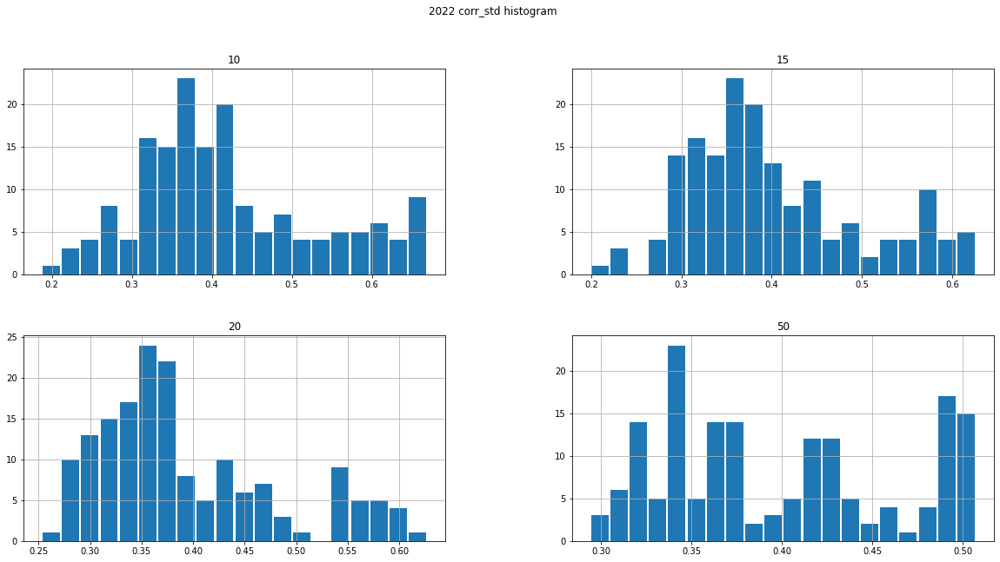

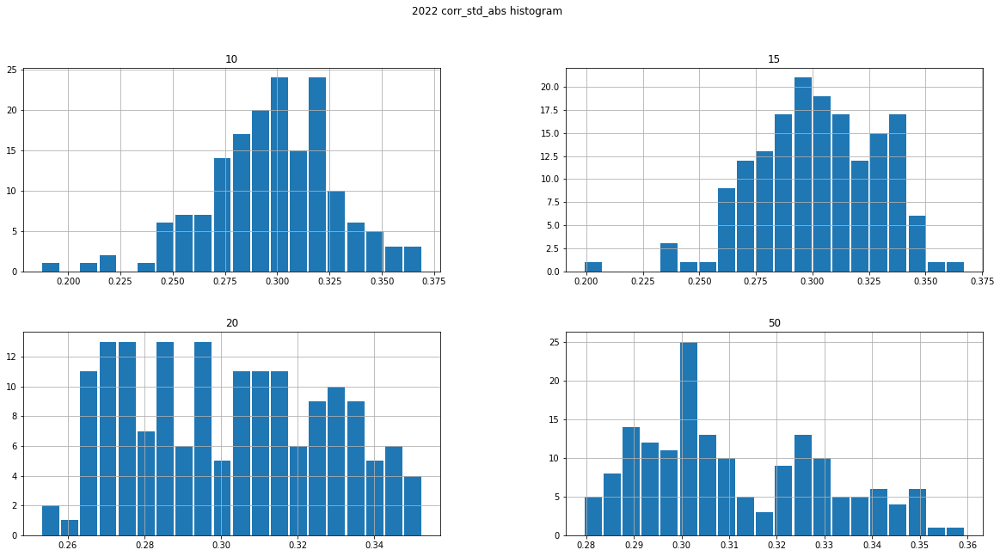

<Figure size 432x288 with 0 Axes>

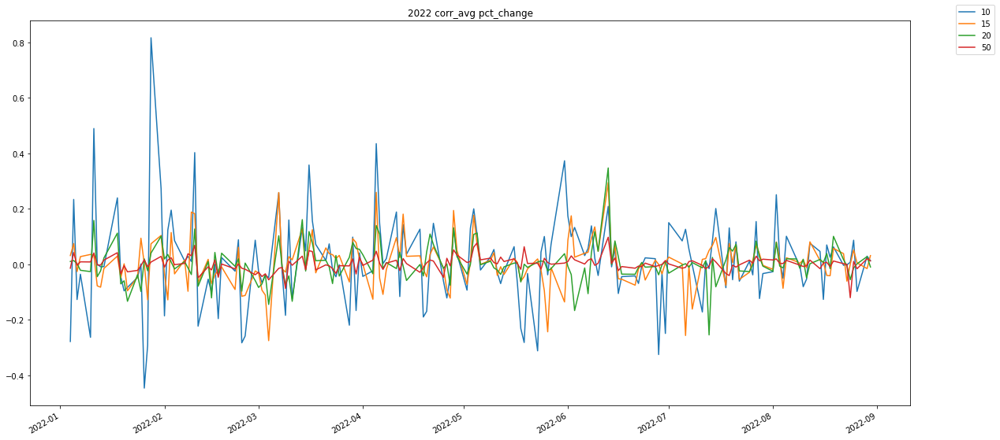

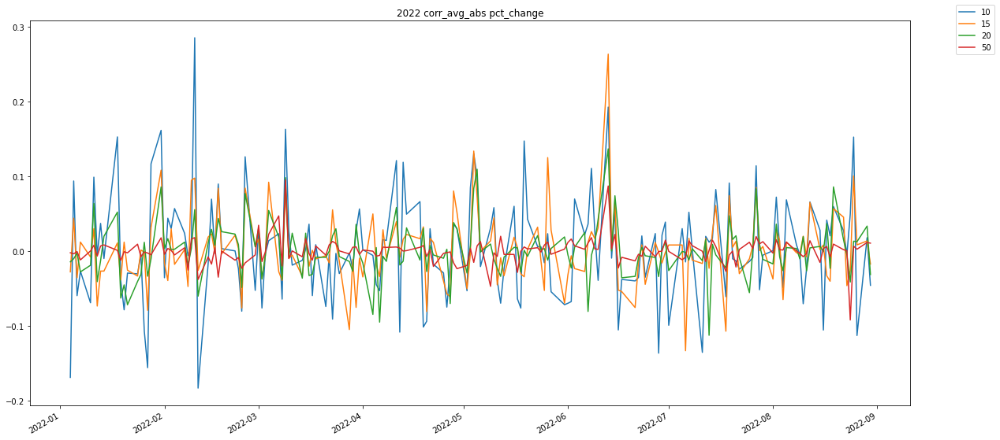

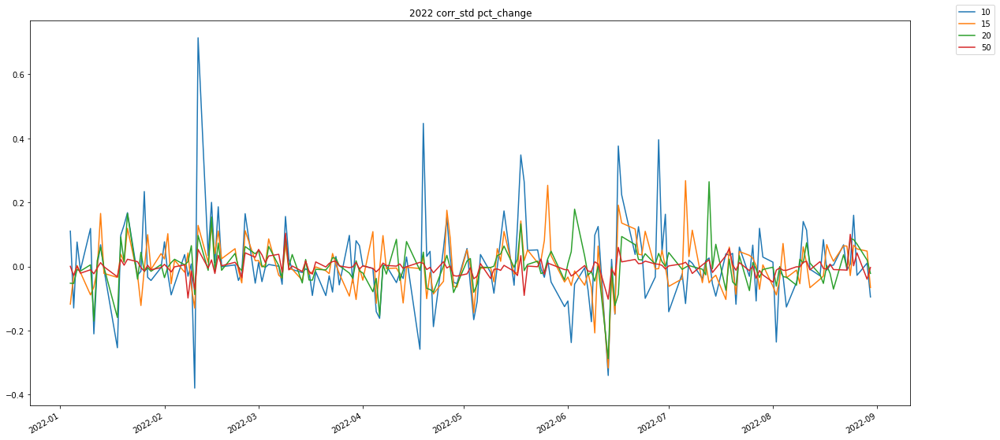

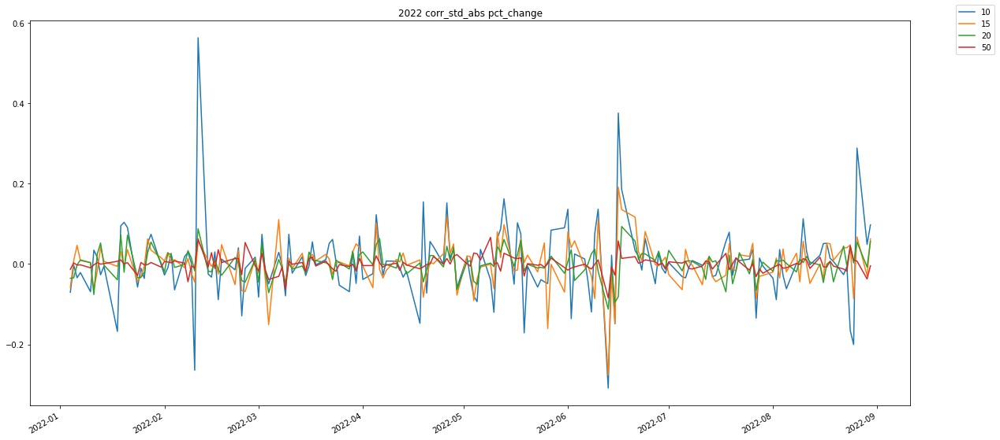

<Figure size 432x288 with 0 Axes>

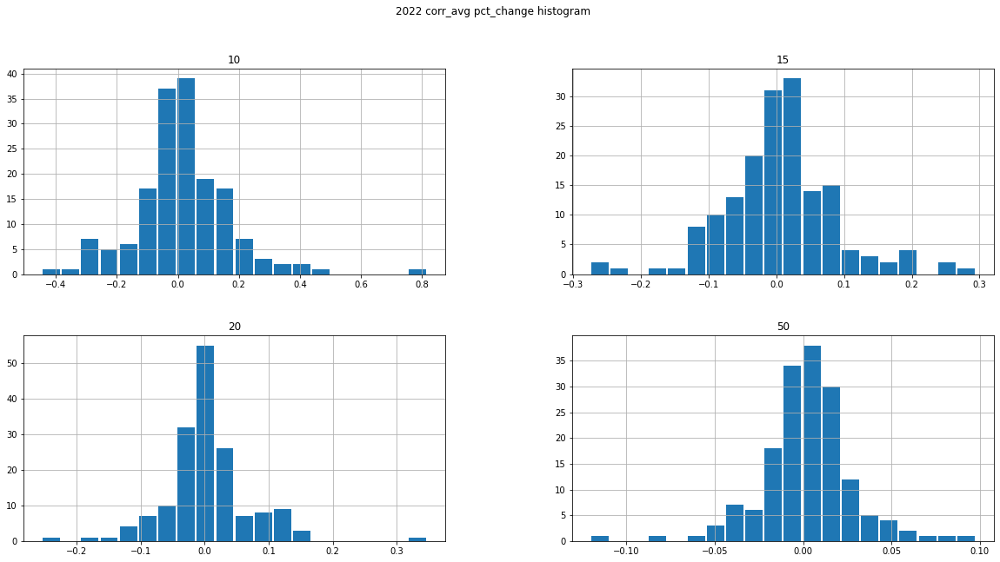

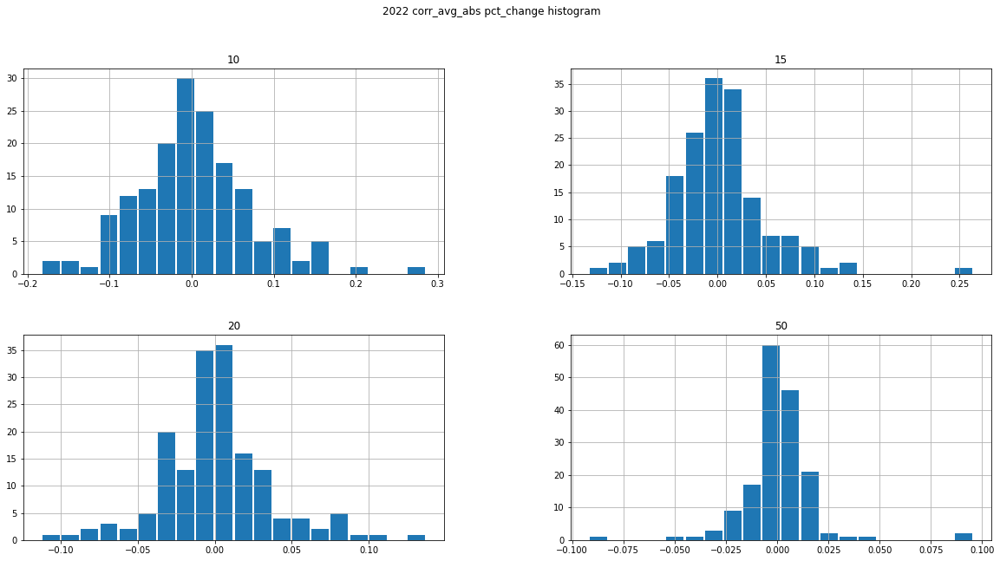

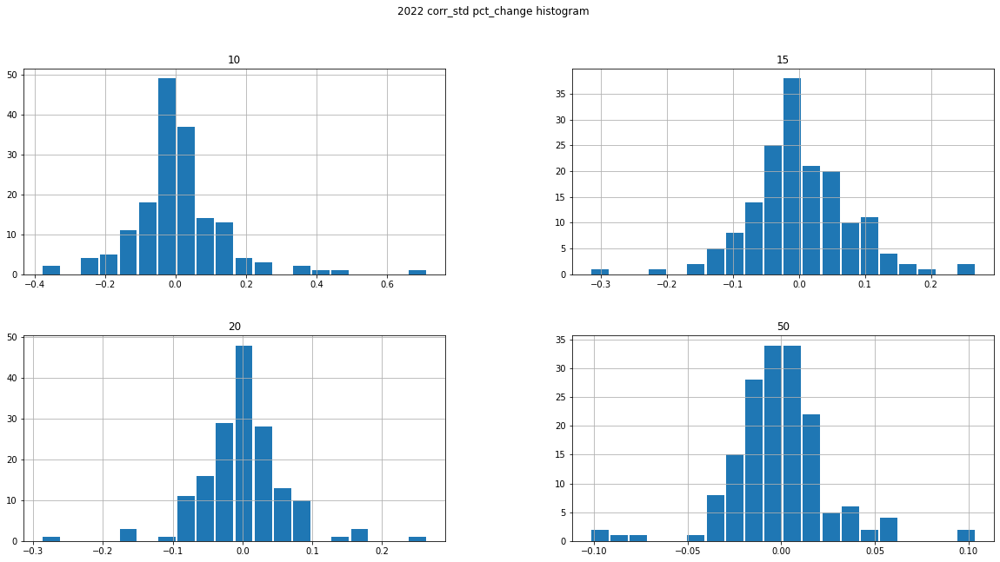

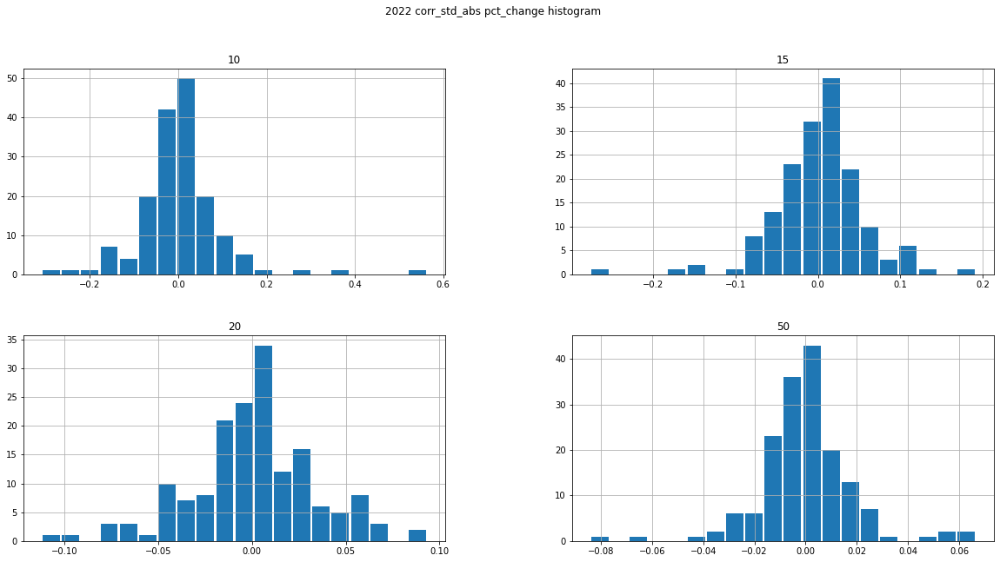

<Figure size 432x288 with 0 Axes>

In [39]:
client = 'agg'
yy = [2008, 2013, 2018, 2019, 2020, 2021, 2022]
client_ret_df.index = pd.to_datetime(client_ret_df.index)
for y in yy:
    cum_returns = empy.cum_returns(client_ret_df[client][str(y)])
    cum_returns.plot(figsize=(20, 10), title='{} cum_returns'.format(y)).legend(bbox_to_anchor=(1.1, 1.05))
    
    # fig, ax = plt.subplots(1, 1, figsize=(20, 10))
    # fig.suptitle(client)
    # ax.bar(client_ret_df[client][str(y)].index, client_ret_df[client][str(y)].values, label=client)
    # ax.set_ylabel('{} daily return'.format(y))
    # ax.legend(bbox_to_anchor=(1.1, 1.05))

    ## values
    corr_avg[str(y)].plot(figsize=(20, 10), title='{} corr_avg'.format(y)).legend(bbox_to_anchor=(1.1, 1.05))
    # plt.show()
    # plt.clf()
    corr_avg_abs[str(y)].plot(figsize=(20, 10), title='{} corr_avg_abs'.format(y)).legend(bbox_to_anchor=(1.1, 1.05))
    # plt.show()
    # plt.clf()
    corr_std[str(y)].plot(figsize=(20, 10), title='{} corr_std'.format(y)).legend(bbox_to_anchor=(1.1, 1.05))
    # plt.show()
    # plt.clf()
    corr_std_abs[str(y)].plot(figsize=(20, 10), title='{} corr_std_abs'.format(y)).legend(bbox_to_anchor=(1.1, 1.05))
    plt.show()
    plt.clf()

    ## histogram
    corr_avg[str(y)].hist(grid=True, bins=20, rwidth=0.9, figsize=(20, 10), density = True)
    plt.suptitle('{} corr_avg histogram'.format(y))
    # plt.show()
    # plt.clf()
    
    corr_avg_abs[str(y)].hist(grid=True, bins=20, rwidth=0.9, figsize=(20, 10))
    plt.suptitle('{} corr_avg_abs histogram'.format(y))
    # plt.show()
    # plt.clf()
    
    corr_std[str(y)].hist(grid=True, bins=20, rwidth=0.9, figsize=(20, 10))
    plt.suptitle('{} corr_std histogram'.format(y))
    # plt.show()
    # plt.clf()
    
    corr_std_abs[str(y)].hist(grid=True, bins=20, rwidth=0.9, figsize=(20, 10))
    plt.suptitle('{} corr_std_abs histogram'.format(y))
    plt.show()
    plt.clf()

    ## pct_change
    corr_avg[str(y)].pct_change().plot(figsize=(20, 10), title='{} corr_avg pct_change'.format(y)).legend(bbox_to_anchor=(1.1, 1.05))
    # plt.show()
    # plt.clf()
    corr_avg_abs[str(y)].pct_change().plot(figsize=(20, 10), title='{} corr_avg_abs pct_change'.format(y)).legend(bbox_to_anchor=(1.1, 1.05))
    # plt.show()
    # plt.clf()
    corr_std[str(y)].pct_change().plot(figsize=(20, 10), title='{} corr_std pct_change'.format(y)).legend(bbox_to_anchor=(1.1, 1.05))
    # plt.show()
    # plt.clf()
    corr_std_abs[str(y)].pct_change().plot(figsize=(20, 10), title='{} corr_std_abs pct_change'.format(y)).legend(bbox_to_anchor=(1.1, 1.05))
    plt.show()
    plt.clf()

    ## histogram
    
    corr_avg[str(y)].pct_change().hist(grid=True, bins=20, rwidth=0.9, figsize=(20, 10))
    plt.suptitle('{} corr_avg pct_change histogram'.format(y))
    # plt.show()
    # plt.clf()
    
    corr_avg_abs[str(y)].pct_change().hist(grid=True, bins=20, rwidth=0.9, figsize=(20, 10))
    plt.suptitle('{} corr_avg_abs pct_change histogram'.format(y))
    # plt.show()
    # plt.clf()
    
    corr_std[str(y)].pct_change().hist(grid=True, bins=20, rwidth=0.9, figsize=(20, 10))
    plt.suptitle('{} corr_std pct_change histogram'.format(y))
    # plt.show()
    # plt.clf()
    
    corr_std_abs[str(y)].pct_change().hist(grid=True, bins=20, rwidth=0.9, figsize=(20, 10))
    plt.suptitle('{} corr_std_abs pct_change histogram'.format(y))
    plt.show()
    plt.clf()


In [9]:
## sliding correlation

# lookback = [5, 10, 21, 21*3, 21*6, 252] # days
lookback = [10, 15, 20, 50] 

lb_corr = {}
lb_corr_pct = {}
for lb in lookback:
    df_corr = df.rolling(lb).corr()[client_ret_df.columns]
    df_corr['mean'] = df_corr.mean(axis=1)
    df_corr.index.names = ['date', 'case']
    df_corr = df_corr.reset_index()
    pt = df_corr.pivot_table(index='date', values=list(client_ret_df.columns) + ['mean'], columns='case')
    pt_pct = pt.pct_change()
    lb_corr[lb] = pt
    lb_corr_pct[lb] = pt_pct

In [10]:
lb_corr_df = pd.concat(lb_corr.values(), keys=lb_corr.keys(), axis=1)
lb_corr_pct_df = pd.concat(lb_corr_pct.values(), keys=lb_corr_pct.keys(), axis=1)

In [ ]:
lb_corr_df

In [ ]:
# for lb, df_corr in lb_corr.items():
for lb in [5, 10, 21, 252]:
    df_corr = lb_corr[lb]
    pt = df_corr['mean']
    pt_pct = lb_corr_pct[lb]['mean']

    for case in ['xxz', 'xzz', 'TIP', 'TLT', 'GLD', 'LQD']:
        ax1 = pt.loc[:, pt.columns.str.startswith(case)].plot(kind='bar', figsize=(20, 10), title='{} lookback {} correlation'.format(case, lb))
        for i, t in enumerate(ax1.get_xticklabels()):
            if (i % 252*3) != 0:
                t.set_visible(False)
        ax1.legend(bbox_to_anchor=(1.1, 1.05))

        pt_pct.loc[:, pt_pct.columns.str.startswith(case)].plot(figsize=(20, 10), title='{} lookback {} correlation pct_change'.format(case, lb))
        ax2 = client_ret_df.plot.bar(figsize=(20, 10), title='daily return')
        for i, t in enumerate(ax2.get_xticklabels()):
            if (i % 252*3) != 0:
                t.set_visible(False)
        ax2.legend(bbox_to_anchor=(1.1, 1.05))
        plt.show()
        plt.clf()

In [14]:
# lb_corr_df.to_csv('./result/2022/portfolioY/sliding_corr.csv')
lb_corr_pct_df.to_csv('./result/2022/portfolioY/sliding_corr_pct.csv')

In [ ]:
# pt.plot()
for lb, df_corr in lb_corr.items():
    df_corr.index.names = ['date', 'case']
    df_corr = df_corr.reset_index()
    pt = df_corr.pivot_table(index='date', values='mean', columns='case')
    pt_pct = pt.pct_change()

    for asset in ['DBC', 'EEM', 'IYR', 'TLT', 'VTI', 'SPY', 'QQQ', 'VGK', 'EWJ', 'GLD', 'LQD', 'VYM', 'TIP', 'xxz', 'xzz']:
        # pt.loc[:, pt.columns.str.startswith(asset)].plot(figsize=(12, 10), title='{} lookback {} days'.format(asset, lb))
        pt_pct.loc[:, "{}_pp10".format(asset)].plot(figsize=(12, 10), title='{} lookback {} days'.format(asset, lb))
        plt.show()
        plt.clf()
        for yy in range(2008, 2023):
            # pt.loc[str(yy), pt.columns.str.startswith(asset)].plot(figsize=(12, 10), title='{} lookback {} days'.format(asset, lb))
            pt_pct.loc[str(yy), "{}_pp10".format(asset)].plot(figsize=(12, 10), title='{} lookback {} days'.format(asset, lb))
            plt.show()
            plt.clf()
            break
        break
    break


In [ ]:
# pt.plot()
# cum_returns = empy.cum_returns(client_ret_df)
# for yy in range(2008, 2023):
yy = 2008
if True:
    client_ret_yy = client_ret_df[str(yy)]
    cum_returns_yy = empy.cum_returns(client_ret_yy)

    fig, ax = plt.subplots(2, 1, figsize=(12, 20))
    fig.suptitle('{}'.format(yy))
            
    # ax2 = ax1.twinx()
    ax[0].plot(cum_returns_yy.index, cum_returns_yy.values, label=cum_returns_yy.columns)
    ax[0].set_ylabel('cum_returns')
    ax[0].legend(bbox_to_anchor=(1.1, 1.05))

    # dates = [time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(date)) for date in epochs]
    # ax[1].plot(client_ret_df.index, client_ret_df.values, label=client_ret_df.columns)
    # pd.concat([client_ret_df, pt[col]], axis=1).plot(kind='bar', ax=ax[1])
            
    # ttt = client_ret_df[str(yy)]
    # ttt.indx = ttt.index.astype(str)
    client_ret_yy.plot(kind='bar', ax=ax[1])
    ax[1].set_ylabel('daily return')
    # ax[1].set_xticks(["{}_{}".format(yy, i) for i in range(1, 13)])
    # ax[1].xaxis.set_major_formatter(DateFormatter("%Y"))
    ax[1].legend(bbox_to_anchor=(1.1, 1.05))

    for lb, df_corr in lb_corr.items():
        pt = df_corr.loc[:, df_corr.columns.get_level_values(0) == 'mean']
        pt_pct = lb_corr_pct[lb].loc[:, lb_corr_pct[lb].columns.get_level_values(0) == 'mean']
    
        for col in pt.columns:
            fig, ax = plt.subplots(2, 1, figsize=(12, 20))
            fig.suptitle('{} {} lookback {} days'.format(col, yy, lb))

            ax[0].bar(pt[col][str(yy)].index, pt[col][str(yy)].values, label=col)
            ax[0].set_ylabel('correlation')
            ax[0].legend(bbox_to_anchor=(1.1, 1.05))

            ax[1].bar(pt_pct[col][str(yy)].index, pt_pct[col][str(yy)].values, label=col)
            ax[1].set_ylabel('correlation pct_change')
            ax[1].legend(bbox_to_anchor=(1.1, 1.05))


    """
    for asset in ['DBC', 'EEM', 'IYR', 'TLT', 'VTI', 'SPY', 'QQQ', 'VGK', 'EWJ', 'GLD', 'LQD', 'VYM', 'TIP', 'xxz', 'xzz']:
        pt.loc[:, pt.columns.str.startswith(asset)].plot(figsize=(12, 10), title='{} lookback {} days'.format(asset, lb))
    """

In [ ]:
metrics4portfolio = {}
for client in client_ret.keys():
    portfolioY = (client_ret[client]>=0).astype(int)
    prec_ser, acccc_ser, recall_ser, recall0_ser, f1score_ser, f0score_ser = cal_metric(portfolioY, preds)
    metrics4portfolio[client] = pd.concat([acccc_ser, prec_ser, recall_ser, recall0_ser, f1score_ser, f0score_ser], axis=1)
metrics4portfolio_df = pd.concat(metrics4portfolio.values(), keys=metrics4portfolio.keys(), axis=1)
metrics4portfolio_df

In [ ]:
metrics4portfolio_df.groupby(level=1, axis=1).mean().sort_values('accuracy', ascending=False)